# Default (not grid search) RF models: RF, RF_BCW, BRFC, BRFC_BCW

In [519]:
from matplotlib import pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve, precision_recall_curve, auc, recall_score, confusion_matrix
import sys 
sys.path.append('../../')
from RF_atomver import *
import pandas as pd
import numpy as np

In [584]:
# metric_cols = ['prediction', 'accuracy', 'precision', 'recall', 'specificity',
#        'prob_class0', 'prob_class1', 'y', 'TN', 'FN', 'FP', 'TP', 'subset',
#        'model', 'cm', 'prediction_type', 'NEK', 'feat_type', 'strategy',
#        'RF_type']
metric_cols = ['accuracy', 'precision', 'recall', 'specificity',
                'TN', 'FN', 'FP', 'TP','f1', 'ROC-AUC', 'MCC', 'Balanced Accuracy',
       'model', 'cm', 'prediction_type', 'NEK', 'feat_type', 'strategy',
       'RF_type']
# Index(['prediction', 'accuracy', 'precision', 'recall', 'specificity',
#        'prob_class0', 'prob_class1', 'y', 'TN', 'FN', 'FP', 'TP', 'subset',
#        'model', 'cm', 'prediction_type', 'NEK', 'feat_type', 'strategy',
#        'RF_type', 'ROC-AUC', 'f1', 'MCC', 'Balanced Accuracy'],
#       dtype='object')
ratio_df = pd.read_csv('/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/dataset_creation/all_NEK_dataset_sizes.csv') 
ratio_df.columns

Index(['NEK', 'dataset', 'strategy', 'feat_type', 'num_samples_train',
       'actives_train', 'active%_train', 'num_samples_test', 'actives_test',
       'active%_test', 'total_size', 'total_actives', 'total % actives'],
      dtype='object')

In [525]:
result_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_results/'
pickle_path  = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_pickles/'
rf_types = ['RF', 'RF_BCW', 'BRFC', 'BRFC_BCW']
nek_nums = [2,3,5,9]
samplings = ['scaled', 'UNDER', 'SMOTE', 'ADASYN'] 
features = ['moe', 'mfp']
NEK= 'NEK'
count=0
nektypes = ['binding', 'inhibition'] 
train_results = [] 
test_results = [] 
for i, n in enumerate(nek_nums):
    nek = str(n)
    for bi in nektypes: 
        for k, feat in enumerate(features): 
            print()
            for j, samp in enumerate(samplings): 
                for rf in rf_types: 
                    if bi == 'binding': 
                        count+=1
                        print(f'{count}. NEK{nek} binding {feat} {samp} {rf}')
                        file_root = f'NEK{nek}_binding_{feat}_{samp}_{rf}'
                   
                        train = pd.read_csv(f'{result_path}{file_root}_train.csv') 
                        test = pd.read_csv(f'{result_path}{file_root}_test.csv') 
        
                        train_results.append(train.iloc[[0]][metric_cols].values.flatten())
                        test_results.append(test.iloc[[0]][metric_cols].values.flatten())
                        
                
                    if (n == 2 or n == 9) and bi=='inhibition':
                        
                        count+=1
                        print(f'{count}. NEK{nek} inhibition {feat} {samp} {rf}')
                        file_root = f'NEK{nek}_inhibition_{feat}_{samp}_{rf}'
                   
                        train = pd.read_csv(f'{result_path}{file_root}_train.csv') 
                        test = pd.read_csv(f'{result_path}{file_root}_test.csv') 
        
                        train_results.append(train.iloc[[0]][metric_cols].values.flatten())
                        test_results.append(test.iloc[[0]][metric_cols].values.flatten())
            
    print()


1. NEK2 binding moe scaled RF
2. NEK2 binding moe scaled RF_BCW
3. NEK2 binding moe scaled BRFC
4. NEK2 binding moe scaled BRFC_BCW
5. NEK2 binding moe UNDER RF
6. NEK2 binding moe UNDER RF_BCW
7. NEK2 binding moe UNDER BRFC
8. NEK2 binding moe UNDER BRFC_BCW
9. NEK2 binding moe SMOTE RF
10. NEK2 binding moe SMOTE RF_BCW
11. NEK2 binding moe SMOTE BRFC
12. NEK2 binding moe SMOTE BRFC_BCW
13. NEK2 binding moe ADASYN RF
14. NEK2 binding moe ADASYN RF_BCW
15. NEK2 binding moe ADASYN BRFC
16. NEK2 binding moe ADASYN BRFC_BCW

17. NEK2 binding mfp scaled RF
18. NEK2 binding mfp scaled RF_BCW
19. NEK2 binding mfp scaled BRFC
20. NEK2 binding mfp scaled BRFC_BCW
21. NEK2 binding mfp UNDER RF
22. NEK2 binding mfp UNDER RF_BCW
23. NEK2 binding mfp UNDER BRFC
24. NEK2 binding mfp UNDER BRFC_BCW
25. NEK2 binding mfp SMOTE RF
26. NEK2 binding mfp SMOTE RF_BCW
27. NEK2 binding mfp SMOTE BRFC
28. NEK2 binding mfp SMOTE BRFC_BCW
29. NEK2 binding mfp ADASYN RF
30. NEK2 binding mfp ADASYN RF_BCW
31. N

In [526]:
train_df =  pd.DataFrame(train_results,columns=metric_cols)
train_df['NEK'] =train_df['model'].str[0:4]+'_'+train_df['model'].str.extract(r'_(.*?)_', expand=False)
train_df
test_df =  pd.DataFrame(test_results,columns=metric_cols)
test_df['NEK'] =test_df['model'].str[0:4]+'_'+test_df['model'].str.extract(r'_(.*?)_', expand=False)
train_df['model'] = train_df['model'].str.replace('scaled', 'raw')
test_df['model'] = test_df['model'].str.replace('scaled', 'raw')
train_df['strategy'] = train_df['strategy'].str.replace('scaled', 'raw')
test_df['strategy'] = test_df['strategy'].str.replace('scaled', 'raw')
train_df.to_csv(result_path+'RF_train_results_all_NEK.csv', index=False) 
test_df.to_csv(result_path+'RF_test_results_all_NEK.csv', index=False) 
test_df

,accuracy,precision,recall,specificity,TN,FN,FP,TP,f1,ROC-AUC,MCC,Balanced Accuracy,model,cm,prediction_type,NEK,feat_type,strategy,RF_type
0,0.957597,0.000000,0.000000,1.000000,271,12,0,0,0.000000,0.500000,0.000000,0.500000,NEK2_binding_moe_raw_RF,"[271, 0, 12, 0]",TN,NEK2_binding,moe,raw,RF
1,0.961131,1.000000,0.083333,1.000000,271,11,0,1,0.153846,0.541667,0.282989,0.541667,NEK2_binding_moe_raw_RF_BCW,"[271, 0, 11, 1]",TN,NEK2_binding,moe,raw,RF_BCW
2,0.745583,0.094595,0.583333,0.752768,204,5,67,7,0.162791,0.668050,0.154119,0.668050,NEK2_binding_moe_raw_BRFC,"[204, 67, 5, 7]",TN,NEK2_binding,moe,raw,BRFC
3,0.742049,0.093333,0.583333,0.749077,203,5,68,7,0.160920,0.666205,0.151771,0.666205,NEK2_binding_moe_raw_BRFC_BCW,"[203, 68, 5, 7]",TN,NEK2_binding,moe,raw,BRFC_BCW
4,0.696113,0.069767,0.500000,0.704797,191,6,80,6,0.122449,0.602399,0.089726,0.602399,NEK2_binding_moe_UNDER_RF,"[191, 80, 6, 6]",TN,NEK2_binding,moe,UNDER,RF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,0.875000,0.454545,0.555556,0.915493,65,4,6,5,0.500000,0.735524,0.432210,0.735524,NEK9_inhibition_mfp_SMOTE_BRFC_BCW,"[65, 6, 4, 5]",TN,NEK9_inhibition,mfp,SMOTE,BRFC_BCW
188,0.875000,0.454545,0.555556,0.915493,65,4,6,5,0.500000,0.735524,0.432210,0.735524,NEK9_inhibition_mfp_ADASYN_RF,"[65, 6, 4, 5]",TN,NEK9_inhibition,mfp,ADASYN,RF
189,0.887500,0.500000,0.555556,0.929577,66,4,5,5,0.526316,0.742567,0.463513,0.742567,NEK9_inhibition_mfp_ADASYN_RF_BCW,"[66, 5, 4, 5]",TN,NEK9_inhibition,mfp,ADASYN,RF_BCW
190,0.875000,0.454545,0.555556,0.915493,65,4,6,5,0.500000,0.735524,0.432210,0.735524,NEK9_inhibition_mfp_ADASYN_BRFC,"[65, 6, 4, 5]",TN,NEK9_inhibition,mfp,ADASYN,BRFC


In [527]:
df_all = pd.read_csv(result_path+'RF_test_results_all_NEK.csv')
df_all['dataset_category'] = df_all['feat_type'].astype(str)+'_'+df_all['strategy']
drop_cols = ['prediction', 'subset','prediction_type']
df_all.columns

Index(['accuracy', 'precision', 'recall', 'specificity', 'TN', 'FN', 'FP',
       'TP', 'f1', 'ROC-AUC', 'MCC', 'Balanced Accuracy', 'model', 'cm',
       'prediction_type', 'NEK', 'feat_type', 'strategy', 'RF_type',
       'dataset_category'],
      dtype='object')

In [528]:
df_all['dataset_category'].unique()
moes = sns.color_palette('Blues', 4) 
mfps = sns.color_palette('YlOrBr', 4)
dataset_palette = moes+mfps
feat_palette_dict = {}
feat_types = df_all['feat_type'].unique()
strategies = df_all['strategy'].unique()
# for i, feat in enumerate(feat_types):
#     for j, strat in enumerate(strategies):
#         feat_palette_dict[(feat,strat)] = dataset_palette[i*len(strategies)+j]
        
def get_color(feat_type, strategy):
    return feat_palette_dict[(feat_type,strategy)]
palette_dict = {strategy: color for strategy, color in zip(strategies, dataset_palette)}

raws = sns.color_palette('Grays', 1) 
smotes = sns.color_palette('Greens', 1)
unders = sns.color_palette('Reds',1) # Purples, RdPu, Reds, YlGn, YlGnBu, YlOrBr, YlOrRd, BuPu, BuGn , dark:salmon_r
adasyns = sns.color_palette('Purples',1)
sampling_palette = raws+smotes+unders+adasyns

In [529]:
moes

[(0.8141176470588235, 0.883921568627451, 0.9498039215686275),
 (0.5796078431372549, 0.7701960784313725, 0.8737254901960784),
 (0.2909803921568628, 0.5945098039215686, 0.7890196078431373),
 (0.09019607843137256, 0.39294117647058824, 0.6705882352941177)]

# Plot recall scores, with rf type on x, for each NEK

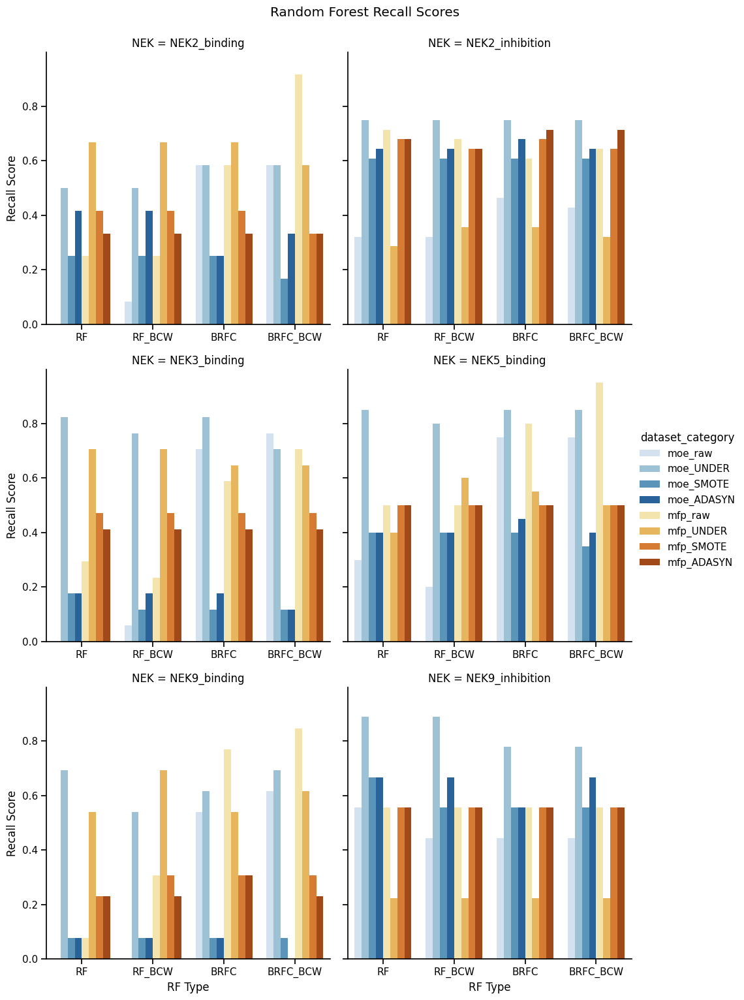

In [756]:
p1 = sns.catplot(
    data=df_all, x='RF_type', y='recall', hue='dataset_category', 
    col='NEK', kind='bar', sharex=False, legend_out=True, 
    palette=dataset_palette, col_wrap=2
)
p1.set_axis_labels(x_var='RF Type', y_var='Recall Score')
plt.ylabel('Recall Score')
plt.suptitle('Random Forest Recall Scores', y=1.02) 

plt.savefig('figures/RF_plots/all_RF_recall.png')
plt.show(); 


# nek_values = df_all['NEK'].unique()
# dataset_categories = df_all['dataset_category'].unique()
# # for ax_row in p1.axes.flatten():
# #     for ax in ax_row:
# #         ax.legend(loc='upper right')  

# for i, nek_value in enumerate(df_all['NEK'].unique()):
#     fig = p1.fig
#     fig.savefig(f'figures/RF_plots/{nek_value}_recall.png', bbox_inches='tight')
#     plt.close(fig)


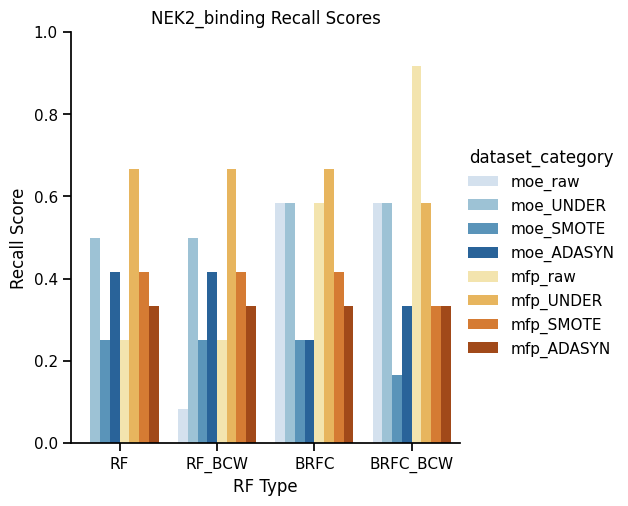

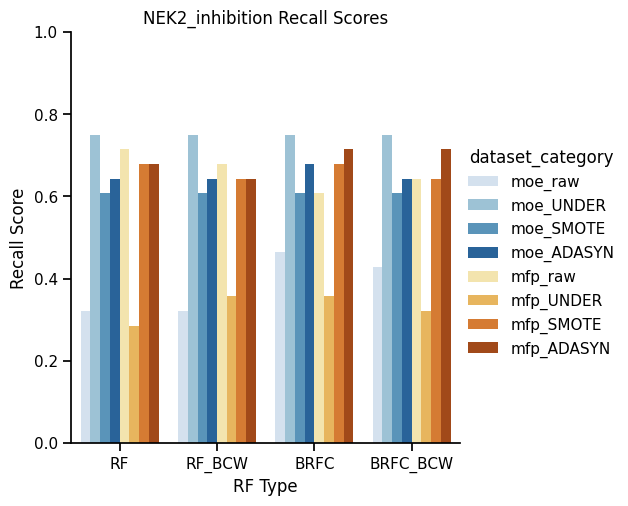

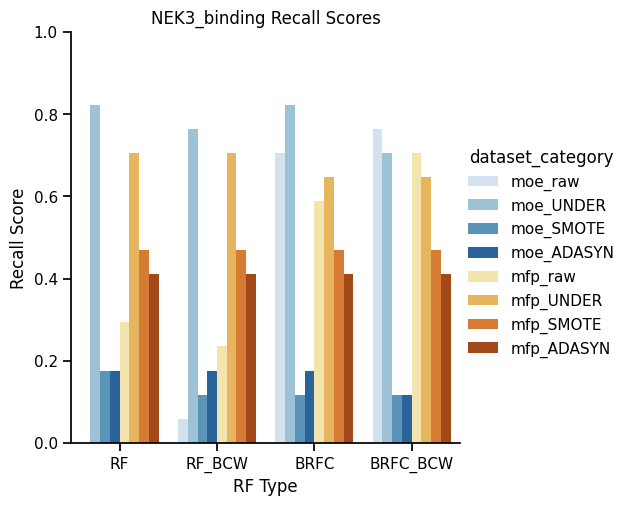

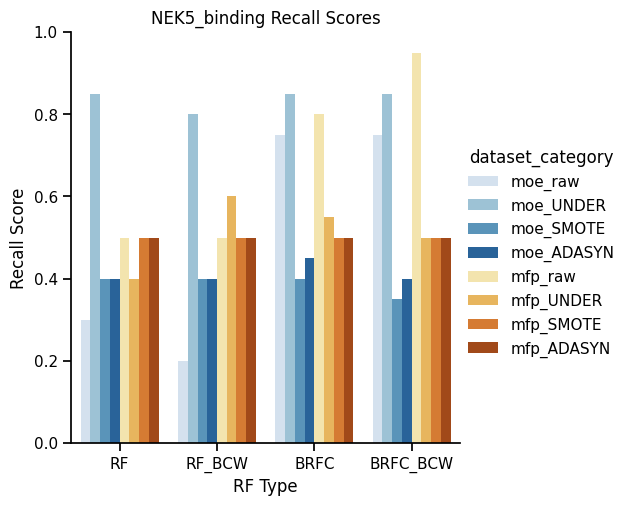

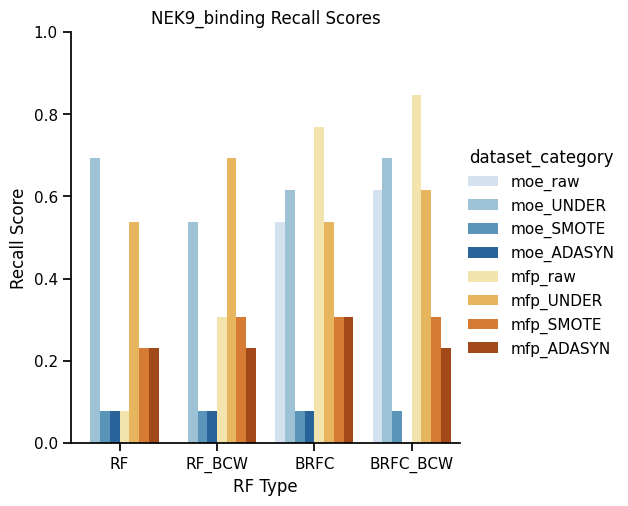

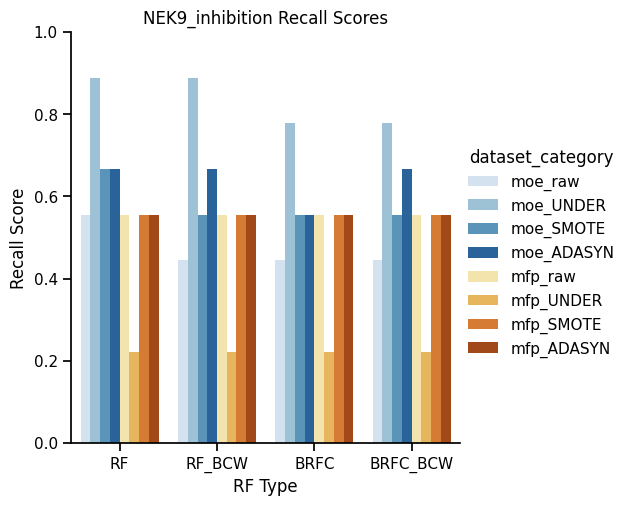

In [491]:
# save individual figures 
for nek in neks:
    nek_df = df_all[df_all['NEK']==nek]
    p1individ = sns.catplot(
        data=nek_df, x='RF_type', y='recall', hue='dataset_category', 
        kind='bar', sharex=False, legend_out=True, 
        palette=dataset_palette
    )

    p1individ.set(ylim=(0,1))
    # p1individ.ax.legend_.remove() # no legend excpet 1 
    p1individ.set_axis_labels(x_var='RF Type', y_var='Recall Score')
    plt.ylabel('Recall Score')
    plt.title(f'{nek} Recall Scores')
    plt.savefig(f'figures/RF_plots/{nek}_recall.png', bbox_inches='tight')
    # plt.close()

# Same as above, but individual plots for each NEK and separated by feaet_Type


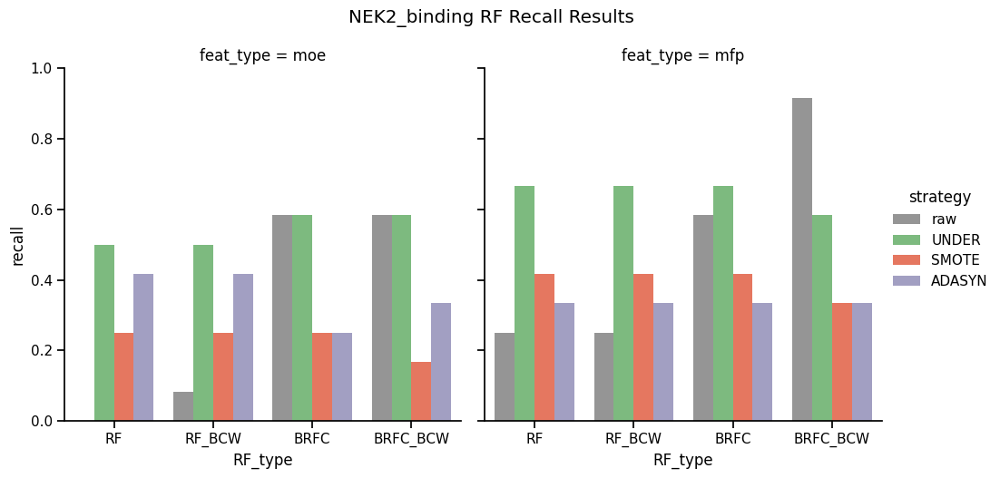

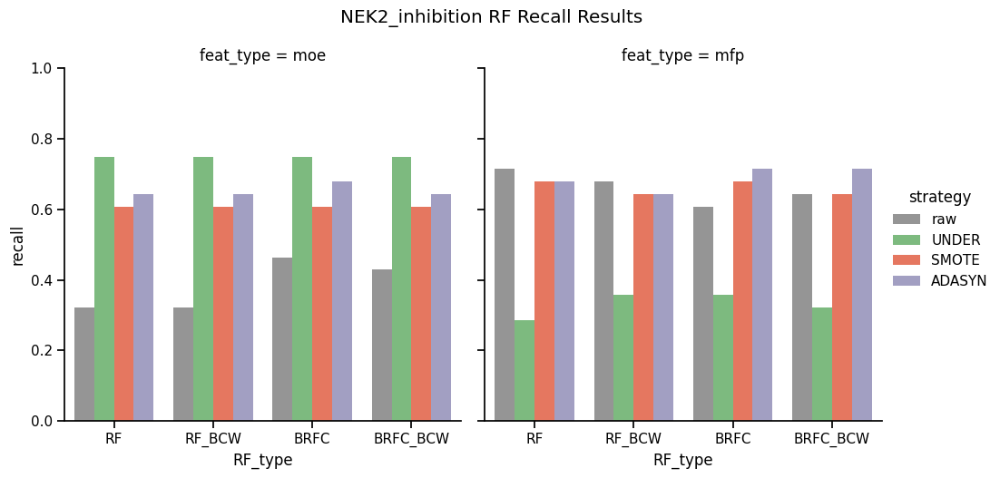

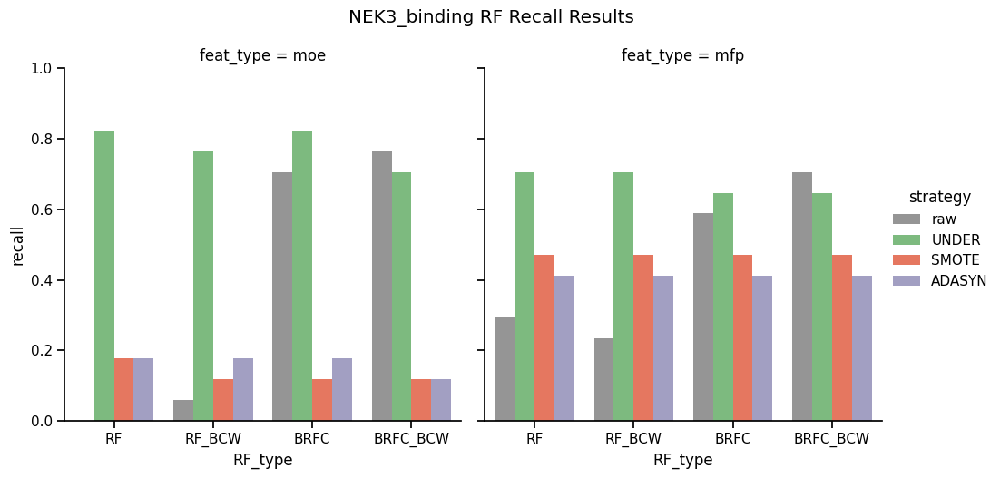

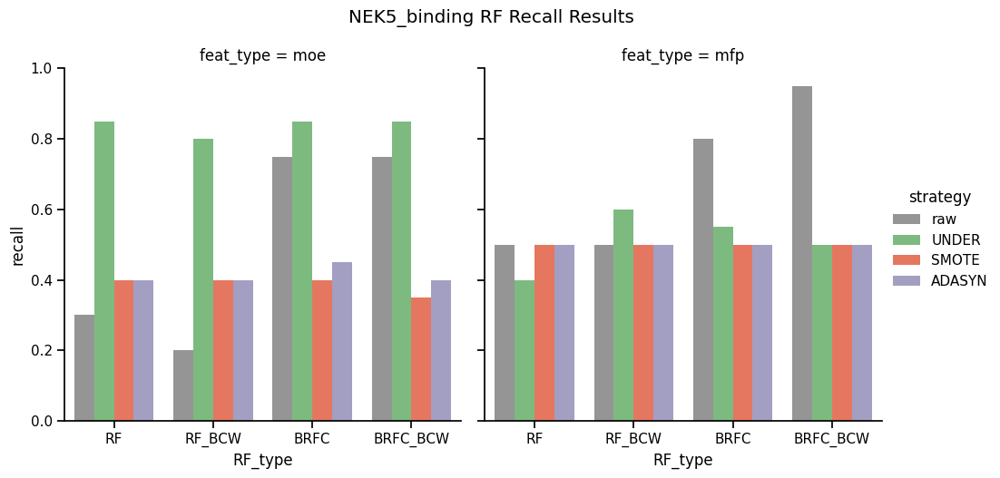

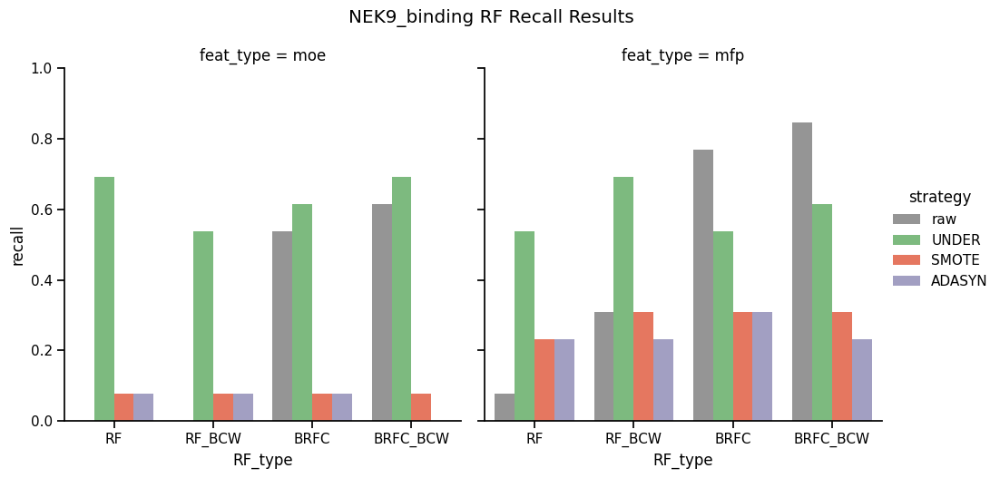

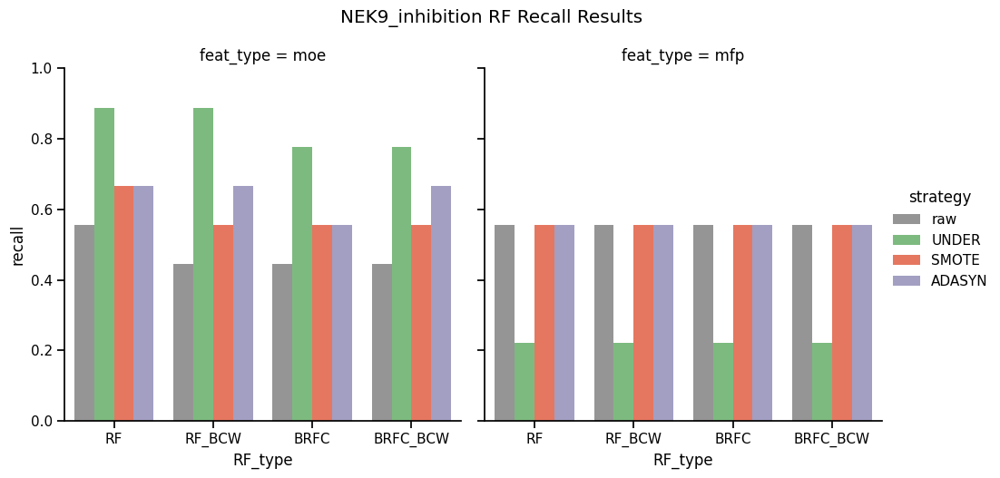

In [501]:
neks = ['NEK2_binding', 'NEK2_inhibition','NEK3_binding', 'NEK5_binding', 'NEK9_binding','NEK9_inhibition']

for nek in neks: 
    nek_df = df_all[df_all['NEK']==nek]
    nek_df.sort_values('strategy')
    # p1_individ = sns.catplot(data=nek_df, x='RF_type', y='recall', hue='strategy',col='feat_type', kind='bar',palette=palette_dict)
    p1_individ = sns.catplot(data=nek_df, x='RF_type', y='recall', hue='strategy',col='feat_type', kind='bar',palette=sampling_palette)
    # p1_individ = sns.catplot(data=nek_df, x='RF_type', y='recall', hue='dataset_category', kind='bar')
    # plt.suptitle(f'{nek} RF Recall Results')
    plt.ylabel('Recall Score')

    # for ax in p1_individ.axes.flat:
    #     if ax.get_legend() is not None:
    #         ax.get_legend().remove()
    p1_individ.fig.suptitle(f'{nek} RF Recall Results', y=1.05) 
    p1_individ.set(ylim=(0,1))
    plt.savefig(f'figures/RF_plots/{nek}_4rftype_4colorsamp_2feat.png', bbox_inches='tight')

    plt.show()

# same, but don't separate moe and mfp on diff plots, just use dataset_category 

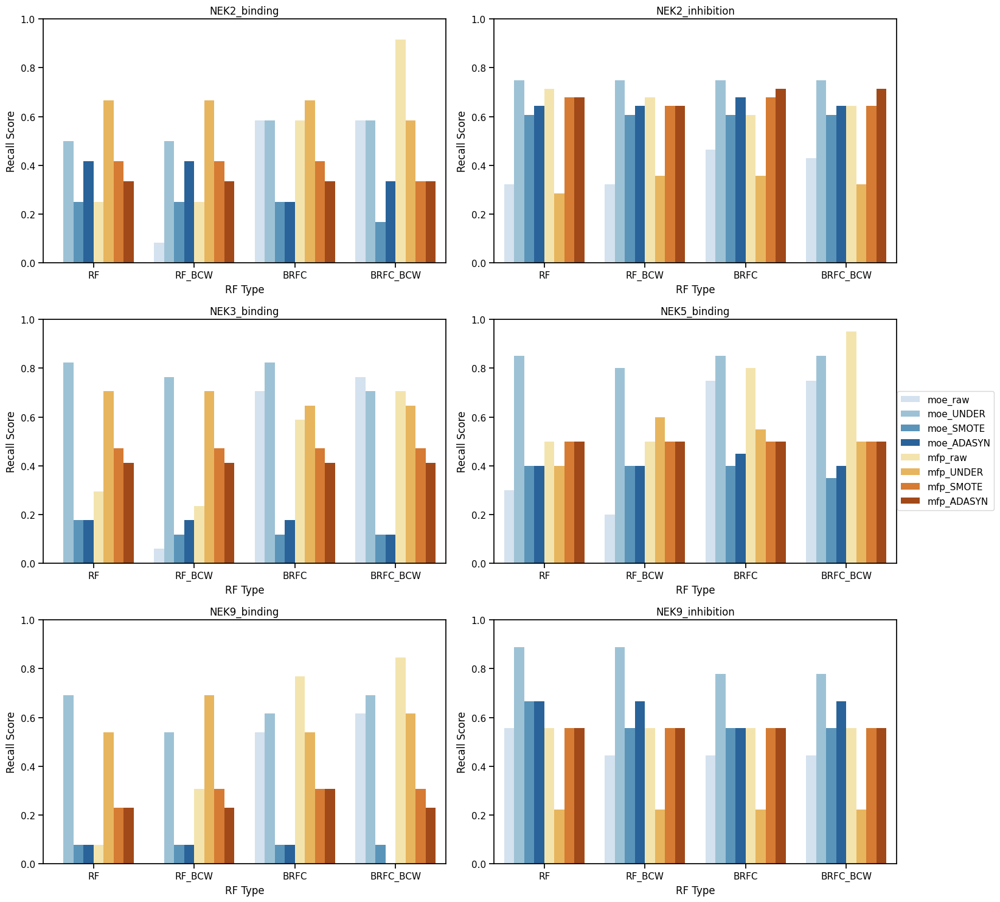

In [502]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))
axes = axes.flatten()

for i, nek in enumerate(neks):
    nek_df = df_all[df_all['NEK'] == nek]
    # nek_df = nek_df.sort_values('RF_type')
    g = sns.barplot(data=nek_df, x='RF_type', y='recall', hue='dataset_category', ax=axes[i],palette=dataset_palette)
    axes[i].set_title(f'{nek}')
    axes[i].set_ylabel('Recall Score')
    axes[i].set_xlabel('RF Type')
    axes[i].set_ylim(0, 1)
    axes[i].get_legend().remove()

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center right',bbox_to_anchor=(1.1,0.5))
plt.savefig(f'figures/RF_plots/NEK_RF_recall_byRF_type.png', bbox_inches='tight')
plt.tight_layout()
plt.show();

# Blue and gold feat type and sampling strategy on x, plot for each RF model type

In [410]:

# just2 = sns.color_palette('Blues', 1)+sns.color_palette('YlOrBr', 1)

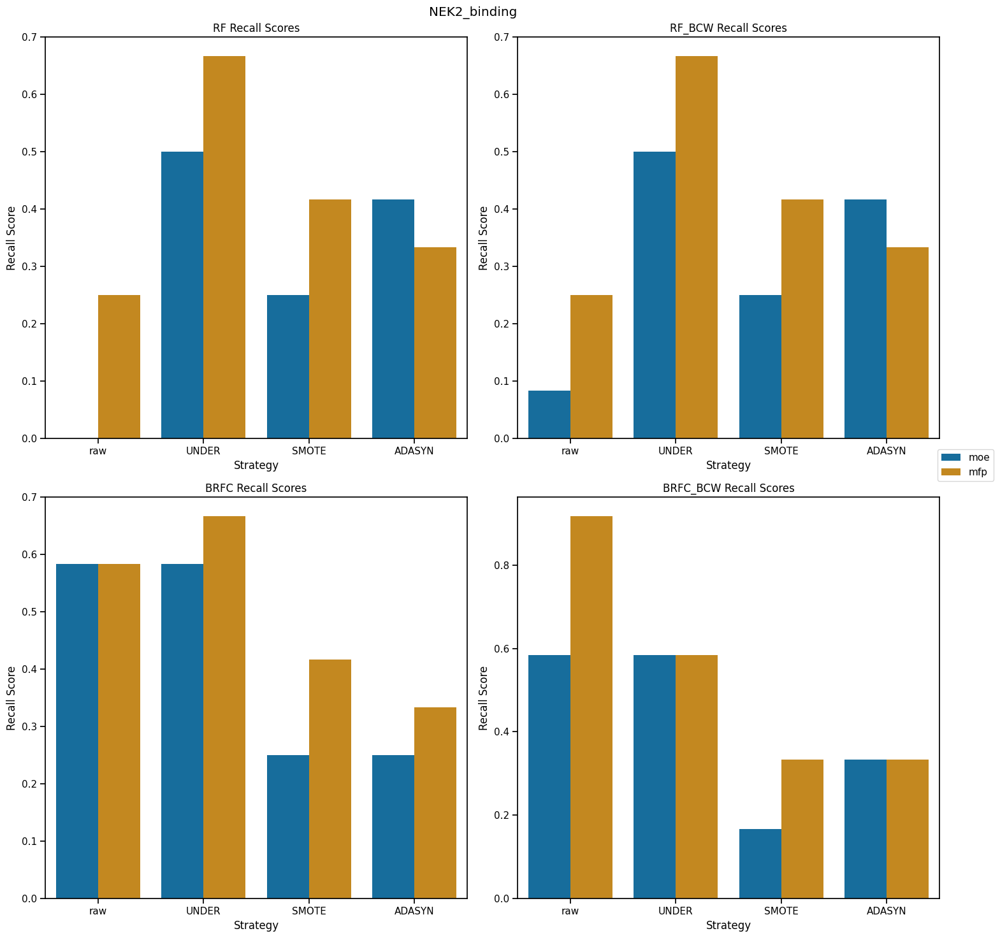

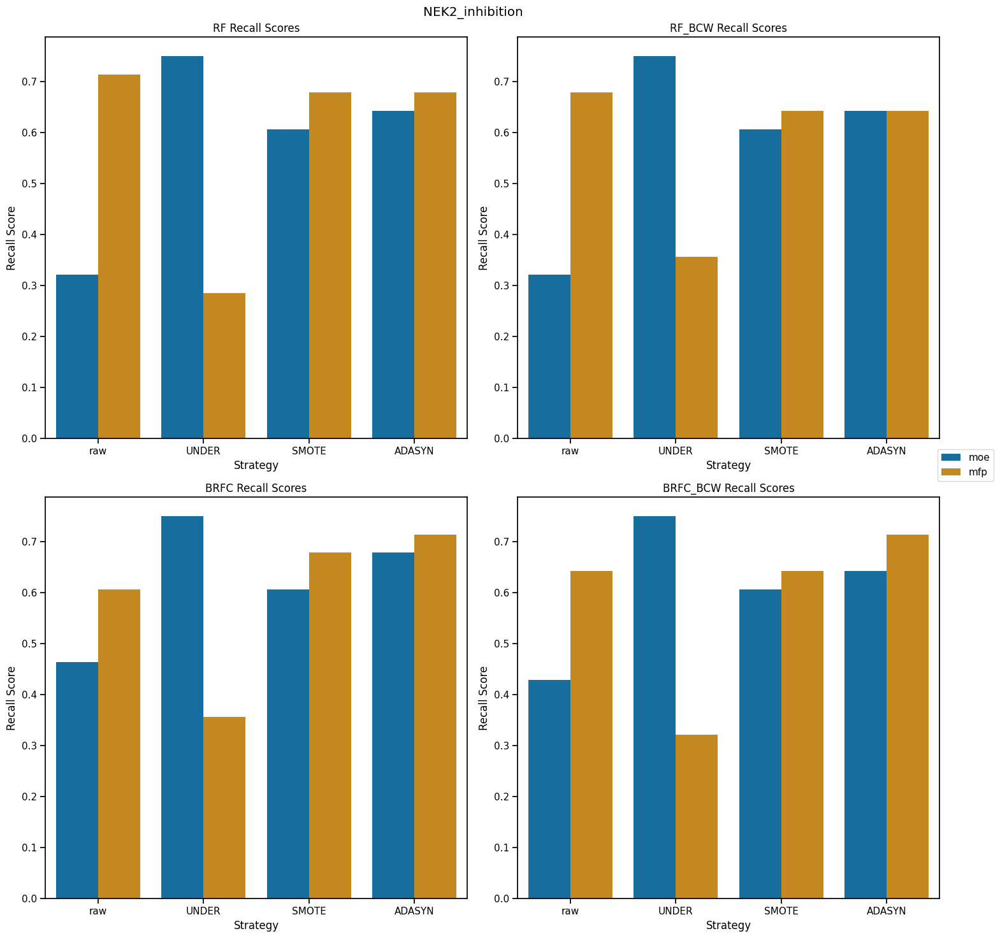

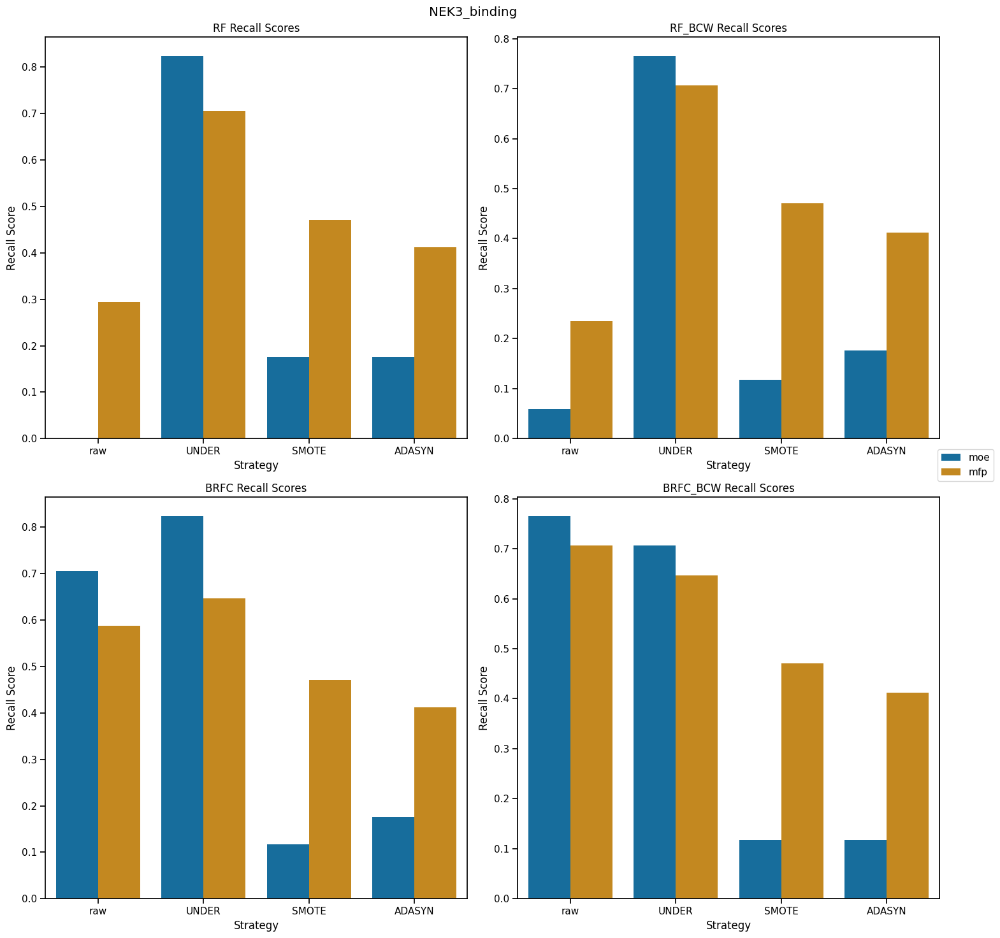

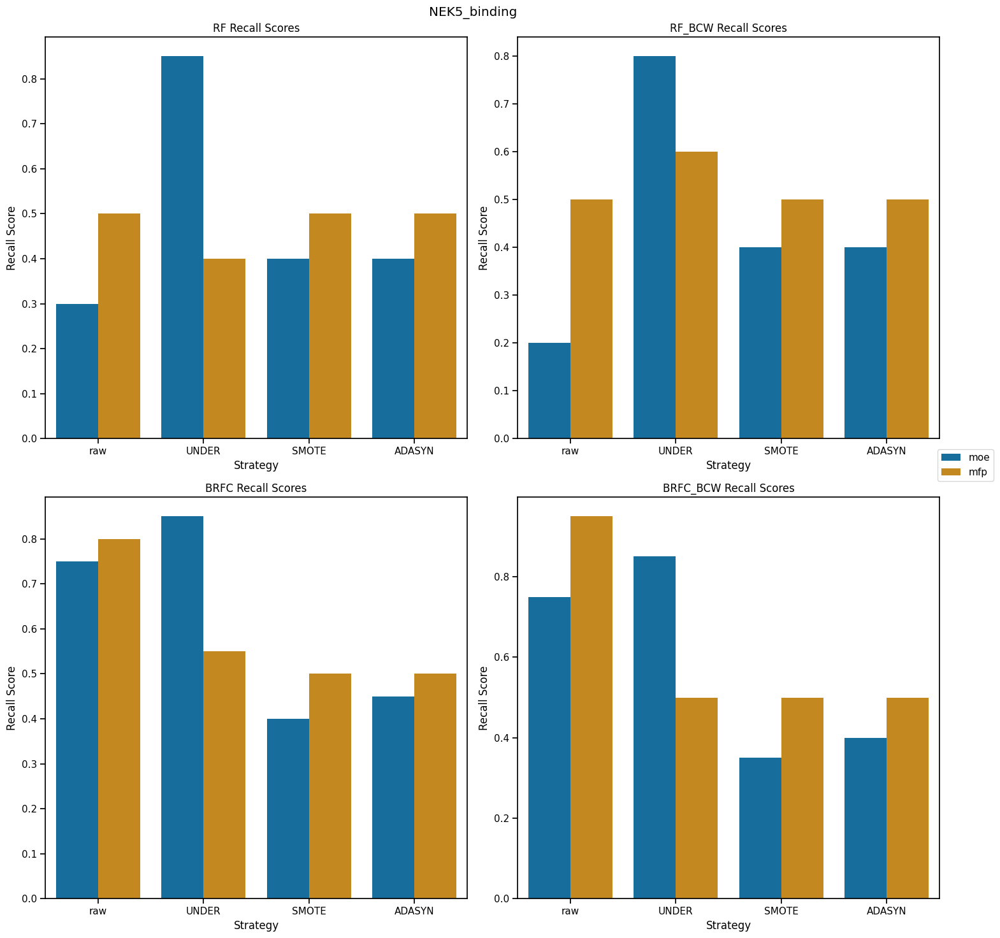

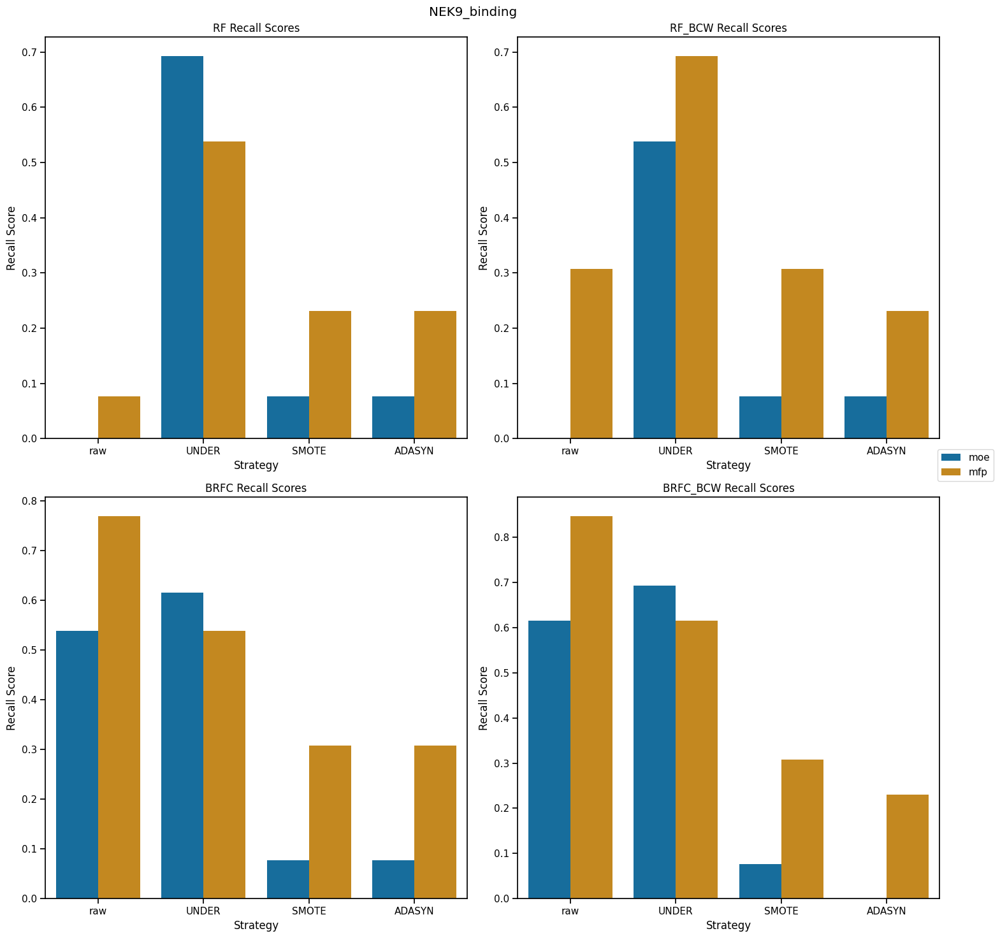

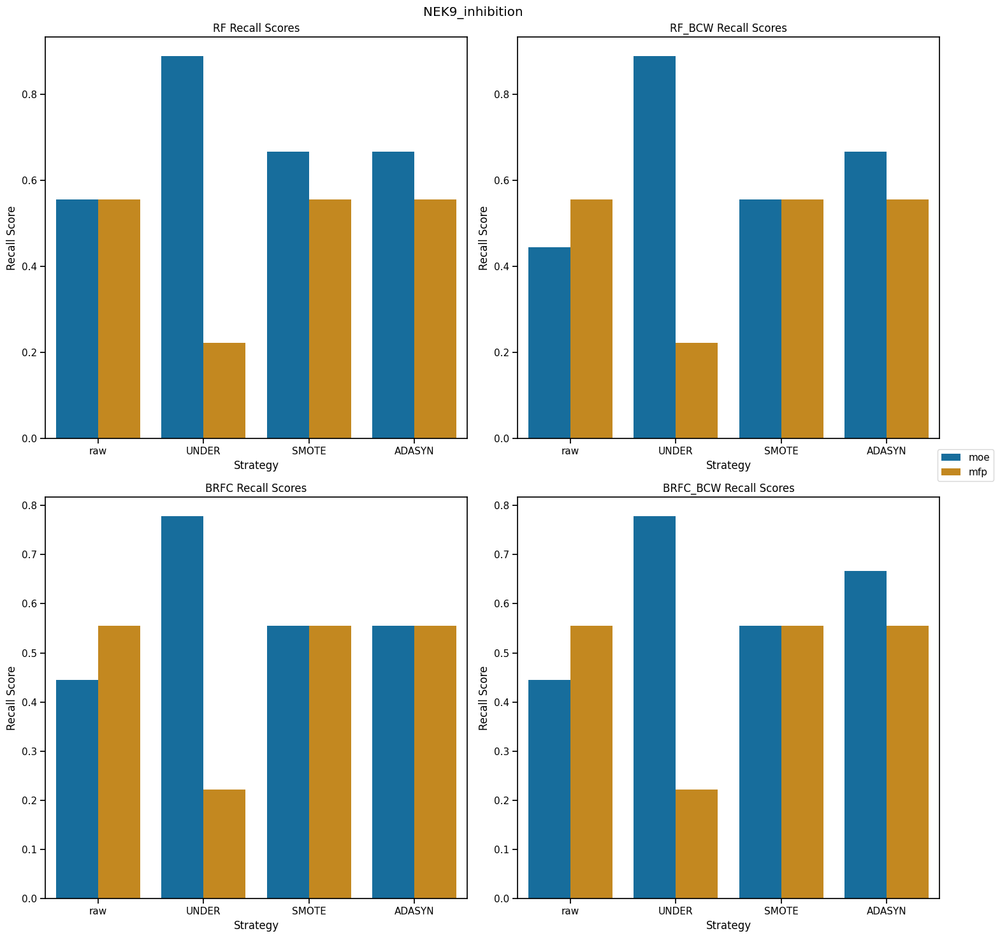

In [412]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
for nek in neks: 
    df = df_all[df_all['NEK'] == nek]
    df = df.drop(columns = tptnfpfn)
    # ax = df.plot(x='dataset_category',kind='bar', figsize=(10,10))
    # p_all_metrics = sns.catplot(data=df, x='RF_type', y='recall', hue='strategy',col='feat_type', kind='bar')
    # for rf in df['RF_type'].unique(): 
    rf_types = df['RF_type'].unique()
    nrows = (len(rf_types)+2-1)//2
    fig, axes = plt.subplots(nrows, ncols=2, figsize=(15, 15))
    axes = axes.flatten()
    for ax, rf in zip(axes, rf_types):
        rf_df = df[df['RF_type'] == rf]
        sns.barplot(data=rf_df, x='strategy', y='recall', hue='feat_type', ax=ax)
        ax.set_xlabel('Strategy')
        ax.set_ylabel('Recall Score')
        ax.set_title(f'{rf} Recall Scores')
        ax.legend().remove()
        # ax.set_xticklabels(ax.get_xticklabels(), rotation=80)
    # ax.legend(loc='center',bbox_to_anchor=(1,1))
        
        # p_all_metrics = sns.catplot(data=rf_df, x='strategy', y='recall', hue='feat_type', kind='bar')
        # plt.xlabel('Model name')
        # plt.ylabel('Metric Score')
        # plt.title(f'{nek} {rf} Model Performance')
        # plt.xticks(rotation=80)  
        # ax.legend(loc='upper left', bbox_to_anchor=(1,1))
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='center right', bbox_to_anchor=(1.05, 0.5))
    plt.suptitle(f'{nek}')
    plt.tight_layout()
    plt.savefig(f'figures/RF_plots/{nek}_{rf}_recall.png',bbox_inches='tight')

    
    plt.show();    

# Recall and Precision Only for each model

In [504]:
metric_palette = sns.color_palette("RdPu", n_colors=2)
# metric_palette = ['palevioletred', 'darkseagreen']

NEK2_binding


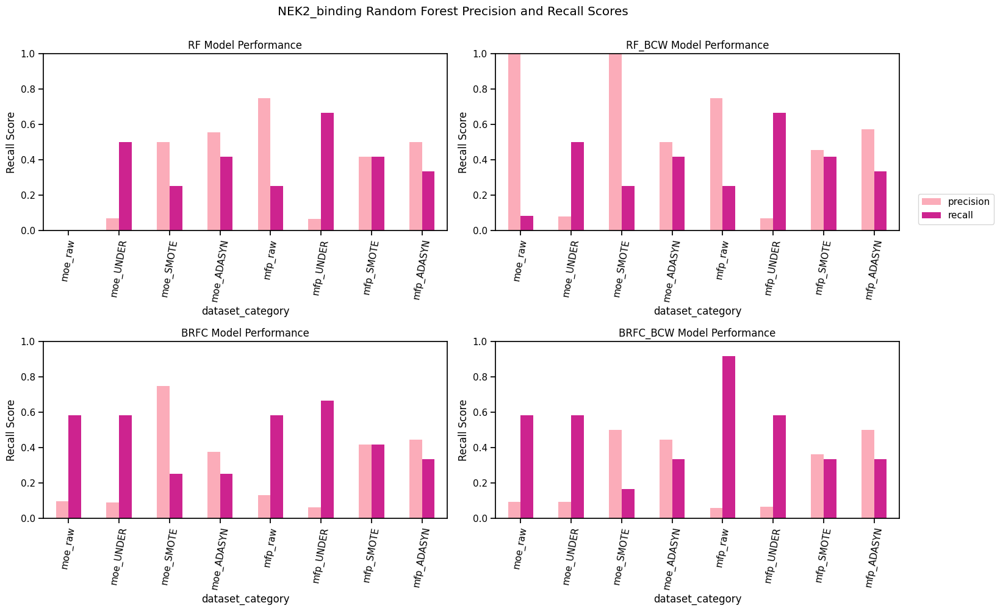

NEK2_inhibition


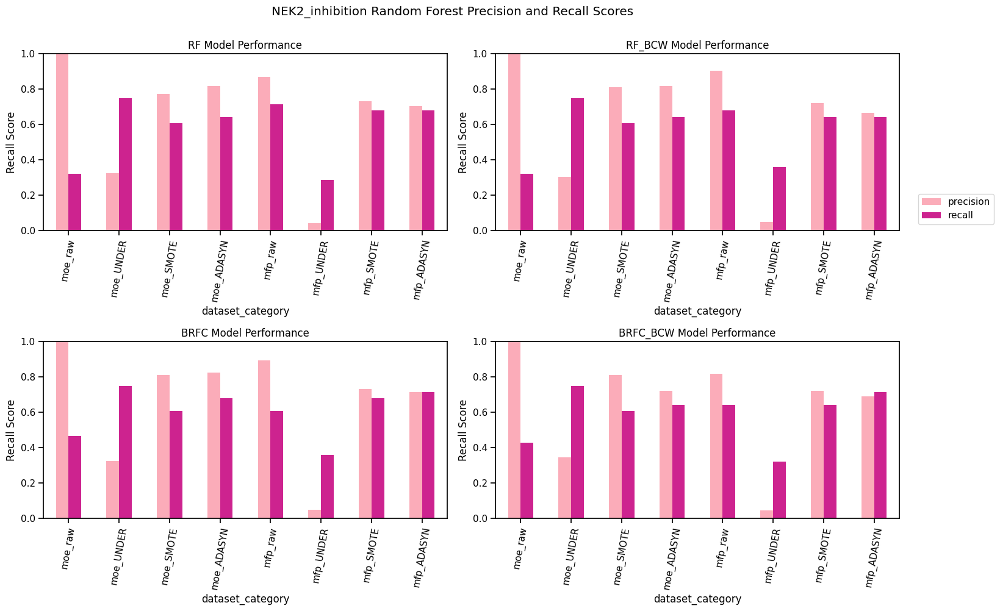

NEK3_binding


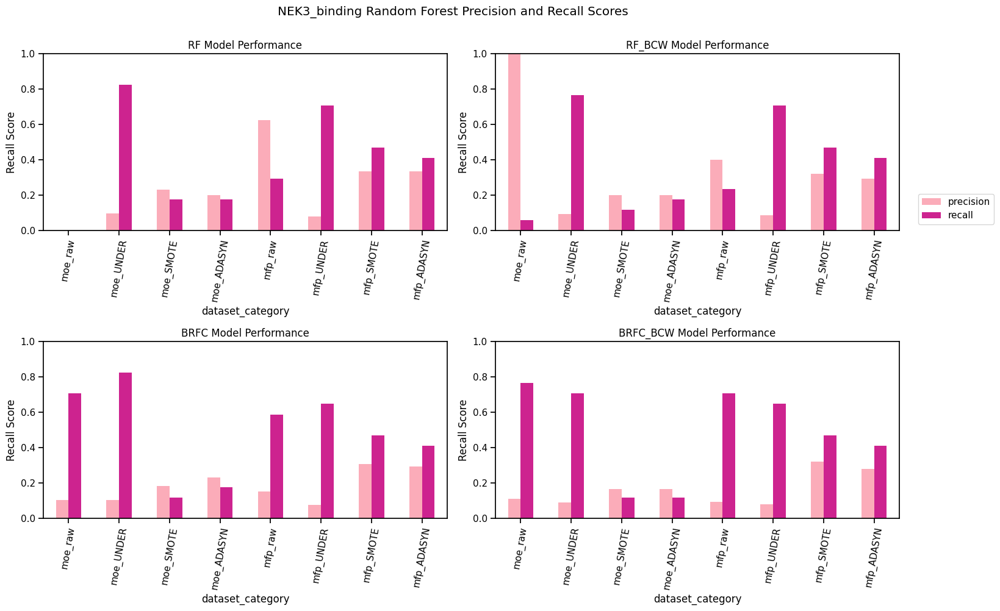

NEK5_binding


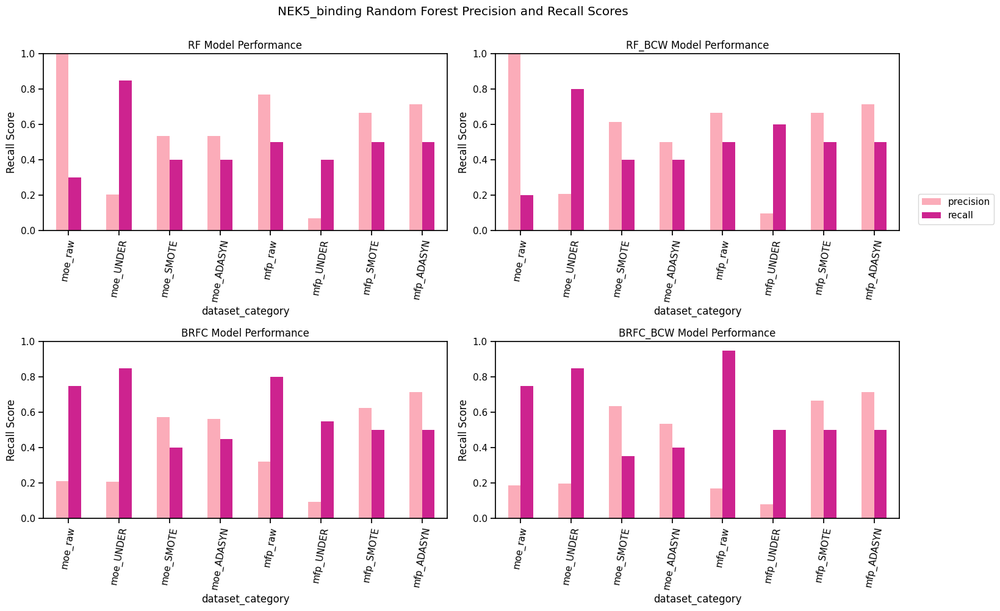

NEK9_binding


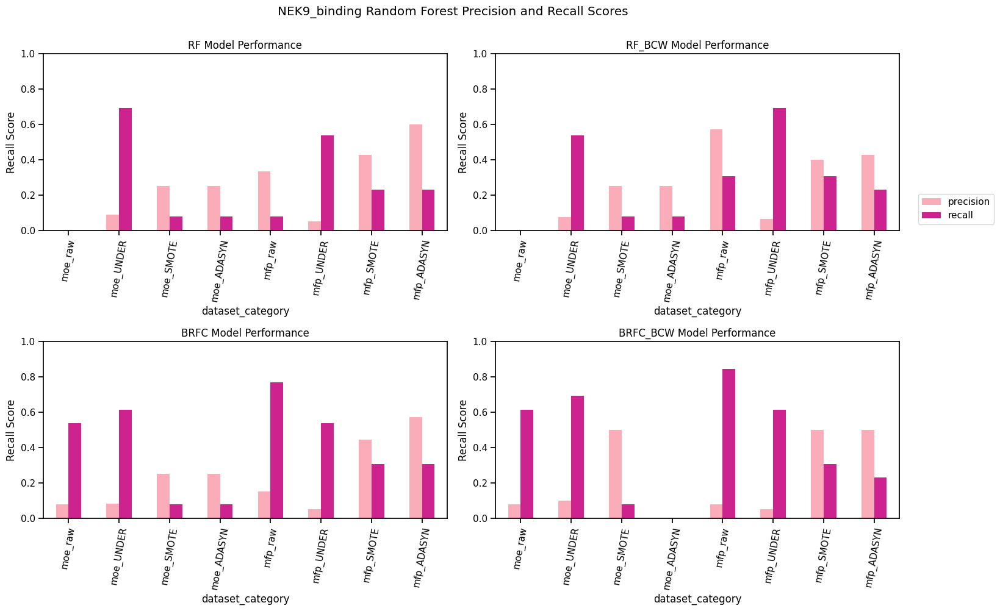

NEK9_inhibition


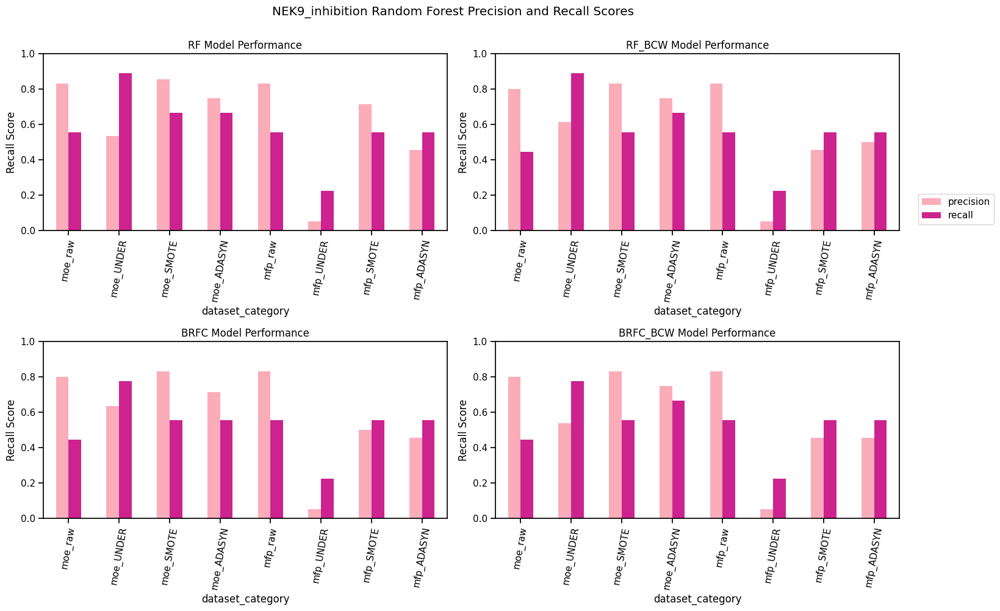

In [531]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
for nek in neks: 
    print(nek)
    df = df_all[df_all['NEK'] == nek]
    df = df.drop(columns = tptnfpfn)
    rf_types = df['RF_type'].unique()
    ncols = 2
    nrows = (len(rf_types)+ncols-1)//ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(15,5 * nrows))
    axes = axes.flatten()
    keep_cols = ['precision', 'recall', 'RF_type', 'model', 'NEK', 'feat_type', 'strategy','dataset_category']
    for ax, rf in zip(axes, rf_types):
        rf_df = df[df['RF_type'] == rf]
        pr_df = rf_df[keep_cols]
        pr_df.plot(x='dataset_category',kind='bar', ax=ax, legend=False,color=metric_palette)
        # sns.barplot(data=pr_df,x='model', ax=ax, legend=False)
        ax.set_ylabel('Recall Score')
        ax.set_title(f'{rf} Model Performance')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=80)
        ax.set(ylim=(0,1))
        plt.suptitle(f'{nek} Random Forest Precision and Recall Scores',y=1.0)
        
    for i in range(len(rf_types), len(axes)):
        fig.delaxes(axes[i])

    handles,labels = ax.get_legend_handles_labels()
    # fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(1.05, .7), ncol=len(labels))
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(1.05, .7))
    plt.tight_layout()
    plt.savefig(f'figures/RF_plots/{nek}_RF_prec_recall.png', bbox_inches='tight')
    plt.show();    

# Same as above, but all metrics 

In [634]:
# metric_palette = ['palevioletred', 'darkseagreen']
# metric_palette = sns.color_palette("RdPu", n_colors=2)
metric_palette2 = sns.color_palette('RdPu',n_colors=8)
metric_palette2

[(0.9931103421760862, 0.8893963860053825, 0.8771549404075356),
 (0.9891887735486352, 0.7982929642445213, 0.7805920799692426),
 (0.9830065359477124, 0.673202614379085, 0.7241830065359477),
 (0.9739792387543252, 0.5059592464436755, 0.6670511341791618),
 (0.922245290272972, 0.31507881584006153, 0.6135332564398308),
 (0.8052287581699347, 0.13725490196078433, 0.5594771241830065),
 (0.6327720107650904, 0.00392156862745098, 0.487443291041907),
 (0.45507112648981163, 0.0034448289119569397, 0.46046905036524416)]

In [515]:
df_all.columns
plot_cols = ['accuracy', 'precision', 'recall', 'specificity','model','NEK', 'feat_type', 'strategy',
       'RF_type', 'dataset_category',

Index(['accuracy', 'precision', 'recall', 'specificity', 'y', 'TN', 'FN', 'FP',
       'TP', 'model', 'cm', 'prediction_type', 'NEK', 'feat_type', 'strategy',
       'RF_type', 'dataset_category'],
      dtype='object')

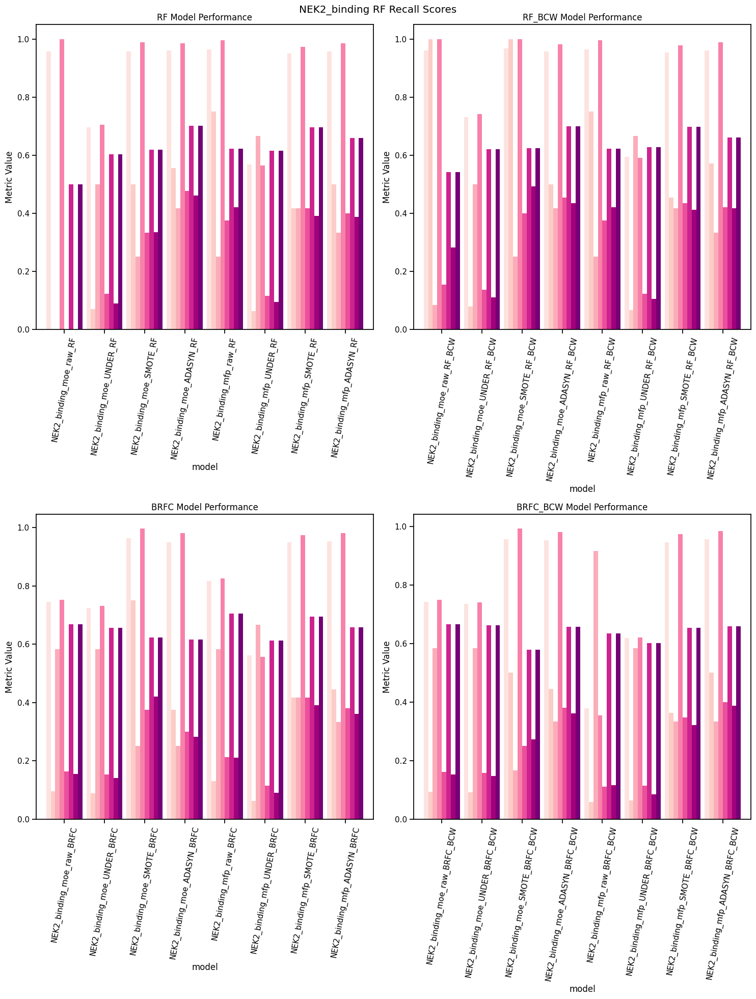

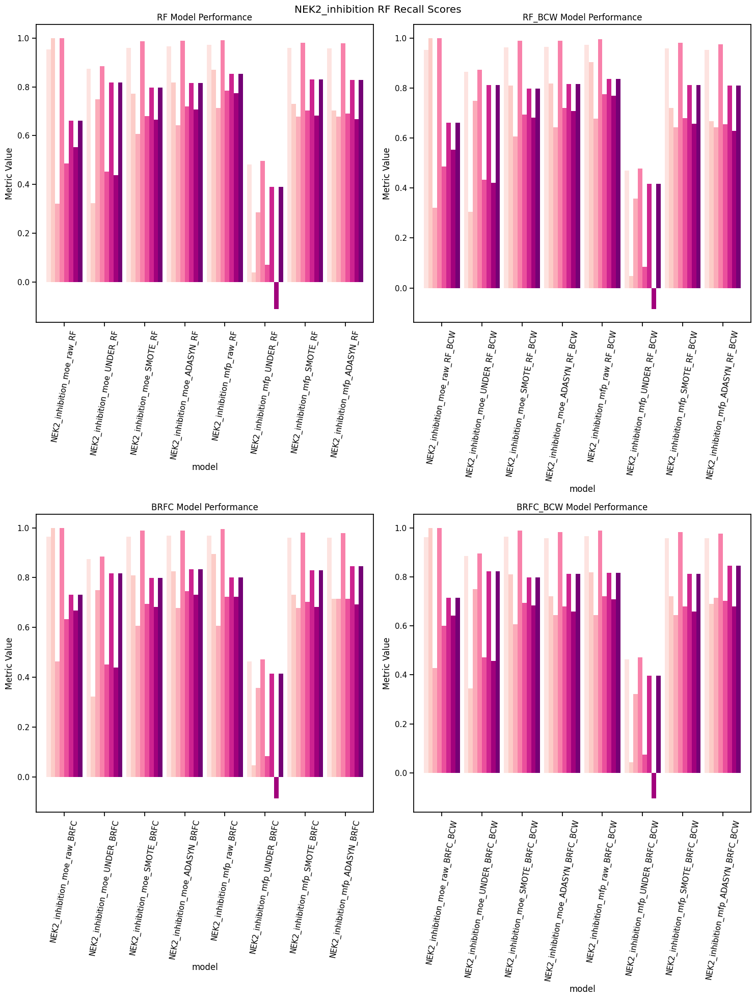

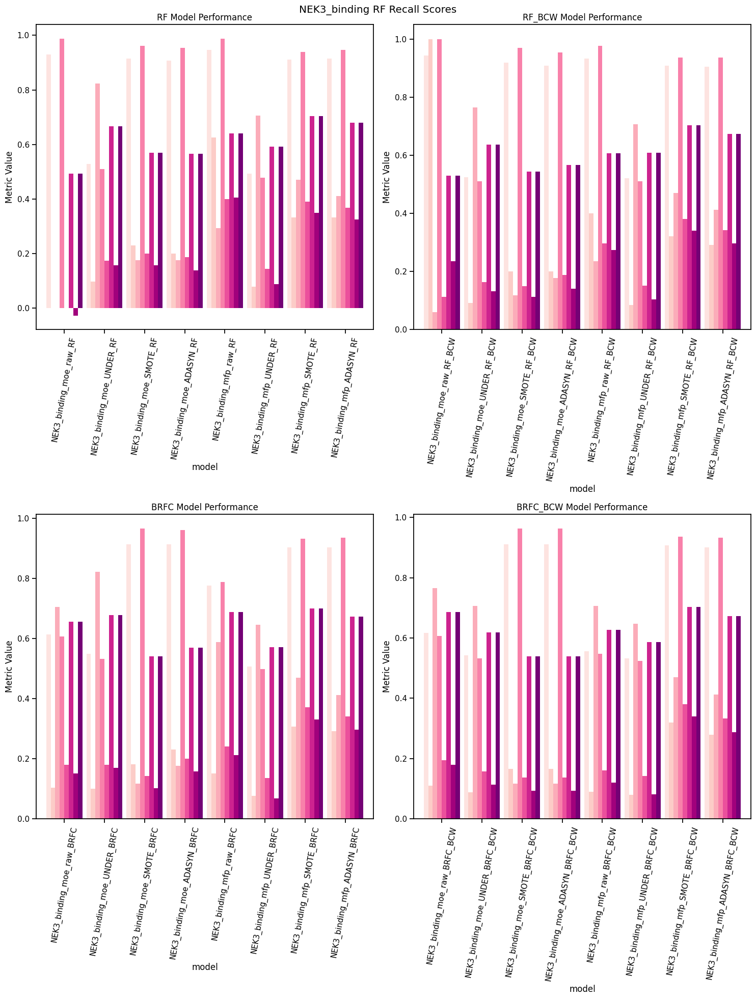

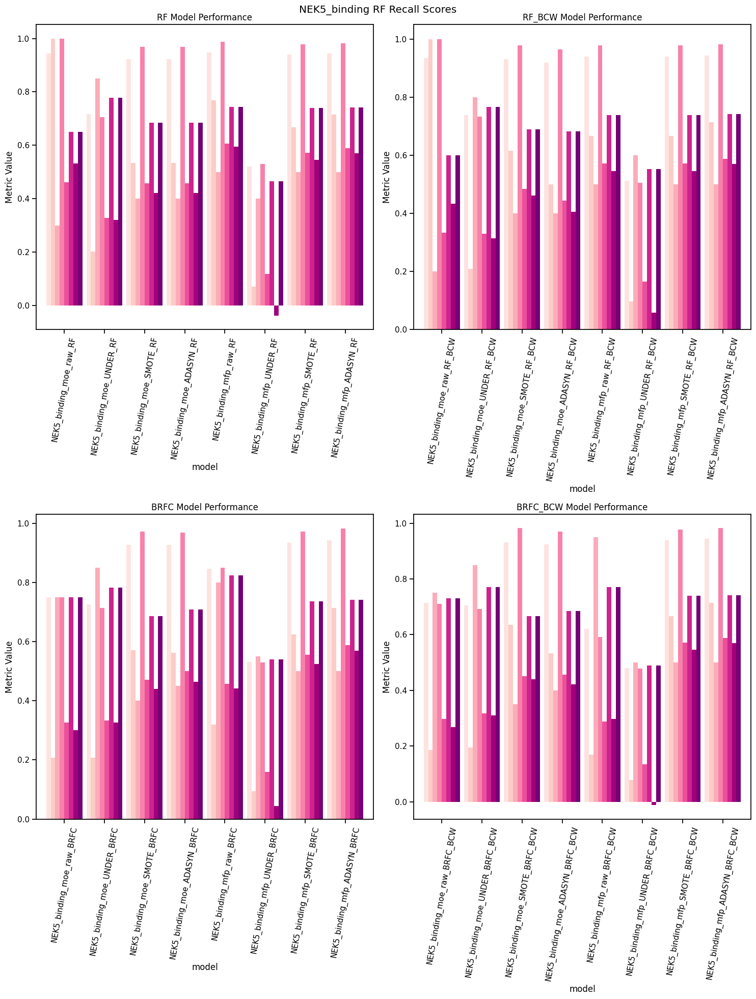

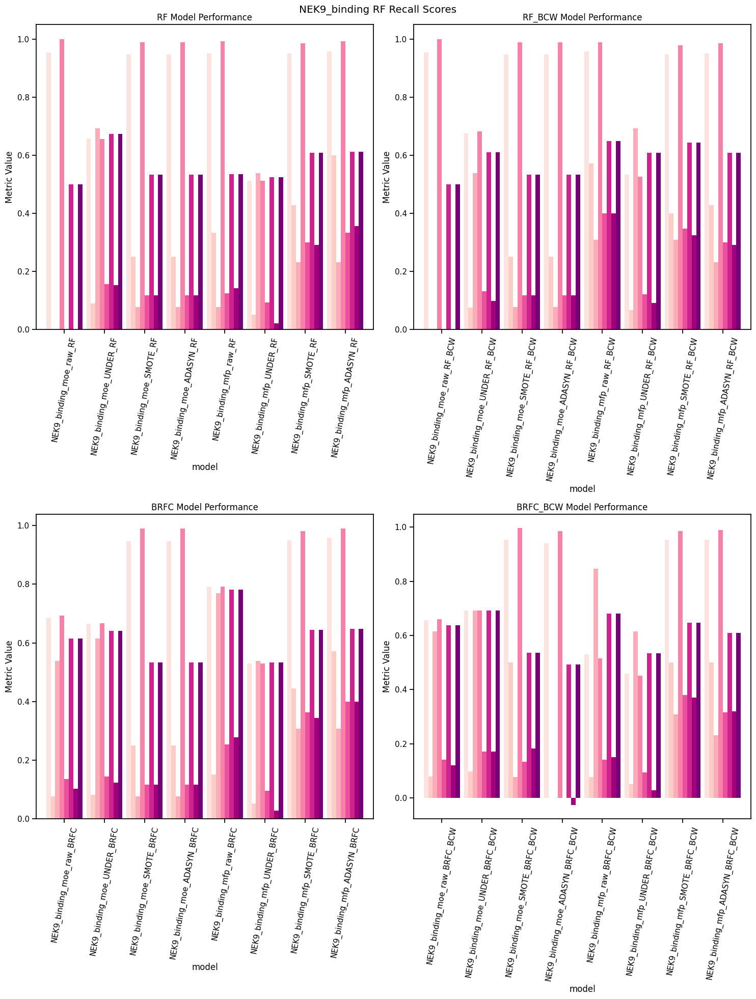

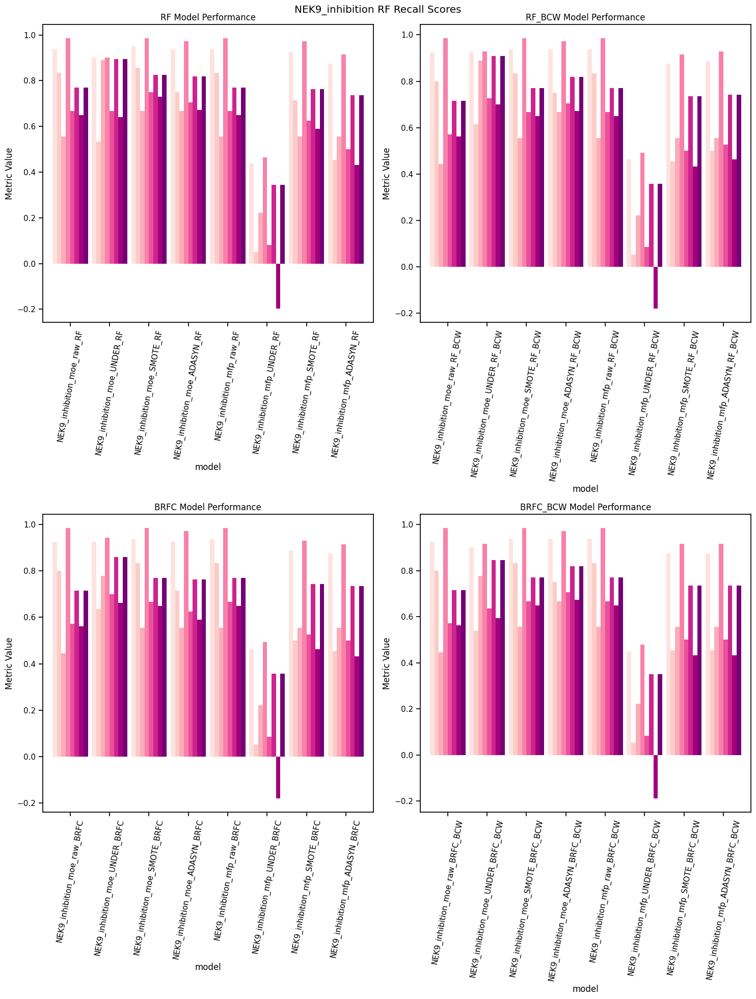

In [577]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
for nek in neks: 
    df = df_all[df_all['NEK'] == nek]
    df = df.drop(columns = tptnfpfn)
    rf_types = df['RF_type'].unique()
    ncols = 2

    nrows = (len(rf_types)+ncols-1)//ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(15,10 * nrows))
    axes = axes.flatten()
    for ax, rf in zip(axes, rf_types):
        rf_df = df[df['RF_type'] == rf]
        rf_df.plot(x='model',kind='bar', ax=ax, legend=False,color=metric_palette2,width=0.9)
        ax.set_ylabel('Metric Value')
        ax.set_title(f'{rf} Model Performance')
        # ax.set_xticklabels(rf['model name'], rotation=45)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=80)
        

        plt.suptitle(f'{nek} RF Recall Scores')
        
    for i in range(len(rf_types), len(axes)):
        fig.delaxes(axes[i])

    handles,labels = ax.get_legend_handles_labels()
    # fig.legend(handles, labels, loc='upper center',bbox_to_anchor=(1.1,1))
    # fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.01), ncol=len(labels))
    # ax.legend(loc='center',bbox_to_anchor=(1,1))
    plt.tight_layout()
    plt.savefig(f'figures/RF_plots/{nek}_all_metrics.png', bbox_inches='tight')
    plt.show();    

# same as above but order by decreasing degree of imbalance 

In [628]:
size_df = pd.read_csv('/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/dataset_creation/all_NEK_dataset_sizes.csv')
size_df['train actives/total%'] = size_df['actives_train']/size_df['total_size']*100
df_all2 = df_all.copy()
tempcols = ['NEK', 'strategy', 'feat_type', 'model','RF_type','num_samples_train','actives_train', 'active%_train', 'num_samples_test', 'actives_test',
       'active%_test', 'total_size', 'total_actives', 'total actives/total%']
size_cols = ['num_samples_train','actives_train', 'active%_train', 'num_samples_test', 'actives_test',
       'active%_test', 'total_size', 'total_actives', 'total actives/total%','train actives/total%']
for i, nek in enumerate(neks): 
    for j,samp in enumerate(df_all2['strategy'].unique()):
        ds_idx = df_all2[(df_all2 ['NEK']==nek) & (df_all2['strategy']==samp)].index
        sizedf_idx = size_df[(size_df['NEK']==nek) & (size_df['strategy']==samp)].iloc[0]

        df_all2.loc[ds_idx, size_cols] = sizedf_idx[size_cols].values
        df_all2[(df_all2['NEK']==nek) & (df_all2['strategy']==samp)]
tempdf = df_all2[tempcols]
df_all2.columns

Index(['accuracy', 'precision', 'recall', 'specificity', 'TN', 'FN', 'FP',
       'TP', 'f1', 'ROC-AUC', 'MCC', 'Balanced Accuracy', 'model', 'cm',
       'prediction_type', 'NEK', 'feat_type', 'strategy', 'RF_type',
       'dataset_category', 'num_samples_train', 'actives_train',
       'active%_train', 'num_samples_test', 'actives_test', 'active%_test',
       'total_size', 'total_actives', 'total actives/total%',
       'train actives/total%'],
      dtype='object')

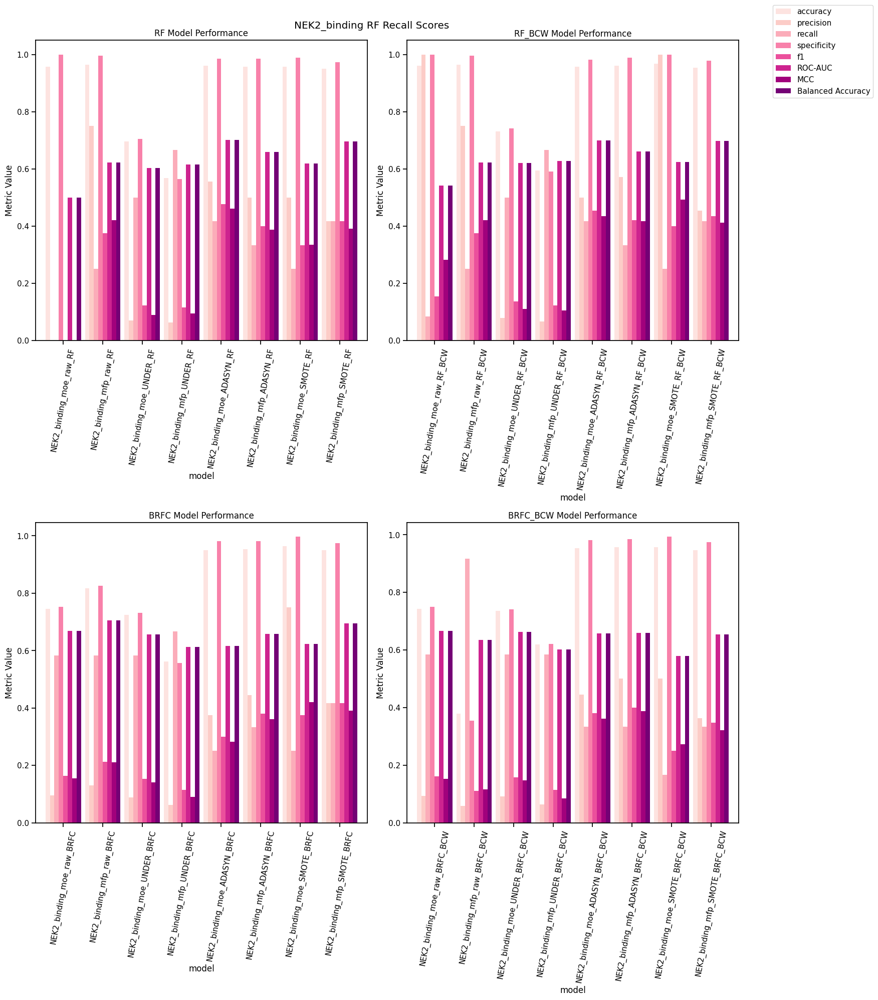

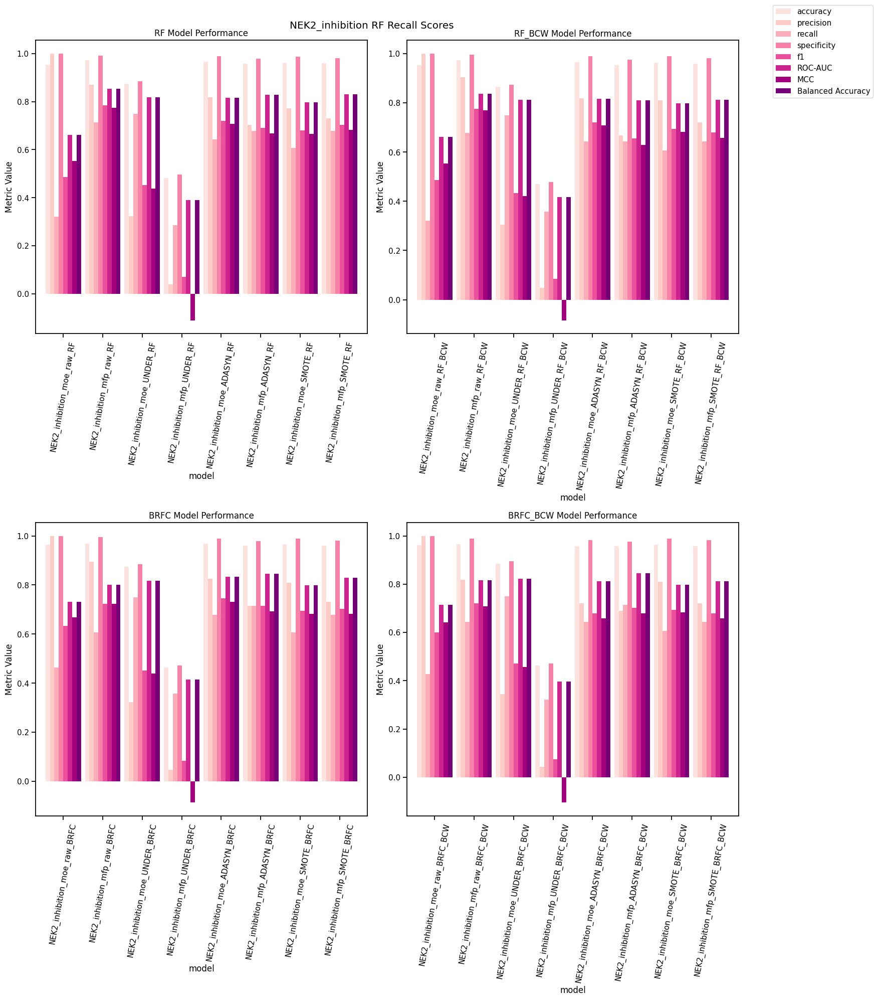

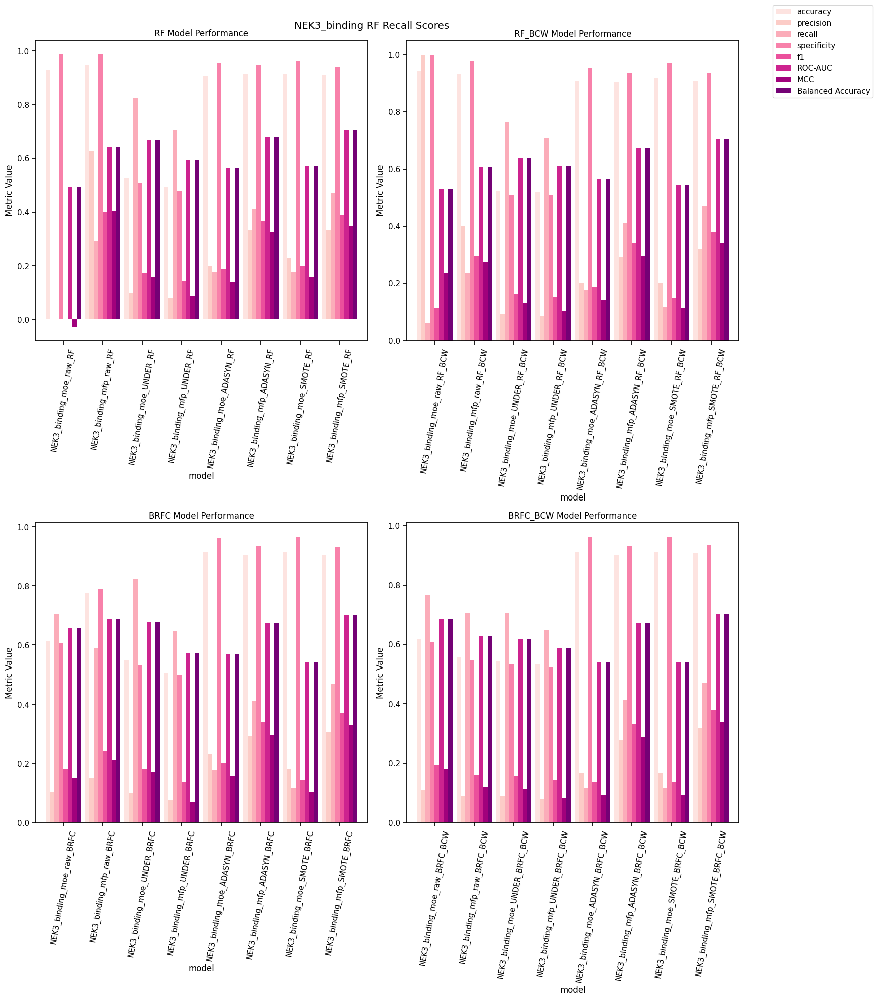

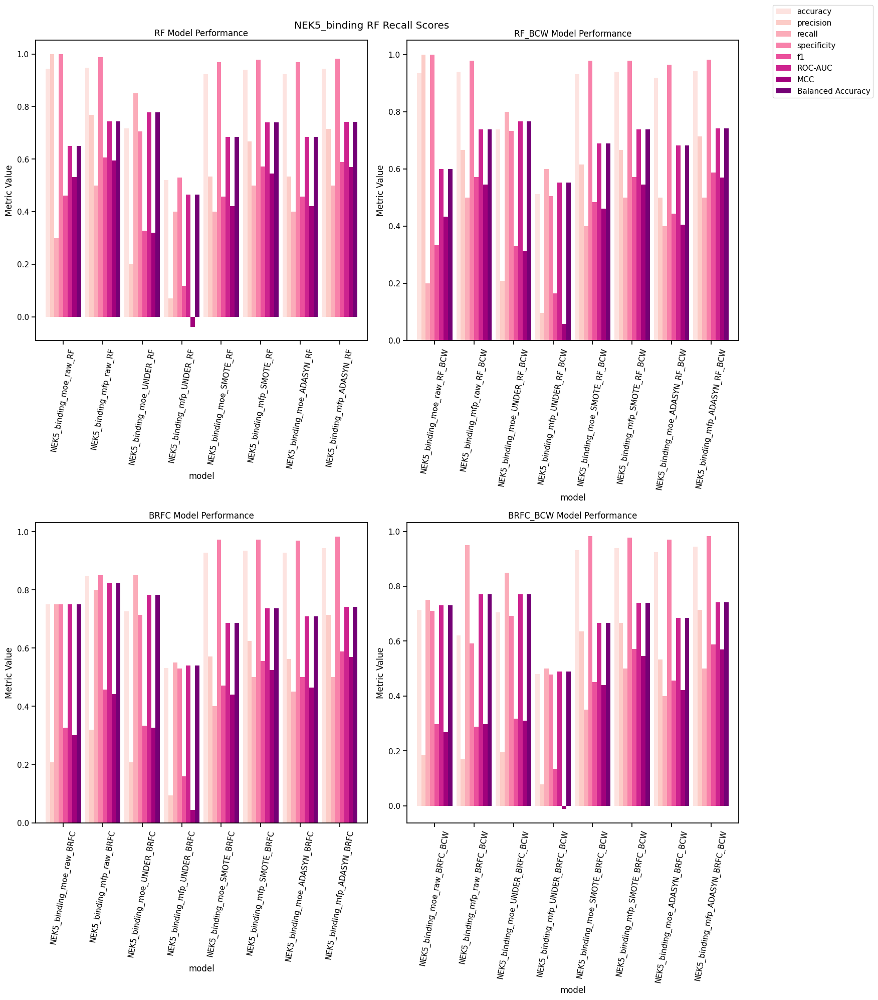

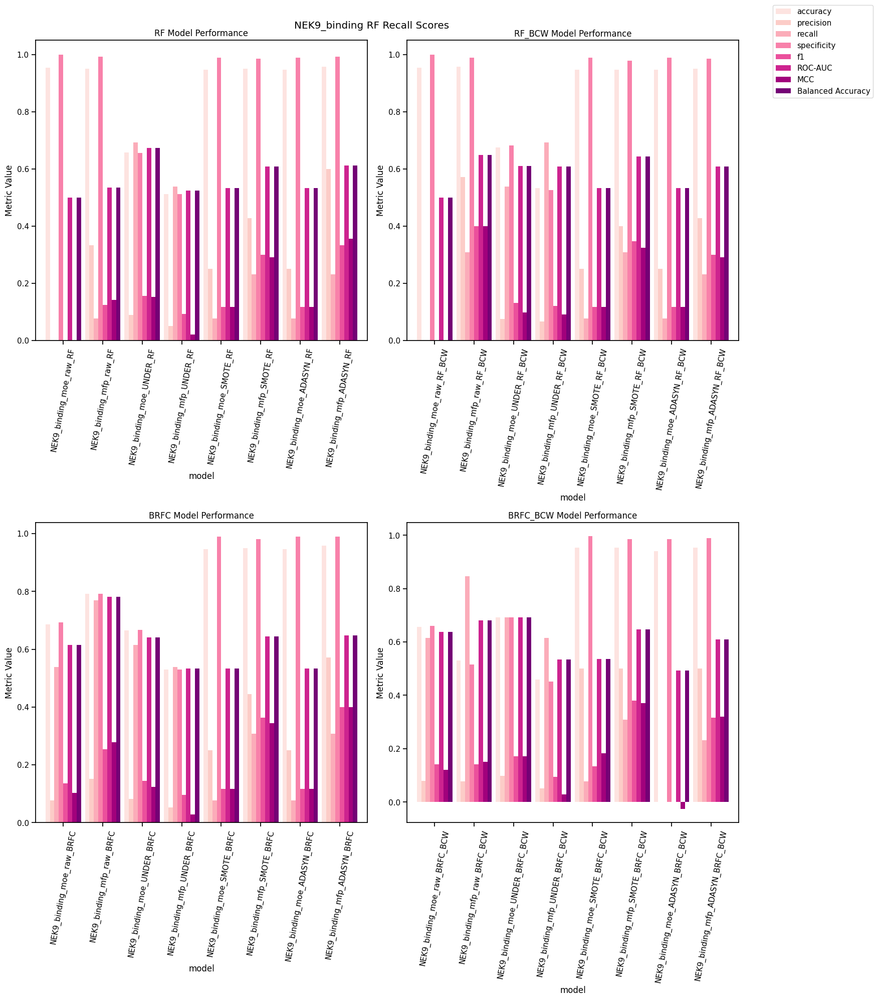

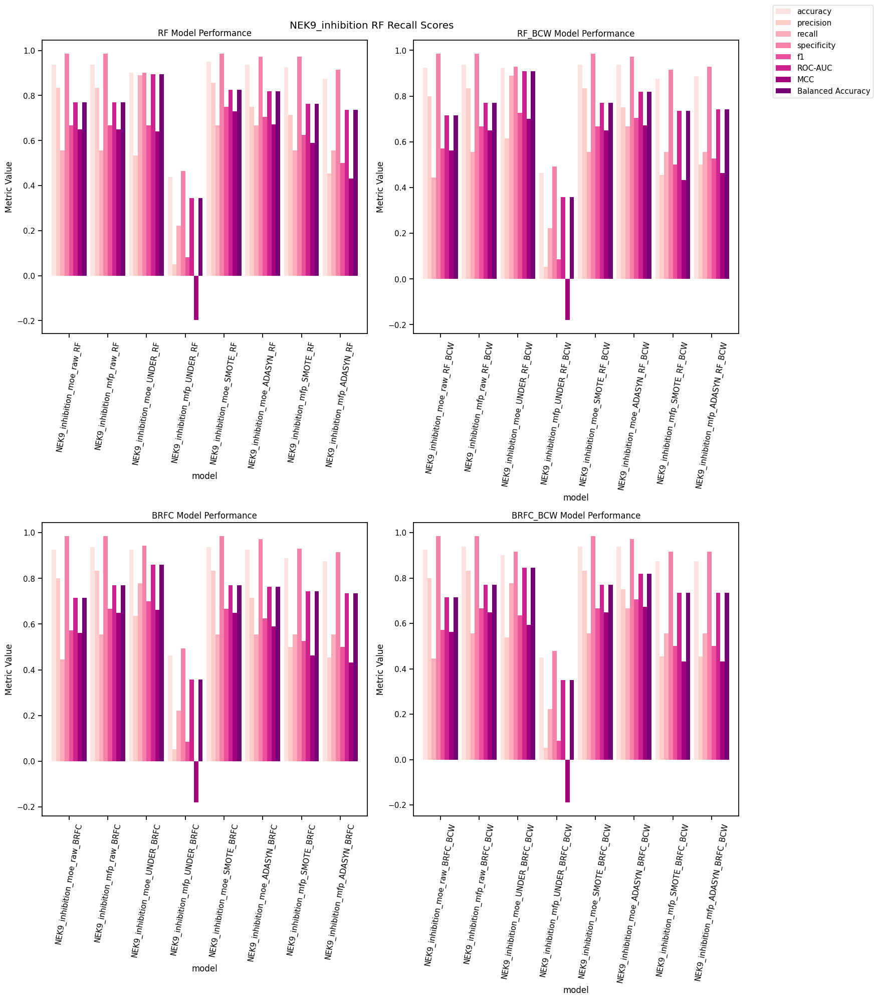

In [636]:
# metric_palette3 = sns.color_palette('RdPu',n_colors=18)
metric_cols2 = ['accuracy', 'precision', 'recall', 'specificity', 'TN', 'FN', 'FP',
       'TP', 'f1', 'ROC-AUC', 'MCC', 'Balanced Accuracy', 'model', 'cm',
       'prediction_type', 'NEK', 'feat_type', 'strategy', 'RF_type',
       'dataset_category']
size_cols = ['num_samples_train', 'actives_train',
       'active%_train', 'num_samples_test', 'actives_test', 'active%_test',
       'total_size', 'total_actives', 'total actives/total%','train actives/total%']
for nek in neks: 
    df = df_all2[df_all2['NEK'] == nek]
    df = df.drop(columns = tptnfpfn)
    
    rf_types = df['RF_type'].unique()
    fig, axes = plt.subplots(nrows, ncols, figsize=(15,10 * nrows))
    axes = axes.flatten()
    for ax, rf in zip(axes, rf_types):
        rf_df = df[df['RF_type'] == rf]
        rf_df=rf_df.sort_values('train actives/total%')
        rf_df=rf_df.drop(columns=size_cols)
        rf_df.plot(x='model',kind='bar', ax=ax, legend=False,color=metric_palette2,width=0.9)
        ax.set_ylabel('Metric Value')
        ax.set_title(f'{rf} Model Performance')
        # ax.set_xticklabels(rf['model name'], rotation=45)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=80)
        plt.suptitle(f'{nek} RF Recall Scores')
        
    for i in range(len(rf_types), len(axes)):
        fig.delaxes(axes[i])

    handles,labels = ax.get_legend_handles_labels()
  
    fig.legend(handles, labels, loc='upper center',bbox_to_anchor=(1.1,1))
    plt.tight_layout()
    # plt.savefig(f'figures/RF_plots/{nek}_all_metrics.png', bbox_inches='tight')
    plt.show();    

# subplot for every RF type and loop through each NEK

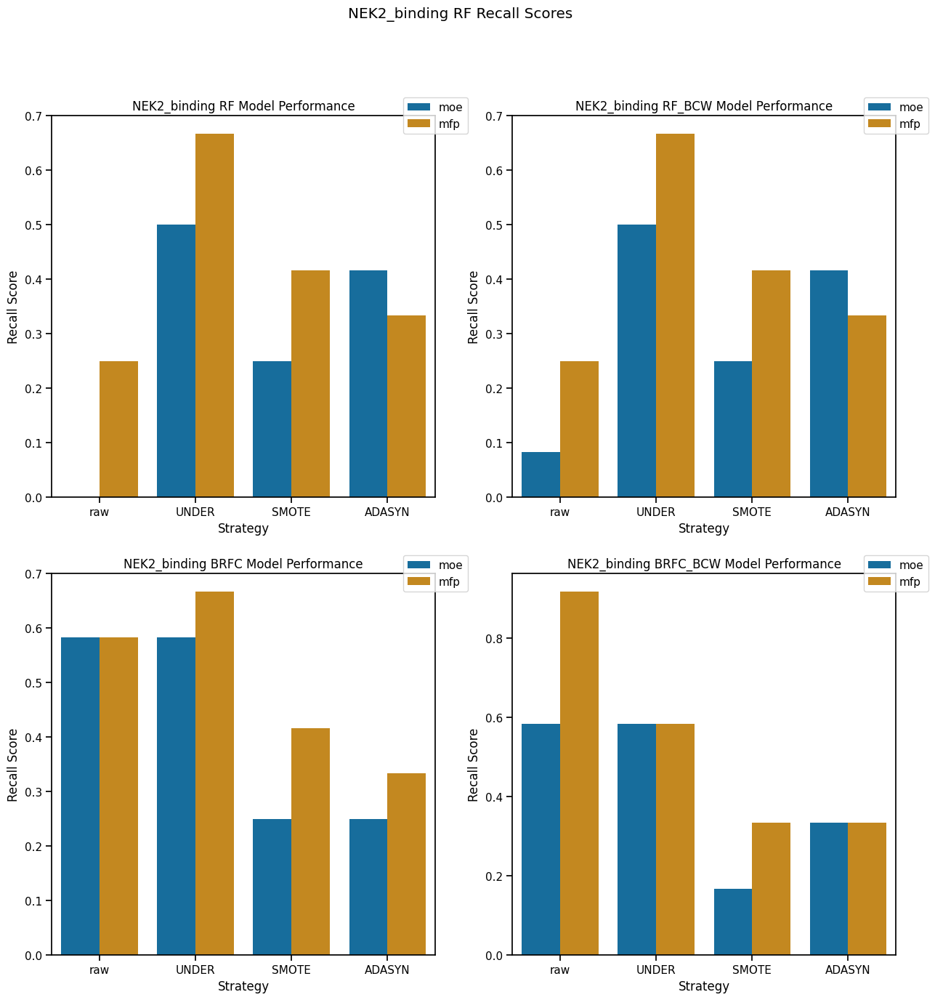

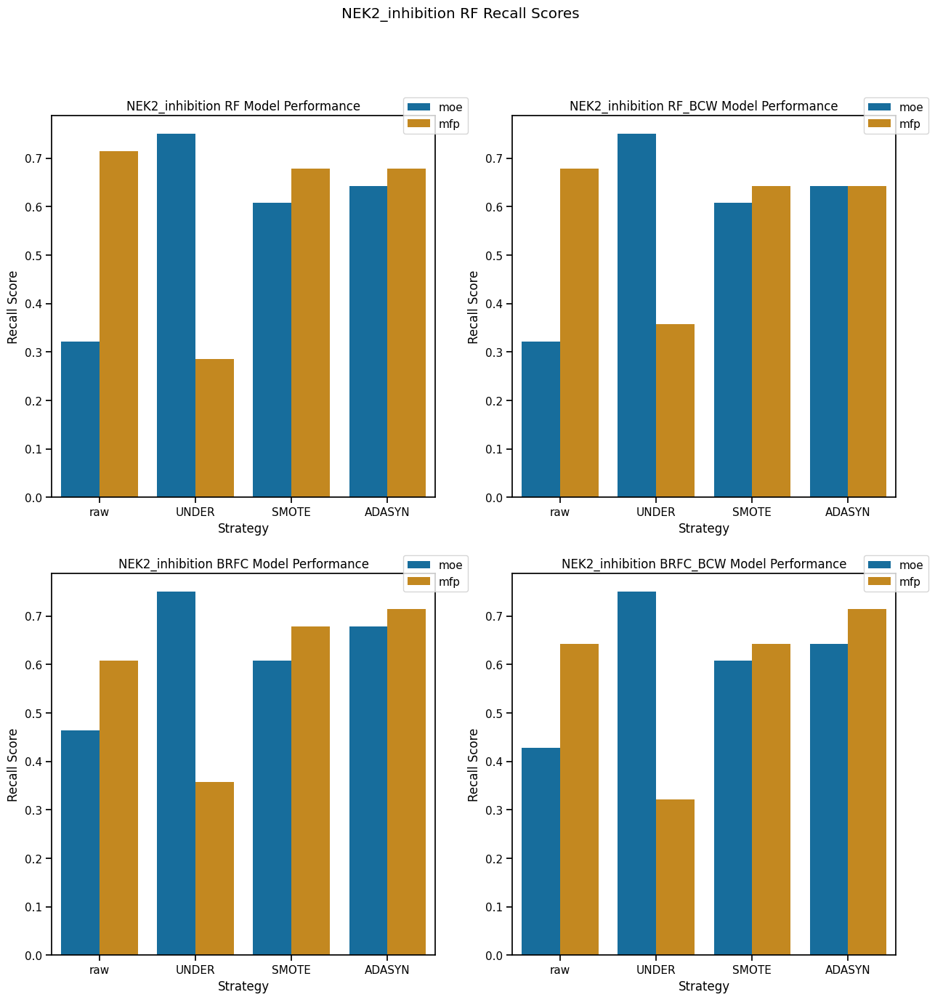

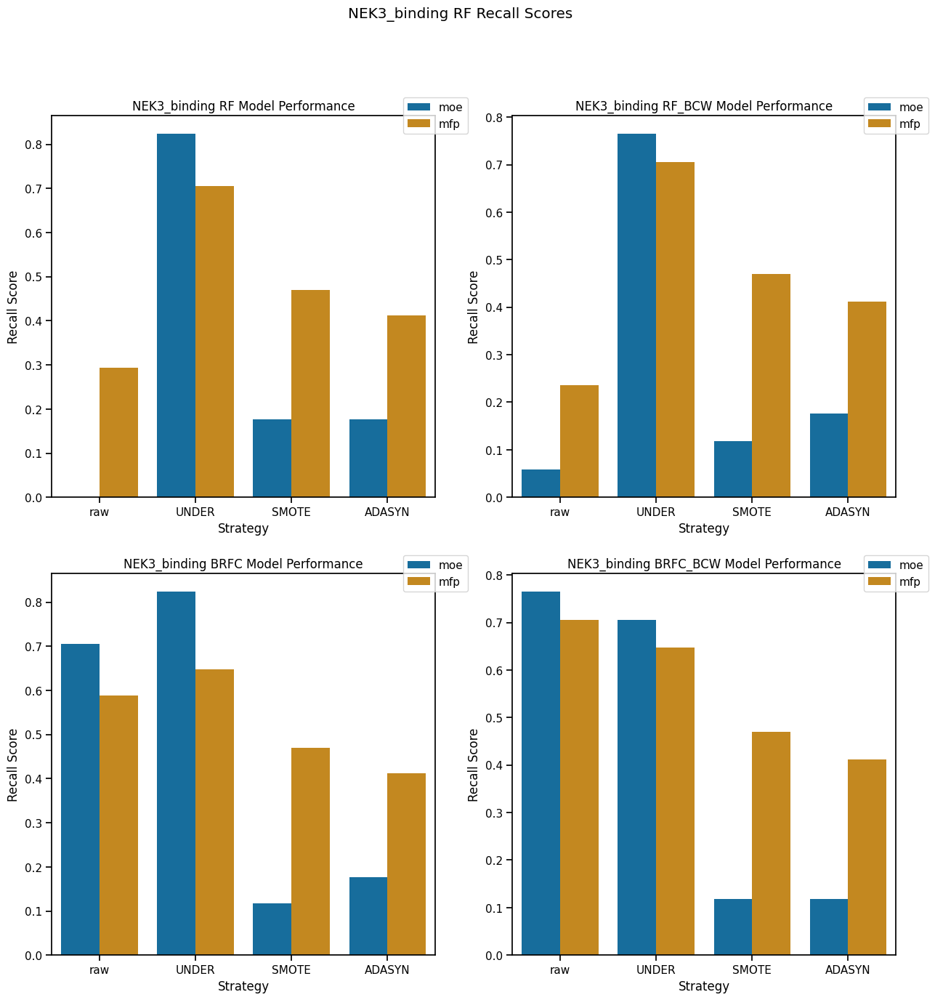

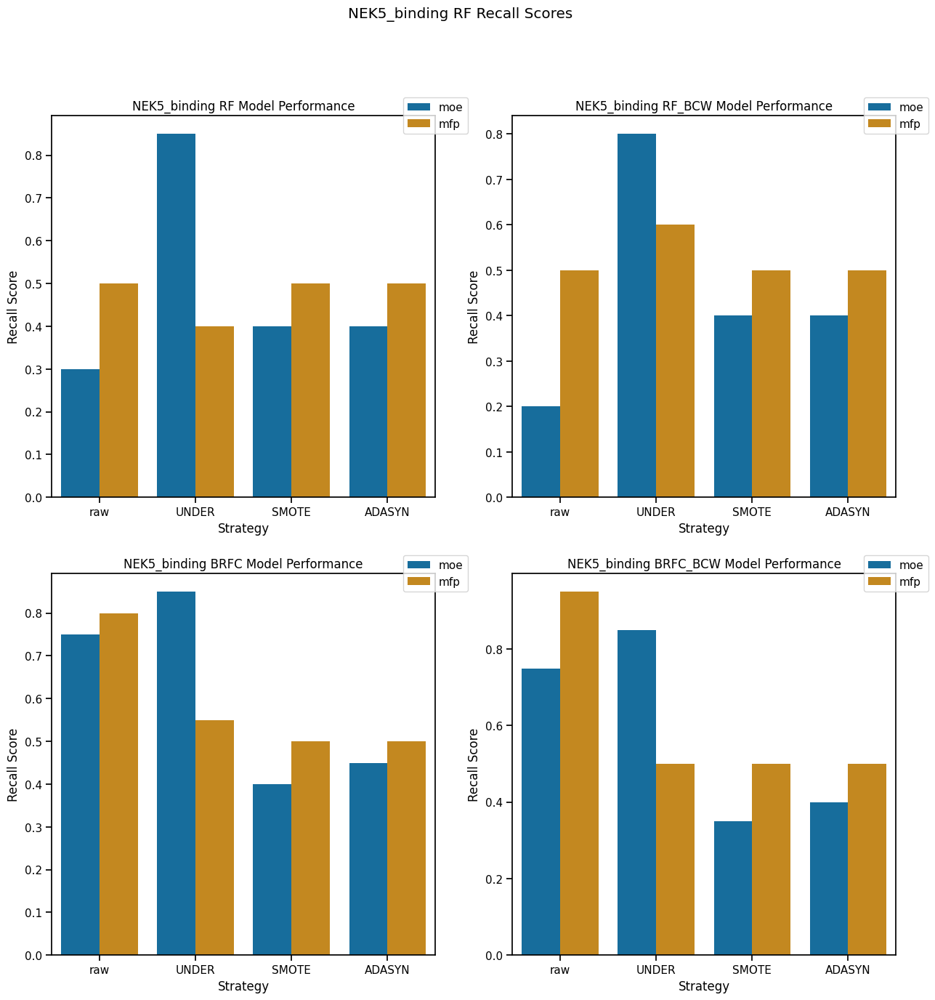

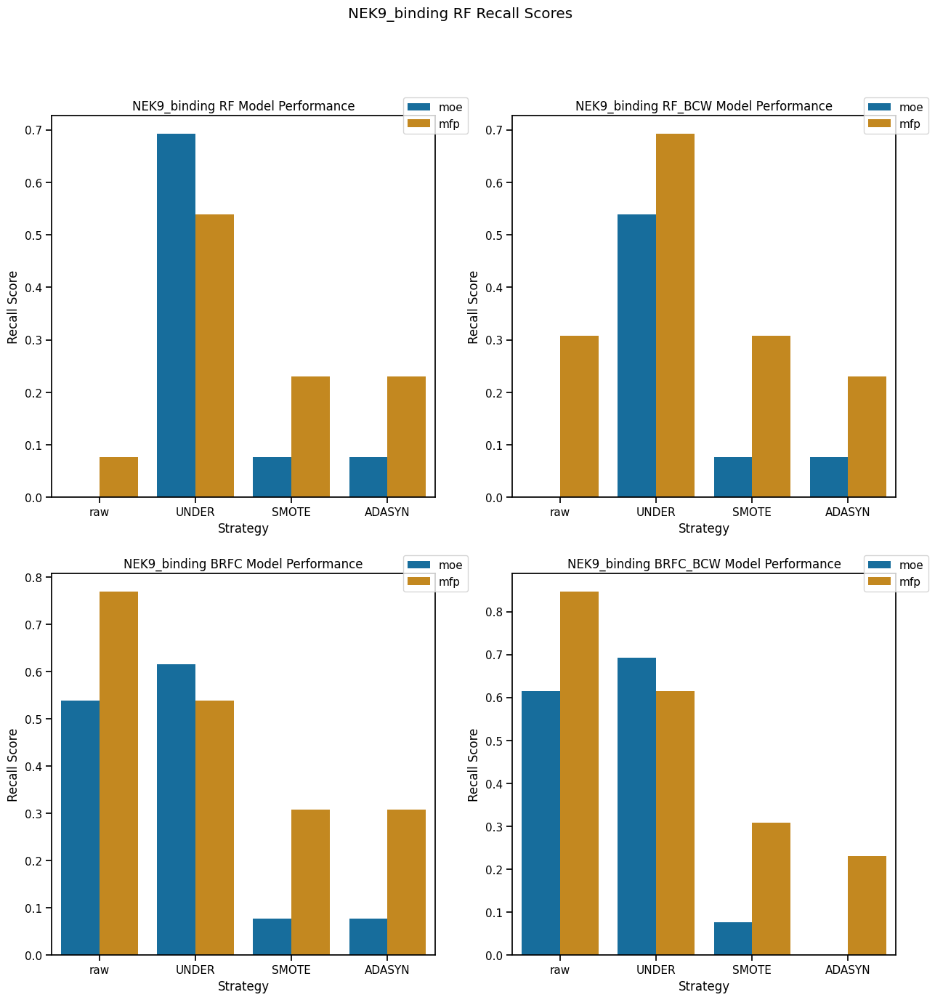

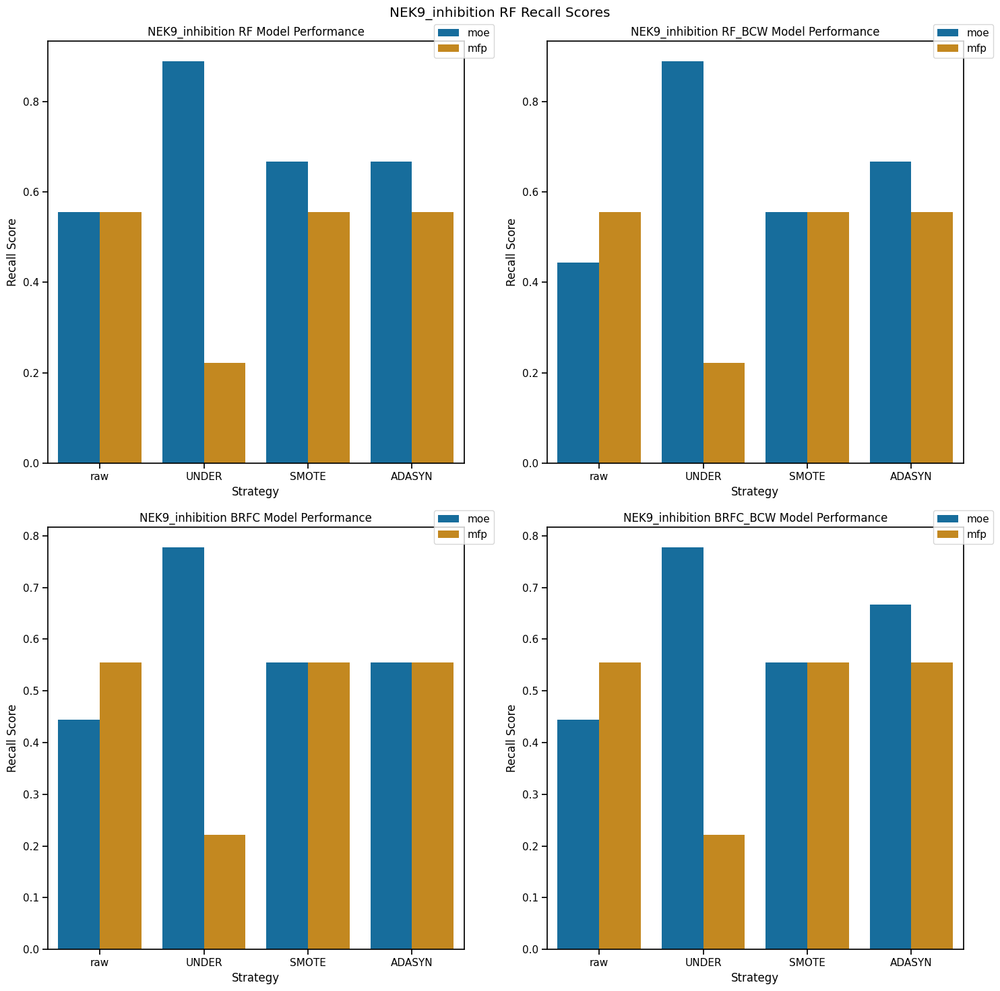

In [538]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
for nek in neks: 
    df = df_all[df_all['NEK'] == nek]
    df = df.drop(columns = tptnfpfn)
    rf_types = df['RF_type'].unique()
    nrows = (len(rf_types)+2-1)//2
    fig, axes = plt.subplots(nrows, ncols=2, figsize=(15, 15))
    axes = axes.flatten()
    for ax, rf in zip(axes, rf_types):
        rf_df = df[df['RF_type'] == rf]
        sns.barplot(data=rf_df, x='strategy', y='recall', hue='feat_type', ax=ax)
        ax.set_xlabel('Strategy')
        ax.set_ylabel('Recall Score')
        ax.set_title(f'{nek} {rf} Model Performance')
        ax.legend(loc='center',bbox_to_anchor=(1,1))
        plt.suptitle(f'{nek} RF Recall Scores')
        plt.savefig(f'figures/RF_plots/{nek}_recall_moe_mfp.png',bbox_inches='tight')
        
plt.tight_layout()
# plt.savefig(f'figures/RF_plots/RF_NEK_recall_moe_mfp.png',bbox_inches='tight')
plt.show();    

# save all subplots in one fig 

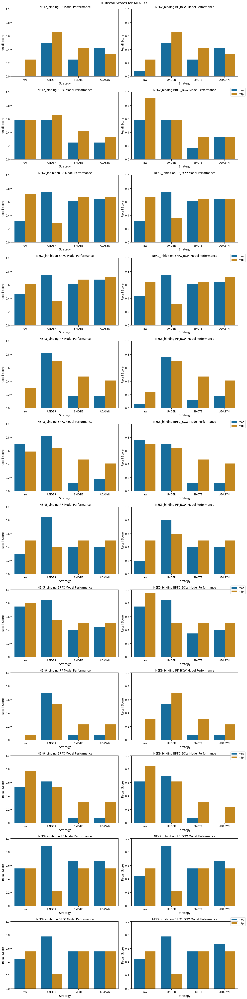

In [555]:
total_rf_types = len(df_all['RF_type'].unique())
total_neks = len(neks)
total_subplots = total_rf_types * total_neks
nrows = (total_subplots + 2 - 1) // 2
fig, axes = plt.subplots(nrows, ncols=2, figsize=(15, nrows * 5))
axes = axes.flatten()
ax_idx = 0
for nek in neks:
    df = df_all[df_all['NEK'] == nek]
    df = df.drop(columns=['TN', 'TP', 'FP', 'FN'])
    rf_types = df['RF_type'].unique()
    
    for rf in rf_types:
        ax = axes[ax_idx]
        rf_df = df[df['RF_type'] == rf]
        sns.barplot(data=rf_df, x='strategy', y='recall', hue='feat_type', ax=ax)
        ax.set_xlabel('Strategy')
        ax.set_ylabel('Recall Score')
        ax.set_title(f'{nek} {rf} Model Performance')
        ax.set_ylim(0,1)
        ax_idx += 1
        ax.get_legend().remove()
    ax.legend(loc='center',bbox_to_anchor=(1,1))
handles, labels = ax.get_legend_handles_labels()

plt.tight_layout();
plt.suptitle('RF Recall Scores for All NEKs',y=1.001)
plt.savefig('figures/RF_plots/RF_NEK_recall_moe_mfp.png', bbox_inches='tight')
plt.show();

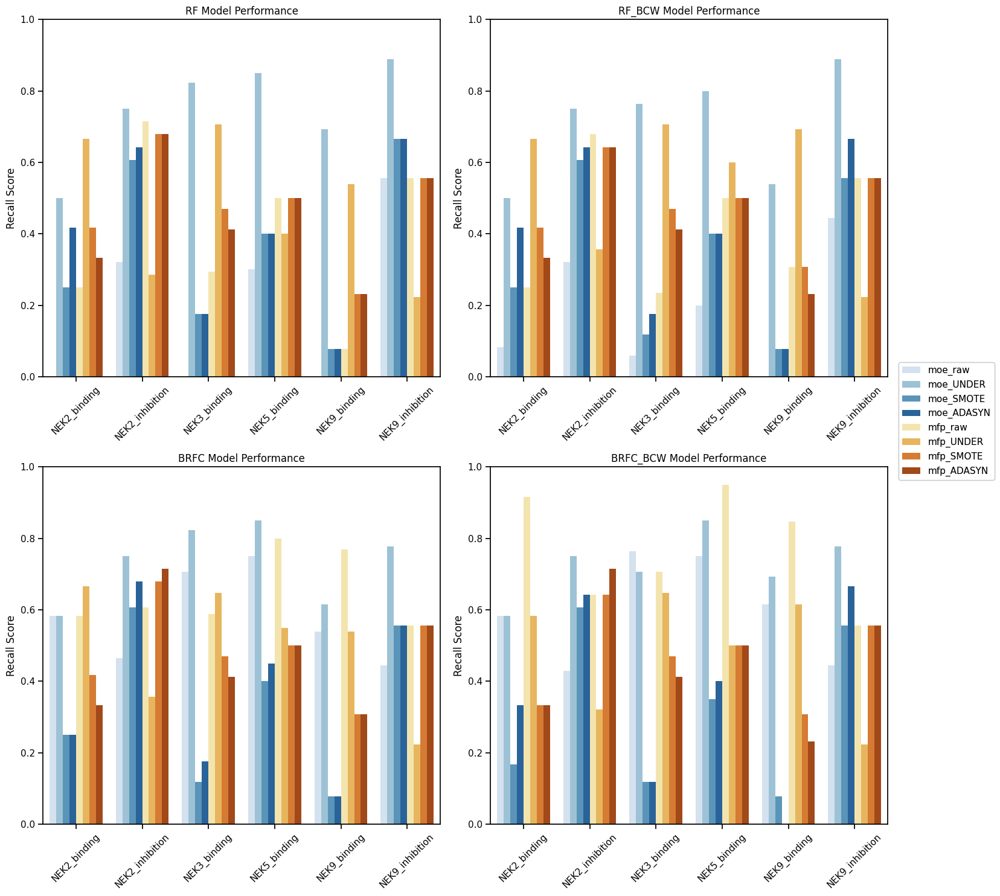

In [678]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
nrows = (len(rf_types)+2-1)//2
fig, axes = plt.subplots(nrows, ncols=2, figsize=(15, 15))
axes = axes.flatten()

for ax, rf in zip(axes, df_all2['RF_type'].unique()):
    df = df_all2[df_all2['RF_type'] == rf].drop(columns=tptnfpfn)
    # df.sort_values('train actives/total%',inplace=True)
    sns.barplot(data=df, x='NEK', y='recall', hue='dataset_category', ax=ax,palette=dataset_palette)
  
    # ax.set_xlabel('NEK')
    ax.set_ylabel('Recall Score')
    ax.set_title(f'{rf} Model Performance')
    ax.legend(loc='center', bbox_to_anchor=(1, 1))
    ax.tick_params(axis='x', rotation=45)
    ax.set(ylim=(0,1))
    ax.set(xlabel=None)
    ax.get_legend().remove()
    handles,labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center',bbox_to_anchor=(1.05,.6))
    
plt.tight_layout()
plt.savefig(f'figures/RF_plots/RF_typesubplots_recall.png',bbox_inches='tight')
plt.show();


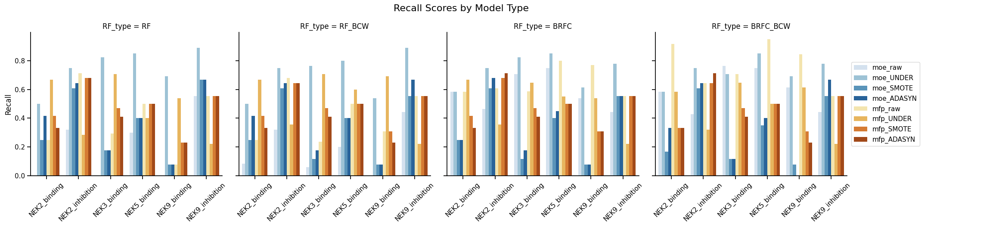

In [693]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
# sns.catplot(data=nek_df, x='RF_type', y='recall', hue='strategy',col='feat_type', kind='bar')
df = df_all2.drop(columns = tptnfpfn)
# df=df.sort_values('train actives/total%')
g2 = sns.catplot(data=df, x='NEK', y='recall', hue='dataset_category',col='RF_type', kind='bar', palette=dataset_palette)
plt.xticks(rotation=45)
sns.move_legend(g2, (1.0, 0.4))

g2.fig.subplots_adjust(top=0.95)
for ax in g2.axes.flat:
    ax.set_ylabel('Recall')
    for label in ax.get_xticklabels():
        label.set_rotation(45)
    ax.set(xlabel=None)
plt.legend(loc='center',bbox_to_anchor=(1.2,0.5))
plt.tight_layout()
plt.suptitle('Recall Scores by Model Type',y=1.05,fontsize=16)
plt.savefig(f'figures/RF_plots/RF_recall_horizontal_by_RF_type_ordered.png',bbox_inches='tight')
plt.show();

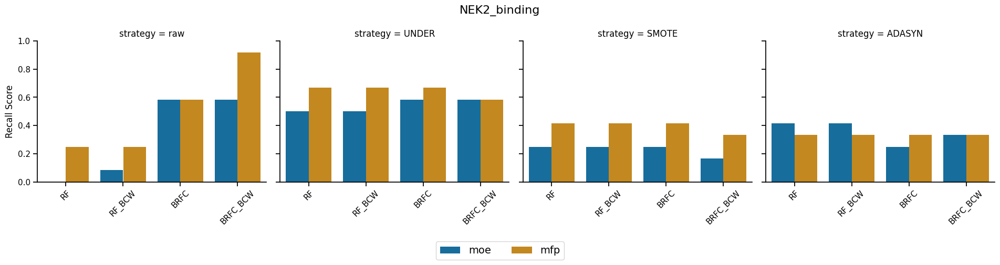

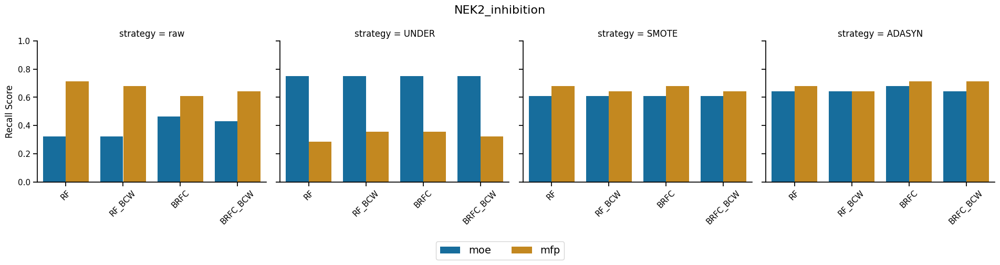

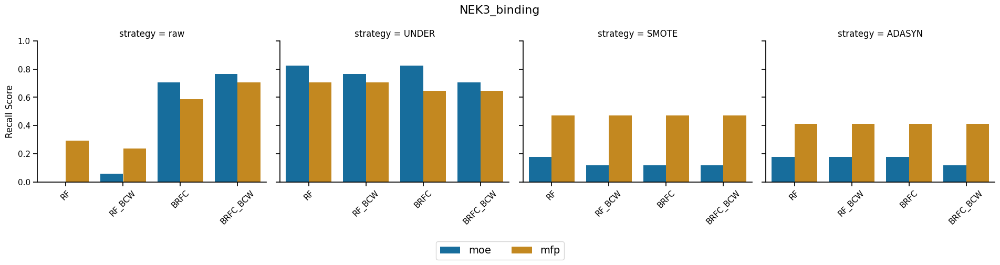

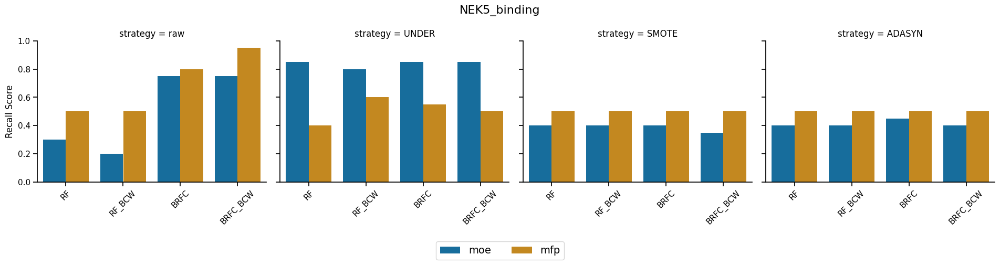

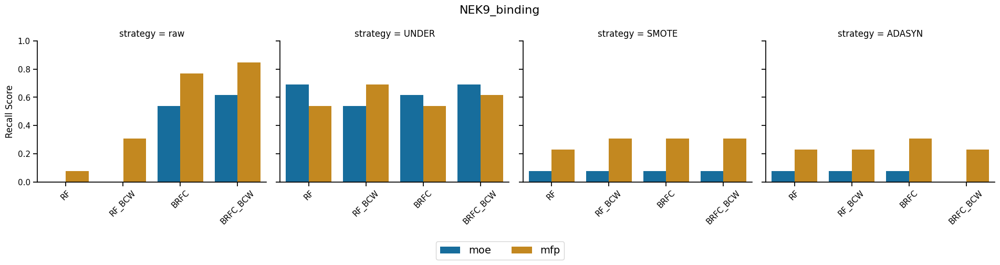

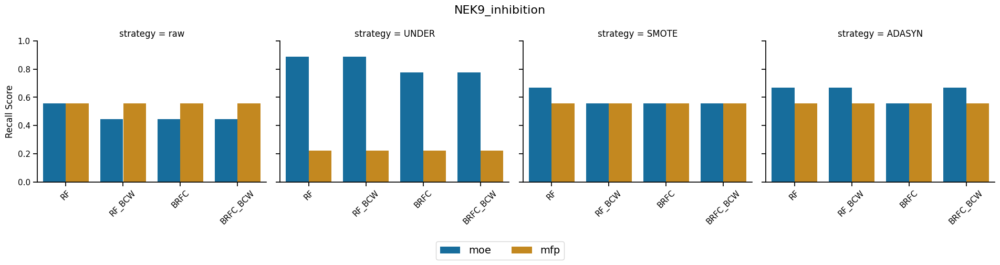

In [718]:
for n, nek in enumerate(neks): 
    nek_df = df_all[df_all['NEK'] ==nek]
    g5 = sns.catplot(data=nek_df, x='RF_type', y='recall', hue='feat_type', col='strategy', kind='bar', height=4, aspect=1.2,legend_out=False)
    g5.fig.suptitle(f'{nek}', y=1.02,fontsize=16)

    for ax in g5.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(45)
        if ax.get_legend() is not None:
            ax.get_legend().remove()
        ax.set(ylabel='Recall Score')
        ax.set(xlabel=None)
        ax.set(ylim=(0,1))
    g5.fig.subplots_adjust(top=0.85)
    # g5.fig.legend(loc='center', bbox_to_anchor=(1.044,0.5))
    g5.fig.legend(loc='center', bbox_to_anchor=(0.5,-.15), ncol=2,fontsize=14)
    # fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.01), ncol=len(labels))
    plt.show();
    g5.fig.savefig(f"figures/RF_plots/{nek}_RF_subplot_by_strategy.png", bbox_inches='tight')
    

In [ ]:
# Sort by modeling type
# 1. sort by 'feat_type' and make the strategies next to each other to compare RF_type (moe_ADASYN, mfp_ADASYN x4 each for 4x RF types) 
# moe_SMOTE_RF, moe_SMOTE_RF_BCW, moe_SMOTE_
# 2. sort by 'strategy' and make the feat

In [719]:
short_df_cols = [ 'NEK',  'feat_type', 'strategy', 'RF_type',  'precision', 'recall','cm', 'dataset_category']
strategies = ['scaled', 'UNDER', 'SMOTE', 'ADASYN']
feat_types = ['moe', 'mfp']
rf_types = ['RF', 'RF_BCW', 'BRFC', 'BRFC_BCW']
for nek in neks: 
    print(nek)
    # nek_df = df_all[df_all['NEK']==nek] 
    # nek_df = df_all.loc[df_all['NEK'] == nek, short_df_cols]
    # nek_pivot  = nek_df.pivot(index='dataset_category', columns ='RF_type', values='recall')
    # display(nek_pivot)
    
    # sorted = nek_df.sort_values('feat_type')
    # display(sorted)
    # print()

NEK2_binding
NEK2_inhibition
NEK3_binding
NEK5_binding
NEK9_binding
NEK9_inhibition


# feat_type, strategy, RF_type 


In [722]:
short_df_cols = [ 'NEK',  'feat_type', 'strategy', 'RF_type',  'precision', 'recall','cm', 'dataset_category']
strategies = ['raw', 'UNDER', 'SMOTE', 'ADASYN']
feat_types = ['moe', 'mfp']
rf_types = ['RF', 'RF_BCW', 'BRFC', 'BRFC_BCW']
for nek in neks: 
    nek_df = df_all.loc[df_all2['NEK'] == nek, short_df_cols]
    for strat in strategies: 
        print(f'{nek} {strat}')
        strategy_df = nek_df.loc[nek_df['strategy'] == strat, short_df_cols]
        display(strategy_df) 
        ordered_strat_df = strategy_df.sort_values('RF_type')
        display(ordered_strat_df)
        print(f'feat type and rf type for best recall for {nek} {strat} \n {strategy_df.loc[strategy_df["recall"].idxmax(), ["feat_type", "RF_type"]]}')

    print()

NEK2_binding raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
1,NEK2_binding,moe,raw,RF_BCW,1.000000,0.083333,"[271, 0, 11, 1]",moe_raw
2,NEK2_binding,moe,raw,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_raw
3,NEK2_binding,moe,raw,BRFC_BCW,0.093333,0.583333,"[203, 68, 5, 7]",moe_raw
16,NEK2_binding,mfp,raw,RF,0.750000,0.250000,"[270, 1, 9, 3]",mfp_raw
17,NEK2_binding,mfp,raw,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",mfp_raw
18,NEK2_binding,mfp,raw,BRFC,0.129630,0.583333,"[224, 47, 5, 7]",mfp_raw
19,NEK2_binding,mfp,raw,BRFC_BCW,0.059140,0.916667,"[96, 175, 1, 11]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
2,NEK2_binding,moe,raw,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_raw
18,NEK2_binding,mfp,raw,BRFC,0.129630,0.583333,"[224, 47, 5, 7]",mfp_raw
3,NEK2_binding,moe,raw,BRFC_BCW,0.093333,0.583333,"[203, 68, 5, 7]",moe_raw
19,NEK2_binding,mfp,raw,BRFC_BCW,0.059140,0.916667,"[96, 175, 1, 11]",mfp_raw
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
16,NEK2_binding,mfp,raw,RF,0.750000,0.250000,"[270, 1, 9, 3]",mfp_raw
1,NEK2_binding,moe,raw,RF_BCW,1.000000,0.083333,"[271, 0, 11, 1]",moe_raw
17,NEK2_binding,mfp,raw,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",mfp_raw


feat type and rf type for best recall for NEK2_binding raw 
 feat_type         mfp
RF_type      BRFC_BCW
Name: 19, dtype: object
NEK2_binding UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
4,NEK2_binding,moe,UNDER,RF,0.069767,0.500000,"[191, 80, 6, 6]",moe_UNDER
5,NEK2_binding,moe,UNDER,RF_BCW,0.078947,0.500000,"[201, 70, 6, 6]",moe_UNDER
6,NEK2_binding,moe,UNDER,BRFC,0.087500,0.583333,"[198, 73, 5, 7]",moe_UNDER
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.090909,0.583333,"[201, 70, 5, 7]",moe_UNDER
20,NEK2_binding,mfp,UNDER,RF,0.063492,0.666667,"[153, 118, 4, 8]",mfp_UNDER
21,NEK2_binding,mfp,UNDER,RF_BCW,0.067227,0.666667,"[160, 111, 4, 8]",mfp_UNDER
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.666667,"[151, 120, 4, 8]",mfp_UNDER
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.063636,0.583333,"[168, 103, 5, 7]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
6,NEK2_binding,moe,UNDER,BRFC,0.087500,0.583333,"[198, 73, 5, 7]",moe_UNDER
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.666667,"[151, 120, 4, 8]",mfp_UNDER
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.090909,0.583333,"[201, 70, 5, 7]",moe_UNDER
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.063636,0.583333,"[168, 103, 5, 7]",mfp_UNDER
4,NEK2_binding,moe,UNDER,RF,0.069767,0.500000,"[191, 80, 6, 6]",moe_UNDER
20,NEK2_binding,mfp,UNDER,RF,0.063492,0.666667,"[153, 118, 4, 8]",mfp_UNDER
5,NEK2_binding,moe,UNDER,RF_BCW,0.078947,0.500000,"[201, 70, 6, 6]",moe_UNDER
21,NEK2_binding,mfp,UNDER,RF_BCW,0.067227,0.666667,"[160, 111, 4, 8]",mfp_UNDER


feat type and rf type for best recall for NEK2_binding UNDER 
 feat_type    mfp
RF_type       RF
Name: 20, dtype: object
NEK2_binding SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
8,NEK2_binding,moe,SMOTE,RF,0.500000,0.250000,"[268, 3, 9, 3]",moe_SMOTE
9,NEK2_binding,moe,SMOTE,RF_BCW,1.000000,0.250000,"[271, 0, 9, 3]",moe_SMOTE
10,NEK2_binding,moe,SMOTE,BRFC,0.750000,0.250000,"[270, 1, 9, 3]",moe_SMOTE
11,NEK2_binding,moe,SMOTE,BRFC_BCW,0.500000,0.166667,"[269, 2, 10, 2]",moe_SMOTE
24,NEK2_binding,mfp,SMOTE,RF,0.416667,0.416667,"[264, 7, 7, 5]",mfp_SMOTE
25,NEK2_binding,mfp,SMOTE,RF_BCW,0.454545,0.416667,"[265, 6, 7, 5]",mfp_SMOTE
26,NEK2_binding,mfp,SMOTE,BRFC,0.416667,0.416667,"[264, 7, 7, 5]",mfp_SMOTE
27,NEK2_binding,mfp,SMOTE,BRFC_BCW,0.363636,0.333333,"[264, 7, 8, 4]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
10,NEK2_binding,moe,SMOTE,BRFC,0.750000,0.250000,"[270, 1, 9, 3]",moe_SMOTE
26,NEK2_binding,mfp,SMOTE,BRFC,0.416667,0.416667,"[264, 7, 7, 5]",mfp_SMOTE
11,NEK2_binding,moe,SMOTE,BRFC_BCW,0.500000,0.166667,"[269, 2, 10, 2]",moe_SMOTE
27,NEK2_binding,mfp,SMOTE,BRFC_BCW,0.363636,0.333333,"[264, 7, 8, 4]",mfp_SMOTE
8,NEK2_binding,moe,SMOTE,RF,0.500000,0.250000,"[268, 3, 9, 3]",moe_SMOTE
24,NEK2_binding,mfp,SMOTE,RF,0.416667,0.416667,"[264, 7, 7, 5]",mfp_SMOTE
9,NEK2_binding,moe,SMOTE,RF_BCW,1.000000,0.250000,"[271, 0, 9, 3]",moe_SMOTE
25,NEK2_binding,mfp,SMOTE,RF_BCW,0.454545,0.416667,"[265, 6, 7, 5]",mfp_SMOTE


feat type and rf type for best recall for NEK2_binding SMOTE 
 feat_type    mfp
RF_type       RF
Name: 24, dtype: object
NEK2_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
12,NEK2_binding,moe,ADASYN,RF,0.555556,0.416667,"[267, 4, 7, 5]",moe_ADASYN
13,NEK2_binding,moe,ADASYN,RF_BCW,0.500000,0.416667,"[266, 5, 7, 5]",moe_ADASYN
14,NEK2_binding,moe,ADASYN,BRFC,0.375000,0.250000,"[266, 5, 9, 3]",moe_ADASYN
15,NEK2_binding,moe,ADASYN,BRFC_BCW,0.444444,0.333333,"[266, 5, 8, 4]",moe_ADASYN
28,NEK2_binding,mfp,ADASYN,RF,0.500000,0.333333,"[267, 4, 8, 4]",mfp_ADASYN
29,NEK2_binding,mfp,ADASYN,RF_BCW,0.571429,0.333333,"[268, 3, 8, 4]",mfp_ADASYN
30,NEK2_binding,mfp,ADASYN,BRFC,0.444444,0.333333,"[266, 5, 8, 4]",mfp_ADASYN
31,NEK2_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.333333,"[267, 4, 8, 4]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
14,NEK2_binding,moe,ADASYN,BRFC,0.375000,0.250000,"[266, 5, 9, 3]",moe_ADASYN
30,NEK2_binding,mfp,ADASYN,BRFC,0.444444,0.333333,"[266, 5, 8, 4]",mfp_ADASYN
15,NEK2_binding,moe,ADASYN,BRFC_BCW,0.444444,0.333333,"[266, 5, 8, 4]",moe_ADASYN
31,NEK2_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.333333,"[267, 4, 8, 4]",mfp_ADASYN
12,NEK2_binding,moe,ADASYN,RF,0.555556,0.416667,"[267, 4, 7, 5]",moe_ADASYN
28,NEK2_binding,mfp,ADASYN,RF,0.500000,0.333333,"[267, 4, 8, 4]",mfp_ADASYN
13,NEK2_binding,moe,ADASYN,RF_BCW,0.500000,0.416667,"[266, 5, 7, 5]",moe_ADASYN
29,NEK2_binding,mfp,ADASYN,RF_BCW,0.571429,0.333333,"[268, 3, 8, 4]",mfp_ADASYN


feat type and rf type for best recall for NEK2_binding ADASYN 
 feat_type    moe
RF_type       RF
Name: 12, dtype: object

NEK2_inhibition raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
32,NEK2_inhibition,moe,raw,RF,1.000000,0.321429,"[381, 0, 19, 9]",moe_raw
33,NEK2_inhibition,moe,raw,RF_BCW,1.000000,0.321429,"[381, 0, 19, 9]",moe_raw
34,NEK2_inhibition,moe,raw,BRFC,1.000000,0.464286,"[381, 0, 15, 13]",moe_raw
35,NEK2_inhibition,moe,raw,BRFC_BCW,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
48,NEK2_inhibition,mfp,raw,RF,0.869565,0.714286,"[378, 3, 8, 20]",mfp_raw
49,NEK2_inhibition,mfp,raw,RF_BCW,0.904762,0.678571,"[379, 2, 9, 19]",mfp_raw
50,NEK2_inhibition,mfp,raw,BRFC,0.894737,0.607143,"[379, 2, 11, 17]",mfp_raw
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
34,NEK2_inhibition,moe,raw,BRFC,1.000000,0.464286,"[381, 0, 15, 13]",moe_raw
50,NEK2_inhibition,mfp,raw,BRFC,0.894737,0.607143,"[379, 2, 11, 17]",mfp_raw
35,NEK2_inhibition,moe,raw,BRFC_BCW,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_raw
32,NEK2_inhibition,moe,raw,RF,1.000000,0.321429,"[381, 0, 19, 9]",moe_raw
48,NEK2_inhibition,mfp,raw,RF,0.869565,0.714286,"[378, 3, 8, 20]",mfp_raw
33,NEK2_inhibition,moe,raw,RF_BCW,1.000000,0.321429,"[381, 0, 19, 9]",moe_raw
49,NEK2_inhibition,mfp,raw,RF_BCW,0.904762,0.678571,"[379, 2, 9, 19]",mfp_raw


feat type and rf type for best recall for NEK2_inhibition raw 
 feat_type    mfp
RF_type       RF
Name: 48, dtype: object
NEK2_inhibition UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
36,NEK2_inhibition,moe,UNDER,RF,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER
37,NEK2_inhibition,moe,UNDER,RF_BCW,0.304348,0.750000,"[333, 48, 7, 21]",moe_UNDER
38,NEK2_inhibition,moe,UNDER,BRFC,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.344262,0.750000,"[341, 40, 7, 21]",moe_UNDER
52,NEK2_inhibition,mfp,UNDER,RF,0.040000,0.285714,"[189, 192, 20, 8]",mfp_UNDER
53,NEK2_inhibition,mfp,UNDER,RF_BCW,0.047847,0.357143,"[182, 199, 18, 10]",mfp_UNDER
54,NEK2_inhibition,mfp,UNDER,BRFC,0.047393,0.357143,"[180, 201, 18, 10]",mfp_UNDER
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.042857,0.321429,"[180, 201, 19, 9]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
38,NEK2_inhibition,moe,UNDER,BRFC,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER
54,NEK2_inhibition,mfp,UNDER,BRFC,0.047393,0.357143,"[180, 201, 18, 10]",mfp_UNDER
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.344262,0.750000,"[341, 40, 7, 21]",moe_UNDER
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.042857,0.321429,"[180, 201, 19, 9]",mfp_UNDER
36,NEK2_inhibition,moe,UNDER,RF,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER
52,NEK2_inhibition,mfp,UNDER,RF,0.040000,0.285714,"[189, 192, 20, 8]",mfp_UNDER
37,NEK2_inhibition,moe,UNDER,RF_BCW,0.304348,0.750000,"[333, 48, 7, 21]",moe_UNDER
53,NEK2_inhibition,mfp,UNDER,RF_BCW,0.047847,0.357143,"[182, 199, 18, 10]",mfp_UNDER


feat type and rf type for best recall for NEK2_inhibition UNDER 
 feat_type    moe
RF_type       RF
Name: 36, dtype: object
NEK2_inhibition SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
40,NEK2_inhibition,moe,SMOTE,RF,0.772727,0.607143,"[376, 5, 11, 17]",moe_SMOTE
41,NEK2_inhibition,moe,SMOTE,RF_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
42,NEK2_inhibition,moe,SMOTE,BRFC,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
43,NEK2_inhibition,moe,SMOTE,BRFC_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
56,NEK2_inhibition,mfp,SMOTE,RF,0.730769,0.678571,"[374, 7, 9, 19]",mfp_SMOTE
57,NEK2_inhibition,mfp,SMOTE,RF_BCW,0.720000,0.642857,"[374, 7, 10, 18]",mfp_SMOTE
58,NEK2_inhibition,mfp,SMOTE,BRFC,0.730769,0.678571,"[374, 7, 9, 19]",mfp_SMOTE
59,NEK2_inhibition,mfp,SMOTE,BRFC_BCW,0.720000,0.642857,"[374, 7, 10, 18]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
42,NEK2_inhibition,moe,SMOTE,BRFC,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
58,NEK2_inhibition,mfp,SMOTE,BRFC,0.730769,0.678571,"[374, 7, 9, 19]",mfp_SMOTE
43,NEK2_inhibition,moe,SMOTE,BRFC_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
59,NEK2_inhibition,mfp,SMOTE,BRFC_BCW,0.720000,0.642857,"[374, 7, 10, 18]",mfp_SMOTE
40,NEK2_inhibition,moe,SMOTE,RF,0.772727,0.607143,"[376, 5, 11, 17]",moe_SMOTE
56,NEK2_inhibition,mfp,SMOTE,RF,0.730769,0.678571,"[374, 7, 9, 19]",mfp_SMOTE
41,NEK2_inhibition,moe,SMOTE,RF_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
57,NEK2_inhibition,mfp,SMOTE,RF_BCW,0.720000,0.642857,"[374, 7, 10, 18]",mfp_SMOTE


feat type and rf type for best recall for NEK2_inhibition SMOTE 
 feat_type    mfp
RF_type       RF
Name: 56, dtype: object
NEK2_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
44,NEK2_inhibition,moe,ADASYN,RF,0.818182,0.642857,"[377, 4, 10, 18]",moe_ADASYN
45,NEK2_inhibition,moe,ADASYN,RF_BCW,0.818182,0.642857,"[377, 4, 10, 18]",moe_ADASYN
46,NEK2_inhibition,moe,ADASYN,BRFC,0.826087,0.678571,"[377, 4, 9, 19]",moe_ADASYN
47,NEK2_inhibition,moe,ADASYN,BRFC_BCW,0.720000,0.642857,"[374, 7, 10, 18]",moe_ADASYN
60,NEK2_inhibition,mfp,ADASYN,RF,0.703704,0.678571,"[373, 8, 9, 19]",mfp_ADASYN
61,NEK2_inhibition,mfp,ADASYN,RF_BCW,0.666667,0.642857,"[372, 9, 10, 18]",mfp_ADASYN
62,NEK2_inhibition,mfp,ADASYN,BRFC,0.714286,0.714286,"[373, 8, 8, 20]",mfp_ADASYN
63,NEK2_inhibition,mfp,ADASYN,BRFC_BCW,0.689655,0.714286,"[372, 9, 8, 20]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
46,NEK2_inhibition,moe,ADASYN,BRFC,0.826087,0.678571,"[377, 4, 9, 19]",moe_ADASYN
62,NEK2_inhibition,mfp,ADASYN,BRFC,0.714286,0.714286,"[373, 8, 8, 20]",mfp_ADASYN
47,NEK2_inhibition,moe,ADASYN,BRFC_BCW,0.720000,0.642857,"[374, 7, 10, 18]",moe_ADASYN
63,NEK2_inhibition,mfp,ADASYN,BRFC_BCW,0.689655,0.714286,"[372, 9, 8, 20]",mfp_ADASYN
44,NEK2_inhibition,moe,ADASYN,RF,0.818182,0.642857,"[377, 4, 10, 18]",moe_ADASYN
60,NEK2_inhibition,mfp,ADASYN,RF,0.703704,0.678571,"[373, 8, 9, 19]",mfp_ADASYN
45,NEK2_inhibition,moe,ADASYN,RF_BCW,0.818182,0.642857,"[377, 4, 10, 18]",moe_ADASYN
61,NEK2_inhibition,mfp,ADASYN,RF_BCW,0.666667,0.642857,"[372, 9, 10, 18]",mfp_ADASYN


feat type and rf type for best recall for NEK2_inhibition ADASYN 
 feat_type     mfp
RF_type      BRFC
Name: 62, dtype: object

NEK3_binding raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[262, 3, 17, 0]",moe_raw
65,NEK3_binding,moe,raw,RF_BCW,1.000000,0.058824,"[265, 0, 16, 1]",moe_raw
66,NEK3_binding,moe,raw,BRFC,0.103448,0.705882,"[161, 104, 5, 12]",moe_raw
67,NEK3_binding,moe,raw,BRFC_BCW,0.111111,0.764706,"[161, 104, 4, 13]",moe_raw
80,NEK3_binding,mfp,raw,RF,0.625000,0.294118,"[262, 3, 12, 5]",mfp_raw
81,NEK3_binding,mfp,raw,RF_BCW,0.400000,0.235294,"[259, 6, 13, 4]",mfp_raw
82,NEK3_binding,mfp,raw,BRFC,0.151515,0.588235,"[209, 56, 7, 10]",mfp_raw
83,NEK3_binding,mfp,raw,BRFC_BCW,0.090909,0.705882,"[145, 120, 5, 12]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
66,NEK3_binding,moe,raw,BRFC,0.103448,0.705882,"[161, 104, 5, 12]",moe_raw
82,NEK3_binding,mfp,raw,BRFC,0.151515,0.588235,"[209, 56, 7, 10]",mfp_raw
67,NEK3_binding,moe,raw,BRFC_BCW,0.111111,0.764706,"[161, 104, 4, 13]",moe_raw
83,NEK3_binding,mfp,raw,BRFC_BCW,0.090909,0.705882,"[145, 120, 5, 12]",mfp_raw
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[262, 3, 17, 0]",moe_raw
80,NEK3_binding,mfp,raw,RF,0.625000,0.294118,"[262, 3, 12, 5]",mfp_raw
65,NEK3_binding,moe,raw,RF_BCW,1.000000,0.058824,"[265, 0, 16, 1]",moe_raw
81,NEK3_binding,mfp,raw,RF_BCW,0.400000,0.235294,"[259, 6, 13, 4]",mfp_raw


feat type and rf type for best recall for NEK3_binding raw 
 feat_type         moe
RF_type      BRFC_BCW
Name: 67, dtype: object
NEK3_binding UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
68,NEK3_binding,moe,UNDER,RF,0.097222,0.823529,"[135, 130, 3, 14]",moe_UNDER
69,NEK3_binding,moe,UNDER,RF_BCW,0.090909,0.764706,"[135, 130, 4, 13]",moe_UNDER
70,NEK3_binding,moe,UNDER,BRFC,0.101449,0.823529,"[141, 124, 3, 14]",moe_UNDER
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.088235,0.705882,"[141, 124, 5, 12]",moe_UNDER
84,NEK3_binding,mfp,UNDER,RF,0.080000,0.705882,"[127, 138, 5, 12]",mfp_UNDER
85,NEK3_binding,mfp,UNDER,RF_BCW,0.084507,0.705882,"[135, 130, 5, 12]",mfp_UNDER
86,NEK3_binding,mfp,UNDER,BRFC,0.076389,0.647059,"[132, 133, 6, 11]",mfp_UNDER
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.080292,0.647059,"[139, 126, 6, 11]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
70,NEK3_binding,moe,UNDER,BRFC,0.101449,0.823529,"[141, 124, 3, 14]",moe_UNDER
86,NEK3_binding,mfp,UNDER,BRFC,0.076389,0.647059,"[132, 133, 6, 11]",mfp_UNDER
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.088235,0.705882,"[141, 124, 5, 12]",moe_UNDER
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.080292,0.647059,"[139, 126, 6, 11]",mfp_UNDER
68,NEK3_binding,moe,UNDER,RF,0.097222,0.823529,"[135, 130, 3, 14]",moe_UNDER
84,NEK3_binding,mfp,UNDER,RF,0.080000,0.705882,"[127, 138, 5, 12]",mfp_UNDER
69,NEK3_binding,moe,UNDER,RF_BCW,0.090909,0.764706,"[135, 130, 4, 13]",moe_UNDER
85,NEK3_binding,mfp,UNDER,RF_BCW,0.084507,0.705882,"[135, 130, 5, 12]",mfp_UNDER


feat type and rf type for best recall for NEK3_binding UNDER 
 feat_type    moe
RF_type       RF
Name: 68, dtype: object
NEK3_binding SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
72,NEK3_binding,moe,SMOTE,RF,0.230769,0.176471,"[255, 10, 14, 3]",moe_SMOTE
73,NEK3_binding,moe,SMOTE,RF_BCW,0.200000,0.117647,"[257, 8, 15, 2]",moe_SMOTE
74,NEK3_binding,moe,SMOTE,BRFC,0.181818,0.117647,"[256, 9, 15, 2]",moe_SMOTE
75,NEK3_binding,moe,SMOTE,BRFC_BCW,0.166667,0.117647,"[255, 10, 15, 2]",moe_SMOTE
88,NEK3_binding,mfp,SMOTE,RF,0.333333,0.470588,"[249, 16, 9, 8]",mfp_SMOTE
89,NEK3_binding,mfp,SMOTE,RF_BCW,0.320000,0.470588,"[248, 17, 9, 8]",mfp_SMOTE
90,NEK3_binding,mfp,SMOTE,BRFC,0.307692,0.470588,"[247, 18, 9, 8]",mfp_SMOTE
91,NEK3_binding,mfp,SMOTE,BRFC_BCW,0.320000,0.470588,"[248, 17, 9, 8]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
74,NEK3_binding,moe,SMOTE,BRFC,0.181818,0.117647,"[256, 9, 15, 2]",moe_SMOTE
90,NEK3_binding,mfp,SMOTE,BRFC,0.307692,0.470588,"[247, 18, 9, 8]",mfp_SMOTE
75,NEK3_binding,moe,SMOTE,BRFC_BCW,0.166667,0.117647,"[255, 10, 15, 2]",moe_SMOTE
91,NEK3_binding,mfp,SMOTE,BRFC_BCW,0.320000,0.470588,"[248, 17, 9, 8]",mfp_SMOTE
72,NEK3_binding,moe,SMOTE,RF,0.230769,0.176471,"[255, 10, 14, 3]",moe_SMOTE
88,NEK3_binding,mfp,SMOTE,RF,0.333333,0.470588,"[249, 16, 9, 8]",mfp_SMOTE
73,NEK3_binding,moe,SMOTE,RF_BCW,0.200000,0.117647,"[257, 8, 15, 2]",moe_SMOTE
89,NEK3_binding,mfp,SMOTE,RF_BCW,0.320000,0.470588,"[248, 17, 9, 8]",mfp_SMOTE


feat type and rf type for best recall for NEK3_binding SMOTE 
 feat_type    mfp
RF_type       RF
Name: 88, dtype: object
NEK3_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
76,NEK3_binding,moe,ADASYN,RF,0.200000,0.176471,"[253, 12, 14, 3]",moe_ADASYN
77,NEK3_binding,moe,ADASYN,RF_BCW,0.200000,0.176471,"[253, 12, 14, 3]",moe_ADASYN
78,NEK3_binding,moe,ADASYN,BRFC,0.230769,0.176471,"[255, 10, 14, 3]",moe_ADASYN
79,NEK3_binding,moe,ADASYN,BRFC_BCW,0.166667,0.117647,"[255, 10, 15, 2]",moe_ADASYN
92,NEK3_binding,mfp,ADASYN,RF,0.333333,0.411765,"[251, 14, 10, 7]",mfp_ADASYN
93,NEK3_binding,mfp,ADASYN,RF_BCW,0.291667,0.411765,"[248, 17, 10, 7]",mfp_ADASYN
94,NEK3_binding,mfp,ADASYN,BRFC,0.291667,0.411765,"[248, 17, 10, 7]",mfp_ADASYN
95,NEK3_binding,mfp,ADASYN,BRFC_BCW,0.280000,0.411765,"[247, 18, 10, 7]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
78,NEK3_binding,moe,ADASYN,BRFC,0.230769,0.176471,"[255, 10, 14, 3]",moe_ADASYN
94,NEK3_binding,mfp,ADASYN,BRFC,0.291667,0.411765,"[248, 17, 10, 7]",mfp_ADASYN
79,NEK3_binding,moe,ADASYN,BRFC_BCW,0.166667,0.117647,"[255, 10, 15, 2]",moe_ADASYN
95,NEK3_binding,mfp,ADASYN,BRFC_BCW,0.280000,0.411765,"[247, 18, 10, 7]",mfp_ADASYN
76,NEK3_binding,moe,ADASYN,RF,0.200000,0.176471,"[253, 12, 14, 3]",moe_ADASYN
92,NEK3_binding,mfp,ADASYN,RF,0.333333,0.411765,"[251, 14, 10, 7]",mfp_ADASYN
77,NEK3_binding,moe,ADASYN,RF_BCW,0.200000,0.176471,"[253, 12, 14, 3]",moe_ADASYN
93,NEK3_binding,mfp,ADASYN,RF_BCW,0.291667,0.411765,"[248, 17, 10, 7]",mfp_ADASYN


feat type and rf type for best recall for NEK3_binding ADASYN 
 feat_type    mfp
RF_type       RF
Name: 92, dtype: object

NEK5_binding raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
96,NEK5_binding,moe,raw,RF,1.000000,0.30,"[228, 0, 14, 6]",moe_raw
97,NEK5_binding,moe,raw,RF_BCW,1.000000,0.20,"[228, 0, 16, 4]",moe_raw
98,NEK5_binding,moe,raw,BRFC,0.208333,0.75,"[171, 57, 5, 15]",moe_raw
99,NEK5_binding,moe,raw,BRFC_BCW,0.185185,0.75,"[162, 66, 5, 15]",moe_raw
112,NEK5_binding,mfp,raw,RF,0.769231,0.50,"[225, 3, 10, 10]",mfp_raw
113,NEK5_binding,mfp,raw,RF_BCW,0.666667,0.50,"[223, 5, 10, 10]",mfp_raw
114,NEK5_binding,mfp,raw,BRFC,0.320000,0.80,"[194, 34, 4, 16]",mfp_raw
115,NEK5_binding,mfp,raw,BRFC_BCW,0.169643,0.95,"[135, 93, 1, 19]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
98,NEK5_binding,moe,raw,BRFC,0.208333,0.75,"[171, 57, 5, 15]",moe_raw
114,NEK5_binding,mfp,raw,BRFC,0.320000,0.80,"[194, 34, 4, 16]",mfp_raw
99,NEK5_binding,moe,raw,BRFC_BCW,0.185185,0.75,"[162, 66, 5, 15]",moe_raw
115,NEK5_binding,mfp,raw,BRFC_BCW,0.169643,0.95,"[135, 93, 1, 19]",mfp_raw
96,NEK5_binding,moe,raw,RF,1.000000,0.30,"[228, 0, 14, 6]",moe_raw
112,NEK5_binding,mfp,raw,RF,0.769231,0.50,"[225, 3, 10, 10]",mfp_raw
97,NEK5_binding,moe,raw,RF_BCW,1.000000,0.20,"[228, 0, 16, 4]",moe_raw
113,NEK5_binding,mfp,raw,RF_BCW,0.666667,0.50,"[223, 5, 10, 10]",mfp_raw


feat type and rf type for best recall for NEK5_binding raw 
 feat_type         mfp
RF_type      BRFC_BCW
Name: 115, dtype: object
NEK5_binding UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
100,NEK5_binding,moe,UNDER,RF,0.202381,0.85,"[161, 67, 3, 17]",moe_UNDER
101,NEK5_binding,moe,UNDER,RF_BCW,0.207792,0.80,"[167, 61, 4, 16]",moe_UNDER
102,NEK5_binding,moe,UNDER,BRFC,0.207317,0.85,"[163, 65, 3, 17]",moe_UNDER
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.195402,0.85,"[158, 70, 3, 17]",moe_UNDER
116,NEK5_binding,mfp,UNDER,RF,0.069565,0.40,"[121, 107, 12, 8]",mfp_UNDER
117,NEK5_binding,mfp,UNDER,RF_BCW,0.096000,0.60,"[115, 113, 8, 12]",mfp_UNDER
118,NEK5_binding,mfp,UNDER,BRFC,0.093220,0.55,"[121, 107, 9, 11]",mfp_UNDER
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.077519,0.50,"[109, 119, 10, 10]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
102,NEK5_binding,moe,UNDER,BRFC,0.207317,0.85,"[163, 65, 3, 17]",moe_UNDER
118,NEK5_binding,mfp,UNDER,BRFC,0.093220,0.55,"[121, 107, 9, 11]",mfp_UNDER
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.195402,0.85,"[158, 70, 3, 17]",moe_UNDER
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.077519,0.50,"[109, 119, 10, 10]",mfp_UNDER
100,NEK5_binding,moe,UNDER,RF,0.202381,0.85,"[161, 67, 3, 17]",moe_UNDER
116,NEK5_binding,mfp,UNDER,RF,0.069565,0.40,"[121, 107, 12, 8]",mfp_UNDER
101,NEK5_binding,moe,UNDER,RF_BCW,0.207792,0.80,"[167, 61, 4, 16]",moe_UNDER
117,NEK5_binding,mfp,UNDER,RF_BCW,0.096000,0.60,"[115, 113, 8, 12]",mfp_UNDER


feat type and rf type for best recall for NEK5_binding UNDER 
 feat_type    moe
RF_type       RF
Name: 100, dtype: object
NEK5_binding SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
104,NEK5_binding,moe,SMOTE,RF,0.533333,0.40,"[221, 7, 12, 8]",moe_SMOTE
105,NEK5_binding,moe,SMOTE,RF_BCW,0.615385,0.40,"[223, 5, 12, 8]",moe_SMOTE
106,NEK5_binding,moe,SMOTE,BRFC,0.571429,0.40,"[222, 6, 12, 8]",moe_SMOTE
107,NEK5_binding,moe,SMOTE,BRFC_BCW,0.636364,0.35,"[224, 4, 13, 7]",moe_SMOTE
120,NEK5_binding,mfp,SMOTE,RF,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE
121,NEK5_binding,mfp,SMOTE,RF_BCW,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE
122,NEK5_binding,mfp,SMOTE,BRFC,0.625000,0.50,"[222, 6, 10, 10]",mfp_SMOTE
123,NEK5_binding,mfp,SMOTE,BRFC_BCW,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
106,NEK5_binding,moe,SMOTE,BRFC,0.571429,0.40,"[222, 6, 12, 8]",moe_SMOTE
122,NEK5_binding,mfp,SMOTE,BRFC,0.625000,0.50,"[222, 6, 10, 10]",mfp_SMOTE
107,NEK5_binding,moe,SMOTE,BRFC_BCW,0.636364,0.35,"[224, 4, 13, 7]",moe_SMOTE
123,NEK5_binding,mfp,SMOTE,BRFC_BCW,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE
104,NEK5_binding,moe,SMOTE,RF,0.533333,0.40,"[221, 7, 12, 8]",moe_SMOTE
120,NEK5_binding,mfp,SMOTE,RF,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE
105,NEK5_binding,moe,SMOTE,RF_BCW,0.615385,0.40,"[223, 5, 12, 8]",moe_SMOTE
121,NEK5_binding,mfp,SMOTE,RF_BCW,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE


feat type and rf type for best recall for NEK5_binding SMOTE 
 feat_type    mfp
RF_type       RF
Name: 120, dtype: object
NEK5_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
108,NEK5_binding,moe,ADASYN,RF,0.533333,0.40,"[221, 7, 12, 8]",moe_ADASYN
109,NEK5_binding,moe,ADASYN,RF_BCW,0.500000,0.40,"[220, 8, 12, 8]",moe_ADASYN
110,NEK5_binding,moe,ADASYN,BRFC,0.562500,0.45,"[221, 7, 11, 9]",moe_ADASYN
111,NEK5_binding,moe,ADASYN,BRFC_BCW,0.533333,0.40,"[221, 7, 12, 8]",moe_ADASYN
124,NEK5_binding,mfp,ADASYN,RF,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN
125,NEK5_binding,mfp,ADASYN,RF_BCW,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN
126,NEK5_binding,mfp,ADASYN,BRFC,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN
127,NEK5_binding,mfp,ADASYN,BRFC_BCW,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
110,NEK5_binding,moe,ADASYN,BRFC,0.562500,0.45,"[221, 7, 11, 9]",moe_ADASYN
126,NEK5_binding,mfp,ADASYN,BRFC,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN
111,NEK5_binding,moe,ADASYN,BRFC_BCW,0.533333,0.40,"[221, 7, 12, 8]",moe_ADASYN
127,NEK5_binding,mfp,ADASYN,BRFC_BCW,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN
108,NEK5_binding,moe,ADASYN,RF,0.533333,0.40,"[221, 7, 12, 8]",moe_ADASYN
124,NEK5_binding,mfp,ADASYN,RF,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN
109,NEK5_binding,moe,ADASYN,RF_BCW,0.500000,0.40,"[220, 8, 12, 8]",moe_ADASYN
125,NEK5_binding,mfp,ADASYN,RF_BCW,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN


feat type and rf type for best recall for NEK5_binding ADASYN 
 feat_type    mfp
RF_type       RF
Name: 124, dtype: object

NEK9_binding raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
129,NEK9_binding,moe,raw,RF_BCW,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
130,NEK9_binding,moe,raw,BRFC,0.077778,0.538462,"[187, 83, 6, 7]",moe_raw
131,NEK9_binding,moe,raw,BRFC_BCW,0.080000,0.615385,"[178, 92, 5, 8]",moe_raw
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
145,NEK9_binding,mfp,raw,RF_BCW,0.571429,0.307692,"[267, 3, 9, 4]",mfp_raw
146,NEK9_binding,mfp,raw,BRFC,0.151515,0.769231,"[214, 56, 3, 10]",mfp_raw
147,NEK9_binding,mfp,raw,BRFC_BCW,0.077465,0.846154,"[139, 131, 2, 11]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
130,NEK9_binding,moe,raw,BRFC,0.077778,0.538462,"[187, 83, 6, 7]",moe_raw
146,NEK9_binding,mfp,raw,BRFC,0.151515,0.769231,"[214, 56, 3, 10]",mfp_raw
131,NEK9_binding,moe,raw,BRFC_BCW,0.080000,0.615385,"[178, 92, 5, 8]",moe_raw
147,NEK9_binding,mfp,raw,BRFC_BCW,0.077465,0.846154,"[139, 131, 2, 11]",mfp_raw
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
129,NEK9_binding,moe,raw,RF_BCW,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
145,NEK9_binding,mfp,raw,RF_BCW,0.571429,0.307692,"[267, 3, 9, 4]",mfp_raw


feat type and rf type for best recall for NEK9_binding raw 
 feat_type         mfp
RF_type      BRFC_BCW
Name: 147, dtype: object
NEK9_binding UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
132,NEK9_binding,moe,UNDER,RF,0.088235,0.692308,"[177, 93, 4, 9]",moe_UNDER
133,NEK9_binding,moe,UNDER,RF_BCW,0.075269,0.538462,"[184, 86, 6, 7]",moe_UNDER
134,NEK9_binding,moe,UNDER,BRFC,0.081633,0.615385,"[180, 90, 5, 8]",moe_UNDER
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER
148,NEK9_binding,mfp,UNDER,RF,0.050360,0.538462,"[138, 132, 6, 7]",mfp_UNDER
149,NEK9_binding,mfp,UNDER,RF_BCW,0.065693,0.692308,"[142, 128, 4, 9]",mfp_UNDER
150,NEK9_binding,mfp,UNDER,BRFC,0.052239,0.538462,"[143, 127, 6, 7]",mfp_UNDER
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.051282,0.615385,"[122, 148, 5, 8]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
134,NEK9_binding,moe,UNDER,BRFC,0.081633,0.615385,"[180, 90, 5, 8]",moe_UNDER
150,NEK9_binding,mfp,UNDER,BRFC,0.052239,0.538462,"[143, 127, 6, 7]",mfp_UNDER
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.051282,0.615385,"[122, 148, 5, 8]",mfp_UNDER
132,NEK9_binding,moe,UNDER,RF,0.088235,0.692308,"[177, 93, 4, 9]",moe_UNDER
148,NEK9_binding,mfp,UNDER,RF,0.050360,0.538462,"[138, 132, 6, 7]",mfp_UNDER
133,NEK9_binding,moe,UNDER,RF_BCW,0.075269,0.538462,"[184, 86, 6, 7]",moe_UNDER
149,NEK9_binding,mfp,UNDER,RF_BCW,0.065693,0.692308,"[142, 128, 4, 9]",mfp_UNDER


feat type and rf type for best recall for NEK9_binding UNDER 
 feat_type    moe
RF_type       RF
Name: 132, dtype: object
NEK9_binding SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
136,NEK9_binding,moe,SMOTE,RF,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
137,NEK9_binding,moe,SMOTE,RF_BCW,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
138,NEK9_binding,moe,SMOTE,BRFC,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
139,NEK9_binding,moe,SMOTE,BRFC_BCW,0.500000,0.076923,"[269, 1, 12, 1]",moe_SMOTE
152,NEK9_binding,mfp,SMOTE,RF,0.428571,0.230769,"[266, 4, 10, 3]",mfp_SMOTE
153,NEK9_binding,mfp,SMOTE,RF_BCW,0.400000,0.307692,"[264, 6, 9, 4]",mfp_SMOTE
154,NEK9_binding,mfp,SMOTE,BRFC,0.444444,0.307692,"[265, 5, 9, 4]",mfp_SMOTE
155,NEK9_binding,mfp,SMOTE,BRFC_BCW,0.500000,0.307692,"[266, 4, 9, 4]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
138,NEK9_binding,moe,SMOTE,BRFC,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
154,NEK9_binding,mfp,SMOTE,BRFC,0.444444,0.307692,"[265, 5, 9, 4]",mfp_SMOTE
139,NEK9_binding,moe,SMOTE,BRFC_BCW,0.500000,0.076923,"[269, 1, 12, 1]",moe_SMOTE
155,NEK9_binding,mfp,SMOTE,BRFC_BCW,0.500000,0.307692,"[266, 4, 9, 4]",mfp_SMOTE
136,NEK9_binding,moe,SMOTE,RF,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
152,NEK9_binding,mfp,SMOTE,RF,0.428571,0.230769,"[266, 4, 10, 3]",mfp_SMOTE
137,NEK9_binding,moe,SMOTE,RF_BCW,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
153,NEK9_binding,mfp,SMOTE,RF_BCW,0.400000,0.307692,"[264, 6, 9, 4]",mfp_SMOTE


feat type and rf type for best recall for NEK9_binding SMOTE 
 feat_type       mfp
RF_type      RF_BCW
Name: 153, dtype: object
NEK9_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
140,NEK9_binding,moe,ADASYN,RF,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
141,NEK9_binding,moe,ADASYN,RF_BCW,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
142,NEK9_binding,moe,ADASYN,BRFC,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
143,NEK9_binding,moe,ADASYN,BRFC_BCW,0.000000,0.000000,"[266, 4, 13, 0]",moe_ADASYN
156,NEK9_binding,mfp,ADASYN,RF,0.600000,0.230769,"[268, 2, 10, 3]",mfp_ADASYN
157,NEK9_binding,mfp,ADASYN,RF_BCW,0.428571,0.230769,"[266, 4, 10, 3]",mfp_ADASYN
158,NEK9_binding,mfp,ADASYN,BRFC,0.571429,0.307692,"[267, 3, 9, 4]",mfp_ADASYN
159,NEK9_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.230769,"[267, 3, 10, 3]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
142,NEK9_binding,moe,ADASYN,BRFC,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
158,NEK9_binding,mfp,ADASYN,BRFC,0.571429,0.307692,"[267, 3, 9, 4]",mfp_ADASYN
143,NEK9_binding,moe,ADASYN,BRFC_BCW,0.000000,0.000000,"[266, 4, 13, 0]",moe_ADASYN
159,NEK9_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.230769,"[267, 3, 10, 3]",mfp_ADASYN
140,NEK9_binding,moe,ADASYN,RF,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
156,NEK9_binding,mfp,ADASYN,RF,0.600000,0.230769,"[268, 2, 10, 3]",mfp_ADASYN
141,NEK9_binding,moe,ADASYN,RF_BCW,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
157,NEK9_binding,mfp,ADASYN,RF_BCW,0.428571,0.230769,"[266, 4, 10, 3]",mfp_ADASYN


feat type and rf type for best recall for NEK9_binding ADASYN 
 feat_type     mfp
RF_type      BRFC
Name: 158, dtype: object

NEK9_inhibition raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
160,NEK9_inhibition,moe,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",moe_raw
161,NEK9_inhibition,moe,raw,RF_BCW,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
162,NEK9_inhibition,moe,raw,BRFC,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
177,NEK9_inhibition,mfp,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
178,NEK9_inhibition,mfp,raw,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
162,NEK9_inhibition,moe,raw,BRFC,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
178,NEK9_inhibition,mfp,raw,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
160,NEK9_inhibition,moe,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",moe_raw
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
161,NEK9_inhibition,moe,raw,RF_BCW,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
177,NEK9_inhibition,mfp,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw


feat type and rf type for best recall for NEK9_inhibition raw 
 feat_type    moe
RF_type       RF
Name: 160, dtype: object
NEK9_inhibition UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
164,NEK9_inhibition,moe,UNDER,RF,0.533333,0.888889,"[64, 7, 1, 8]",moe_UNDER
165,NEK9_inhibition,moe,UNDER,RF_BCW,0.615385,0.888889,"[66, 5, 1, 8]",moe_UNDER
166,NEK9_inhibition,moe,UNDER,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_UNDER
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER
180,NEK9_inhibition,mfp,UNDER,RF,0.050000,0.222222,"[33, 38, 7, 2]",mfp_UNDER
181,NEK9_inhibition,mfp,UNDER,RF_BCW,0.052632,0.222222,"[35, 36, 7, 2]",mfp_UNDER
182,NEK9_inhibition,mfp,UNDER,BRFC,0.052632,0.222222,"[35, 36, 7, 2]",mfp_UNDER
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.051282,0.222222,"[34, 37, 7, 2]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
166,NEK9_inhibition,moe,UNDER,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_UNDER
182,NEK9_inhibition,mfp,UNDER,BRFC,0.052632,0.222222,"[35, 36, 7, 2]",mfp_UNDER
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.051282,0.222222,"[34, 37, 7, 2]",mfp_UNDER
164,NEK9_inhibition,moe,UNDER,RF,0.533333,0.888889,"[64, 7, 1, 8]",moe_UNDER
180,NEK9_inhibition,mfp,UNDER,RF,0.050000,0.222222,"[33, 38, 7, 2]",mfp_UNDER
165,NEK9_inhibition,moe,UNDER,RF_BCW,0.615385,0.888889,"[66, 5, 1, 8]",moe_UNDER
181,NEK9_inhibition,mfp,UNDER,RF_BCW,0.052632,0.222222,"[35, 36, 7, 2]",mfp_UNDER


feat type and rf type for best recall for NEK9_inhibition UNDER 
 feat_type    moe
RF_type       RF
Name: 164, dtype: object
NEK9_inhibition SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
168,NEK9_inhibition,moe,SMOTE,RF,0.857143,0.666667,"[70, 1, 3, 6]",moe_SMOTE
169,NEK9_inhibition,moe,SMOTE,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
170,NEK9_inhibition,moe,SMOTE,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
171,NEK9_inhibition,moe,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
184,NEK9_inhibition,mfp,SMOTE,RF,0.714286,0.555556,"[69, 2, 4, 5]",mfp_SMOTE
185,NEK9_inhibition,mfp,SMOTE,RF_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_SMOTE
186,NEK9_inhibition,mfp,SMOTE,BRFC,0.500000,0.555556,"[66, 5, 4, 5]",mfp_SMOTE
187,NEK9_inhibition,mfp,SMOTE,BRFC_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
170,NEK9_inhibition,moe,SMOTE,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
186,NEK9_inhibition,mfp,SMOTE,BRFC,0.500000,0.555556,"[66, 5, 4, 5]",mfp_SMOTE
171,NEK9_inhibition,moe,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
187,NEK9_inhibition,mfp,SMOTE,BRFC_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_SMOTE
168,NEK9_inhibition,moe,SMOTE,RF,0.857143,0.666667,"[70, 1, 3, 6]",moe_SMOTE
184,NEK9_inhibition,mfp,SMOTE,RF,0.714286,0.555556,"[69, 2, 4, 5]",mfp_SMOTE
169,NEK9_inhibition,moe,SMOTE,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
185,NEK9_inhibition,mfp,SMOTE,RF_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_SMOTE


feat type and rf type for best recall for NEK9_inhibition SMOTE 
 feat_type    moe
RF_type       RF
Name: 168, dtype: object
NEK9_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
172,NEK9_inhibition,moe,ADASYN,RF,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
173,NEK9_inhibition,moe,ADASYN,RF_BCW,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
174,NEK9_inhibition,moe,ADASYN,BRFC,0.714286,0.555556,"[69, 2, 4, 5]",moe_ADASYN
175,NEK9_inhibition,moe,ADASYN,BRFC_BCW,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
188,NEK9_inhibition,mfp,ADASYN,RF,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN
189,NEK9_inhibition,mfp,ADASYN,RF_BCW,0.500000,0.555556,"[66, 5, 4, 5]",mfp_ADASYN
190,NEK9_inhibition,mfp,ADASYN,BRFC,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN
191,NEK9_inhibition,mfp,ADASYN,BRFC_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
174,NEK9_inhibition,moe,ADASYN,BRFC,0.714286,0.555556,"[69, 2, 4, 5]",moe_ADASYN
190,NEK9_inhibition,mfp,ADASYN,BRFC,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN
175,NEK9_inhibition,moe,ADASYN,BRFC_BCW,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
191,NEK9_inhibition,mfp,ADASYN,BRFC_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN
172,NEK9_inhibition,moe,ADASYN,RF,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
188,NEK9_inhibition,mfp,ADASYN,RF,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN
173,NEK9_inhibition,moe,ADASYN,RF_BCW,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
189,NEK9_inhibition,mfp,ADASYN,RF_BCW,0.500000,0.555556,"[66, 5, 4, 5]",mfp_ADASYN


feat type and rf type for best recall for NEK9_inhibition ADASYN 
 feat_type    moe
RF_type       RF
Name: 172, dtype: object



# Grouped by feat type in each df 
feat_type > sort by RF_type

In [723]:
short_df_cols = [ 'NEK',  'feat_type', 'strategy', 'RF_type',  'precision', 'recall','cm', 'dataset_category']

feat_types = ['moe', 'mfp']
rf_types = ['RF', 'RF_BCW', 'BRFC', 'BRFC_BCW']
for nek in neks: 
    
    nek_df = df_all.loc[df_all['NEK'] == nek, short_df_cols]
    for feat in feat_types: 
        print(f'{nek} {strat}')
        feat_df = nek_df.loc[nek_df['feat_type'] == feat, short_df_cols]
        display(feat_df) 
        ordered_feat_df = feat_df.sort_values('RF_type')
        display(ordered_feat_df)
        print(f'strategy type and rf type for best recall for {nek} {feat} \n {feat_df.loc[feat_df["recall"].idxmax(), ["strategy", "RF_type"]]}')
        
        print('\n')

NEK2_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
1,NEK2_binding,moe,raw,RF_BCW,1.000000,0.083333,"[271, 0, 11, 1]",moe_raw
2,NEK2_binding,moe,raw,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_raw
3,NEK2_binding,moe,raw,BRFC_BCW,0.093333,0.583333,"[203, 68, 5, 7]",moe_raw
4,NEK2_binding,moe,UNDER,RF,0.069767,0.500000,"[191, 80, 6, 6]",moe_UNDER
5,NEK2_binding,moe,UNDER,RF_BCW,0.078947,0.500000,"[201, 70, 6, 6]",moe_UNDER
6,NEK2_binding,moe,UNDER,BRFC,0.087500,0.583333,"[198, 73, 5, 7]",moe_UNDER
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.090909,0.583333,"[201, 70, 5, 7]",moe_UNDER
8,NEK2_binding,moe,SMOTE,RF,0.500000,0.250000,"[268, 3, 9, 3]",moe_SMOTE
9,NEK2_binding,moe,SMOTE,RF_BCW,1.000000,0.250000,"[271, 0, 9, 3]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
2,NEK2_binding,moe,raw,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_raw
6,NEK2_binding,moe,UNDER,BRFC,0.087500,0.583333,"[198, 73, 5, 7]",moe_UNDER
10,NEK2_binding,moe,SMOTE,BRFC,0.750000,0.250000,"[270, 1, 9, 3]",moe_SMOTE
14,NEK2_binding,moe,ADASYN,BRFC,0.375000,0.250000,"[266, 5, 9, 3]",moe_ADASYN
3,NEK2_binding,moe,raw,BRFC_BCW,0.093333,0.583333,"[203, 68, 5, 7]",moe_raw
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.090909,0.583333,"[201, 70, 5, 7]",moe_UNDER
11,NEK2_binding,moe,SMOTE,BRFC_BCW,0.500000,0.166667,"[269, 2, 10, 2]",moe_SMOTE
15,NEK2_binding,moe,ADASYN,BRFC_BCW,0.444444,0.333333,"[266, 5, 8, 4]",moe_ADASYN
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
4,NEK2_binding,moe,UNDER,RF,0.069767,0.500000,"[191, 80, 6, 6]",moe_UNDER


strategy type and rf type for best recall for NEK2_binding moe 
 strategy     raw
RF_type     BRFC
Name: 2, dtype: object


NEK2_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
16,NEK2_binding,mfp,raw,RF,0.750000,0.250000,"[270, 1, 9, 3]",mfp_raw
17,NEK2_binding,mfp,raw,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",mfp_raw
18,NEK2_binding,mfp,raw,BRFC,0.129630,0.583333,"[224, 47, 5, 7]",mfp_raw
19,NEK2_binding,mfp,raw,BRFC_BCW,0.059140,0.916667,"[96, 175, 1, 11]",mfp_raw
20,NEK2_binding,mfp,UNDER,RF,0.063492,0.666667,"[153, 118, 4, 8]",mfp_UNDER
21,NEK2_binding,mfp,UNDER,RF_BCW,0.067227,0.666667,"[160, 111, 4, 8]",mfp_UNDER
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.666667,"[151, 120, 4, 8]",mfp_UNDER
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.063636,0.583333,"[168, 103, 5, 7]",mfp_UNDER
24,NEK2_binding,mfp,SMOTE,RF,0.416667,0.416667,"[264, 7, 7, 5]",mfp_SMOTE
25,NEK2_binding,mfp,SMOTE,RF_BCW,0.454545,0.416667,"[265, 6, 7, 5]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
18,NEK2_binding,mfp,raw,BRFC,0.129630,0.583333,"[224, 47, 5, 7]",mfp_raw
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.666667,"[151, 120, 4, 8]",mfp_UNDER
26,NEK2_binding,mfp,SMOTE,BRFC,0.416667,0.416667,"[264, 7, 7, 5]",mfp_SMOTE
30,NEK2_binding,mfp,ADASYN,BRFC,0.444444,0.333333,"[266, 5, 8, 4]",mfp_ADASYN
19,NEK2_binding,mfp,raw,BRFC_BCW,0.059140,0.916667,"[96, 175, 1, 11]",mfp_raw
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.063636,0.583333,"[168, 103, 5, 7]",mfp_UNDER
27,NEK2_binding,mfp,SMOTE,BRFC_BCW,0.363636,0.333333,"[264, 7, 8, 4]",mfp_SMOTE
31,NEK2_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.333333,"[267, 4, 8, 4]",mfp_ADASYN
16,NEK2_binding,mfp,raw,RF,0.750000,0.250000,"[270, 1, 9, 3]",mfp_raw
20,NEK2_binding,mfp,UNDER,RF,0.063492,0.666667,"[153, 118, 4, 8]",mfp_UNDER


strategy type and rf type for best recall for NEK2_binding mfp 
 strategy         raw
RF_type     BRFC_BCW
Name: 19, dtype: object


NEK2_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
32,NEK2_inhibition,moe,raw,RF,1.000000,0.321429,"[381, 0, 19, 9]",moe_raw
33,NEK2_inhibition,moe,raw,RF_BCW,1.000000,0.321429,"[381, 0, 19, 9]",moe_raw
34,NEK2_inhibition,moe,raw,BRFC,1.000000,0.464286,"[381, 0, 15, 13]",moe_raw
35,NEK2_inhibition,moe,raw,BRFC_BCW,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
36,NEK2_inhibition,moe,UNDER,RF,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER
37,NEK2_inhibition,moe,UNDER,RF_BCW,0.304348,0.750000,"[333, 48, 7, 21]",moe_UNDER
38,NEK2_inhibition,moe,UNDER,BRFC,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.344262,0.750000,"[341, 40, 7, 21]",moe_UNDER
40,NEK2_inhibition,moe,SMOTE,RF,0.772727,0.607143,"[376, 5, 11, 17]",moe_SMOTE
41,NEK2_inhibition,moe,SMOTE,RF_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
34,NEK2_inhibition,moe,raw,BRFC,1.000000,0.464286,"[381, 0, 15, 13]",moe_raw
38,NEK2_inhibition,moe,UNDER,BRFC,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER
42,NEK2_inhibition,moe,SMOTE,BRFC,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
46,NEK2_inhibition,moe,ADASYN,BRFC,0.826087,0.678571,"[377, 4, 9, 19]",moe_ADASYN
35,NEK2_inhibition,moe,raw,BRFC_BCW,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.344262,0.750000,"[341, 40, 7, 21]",moe_UNDER
43,NEK2_inhibition,moe,SMOTE,BRFC_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
47,NEK2_inhibition,moe,ADASYN,BRFC_BCW,0.720000,0.642857,"[374, 7, 10, 18]",moe_ADASYN
32,NEK2_inhibition,moe,raw,RF,1.000000,0.321429,"[381, 0, 19, 9]",moe_raw
36,NEK2_inhibition,moe,UNDER,RF,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER


strategy type and rf type for best recall for NEK2_inhibition moe 
 strategy    UNDER
RF_type        RF
Name: 36, dtype: object


NEK2_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
48,NEK2_inhibition,mfp,raw,RF,0.869565,0.714286,"[378, 3, 8, 20]",mfp_raw
49,NEK2_inhibition,mfp,raw,RF_BCW,0.904762,0.678571,"[379, 2, 9, 19]",mfp_raw
50,NEK2_inhibition,mfp,raw,BRFC,0.894737,0.607143,"[379, 2, 11, 17]",mfp_raw
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_raw
52,NEK2_inhibition,mfp,UNDER,RF,0.040000,0.285714,"[189, 192, 20, 8]",mfp_UNDER
53,NEK2_inhibition,mfp,UNDER,RF_BCW,0.047847,0.357143,"[182, 199, 18, 10]",mfp_UNDER
54,NEK2_inhibition,mfp,UNDER,BRFC,0.047393,0.357143,"[180, 201, 18, 10]",mfp_UNDER
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.042857,0.321429,"[180, 201, 19, 9]",mfp_UNDER
56,NEK2_inhibition,mfp,SMOTE,RF,0.730769,0.678571,"[374, 7, 9, 19]",mfp_SMOTE
57,NEK2_inhibition,mfp,SMOTE,RF_BCW,0.720000,0.642857,"[374, 7, 10, 18]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
50,NEK2_inhibition,mfp,raw,BRFC,0.894737,0.607143,"[379, 2, 11, 17]",mfp_raw
54,NEK2_inhibition,mfp,UNDER,BRFC,0.047393,0.357143,"[180, 201, 18, 10]",mfp_UNDER
58,NEK2_inhibition,mfp,SMOTE,BRFC,0.730769,0.678571,"[374, 7, 9, 19]",mfp_SMOTE
62,NEK2_inhibition,mfp,ADASYN,BRFC,0.714286,0.714286,"[373, 8, 8, 20]",mfp_ADASYN
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_raw
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.042857,0.321429,"[180, 201, 19, 9]",mfp_UNDER
59,NEK2_inhibition,mfp,SMOTE,BRFC_BCW,0.720000,0.642857,"[374, 7, 10, 18]",mfp_SMOTE
63,NEK2_inhibition,mfp,ADASYN,BRFC_BCW,0.689655,0.714286,"[372, 9, 8, 20]",mfp_ADASYN
48,NEK2_inhibition,mfp,raw,RF,0.869565,0.714286,"[378, 3, 8, 20]",mfp_raw
52,NEK2_inhibition,mfp,UNDER,RF,0.040000,0.285714,"[189, 192, 20, 8]",mfp_UNDER


strategy type and rf type for best recall for NEK2_inhibition mfp 
 strategy    raw
RF_type      RF
Name: 48, dtype: object


NEK3_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[262, 3, 17, 0]",moe_raw
65,NEK3_binding,moe,raw,RF_BCW,1.000000,0.058824,"[265, 0, 16, 1]",moe_raw
66,NEK3_binding,moe,raw,BRFC,0.103448,0.705882,"[161, 104, 5, 12]",moe_raw
67,NEK3_binding,moe,raw,BRFC_BCW,0.111111,0.764706,"[161, 104, 4, 13]",moe_raw
68,NEK3_binding,moe,UNDER,RF,0.097222,0.823529,"[135, 130, 3, 14]",moe_UNDER
69,NEK3_binding,moe,UNDER,RF_BCW,0.090909,0.764706,"[135, 130, 4, 13]",moe_UNDER
70,NEK3_binding,moe,UNDER,BRFC,0.101449,0.823529,"[141, 124, 3, 14]",moe_UNDER
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.088235,0.705882,"[141, 124, 5, 12]",moe_UNDER
72,NEK3_binding,moe,SMOTE,RF,0.230769,0.176471,"[255, 10, 14, 3]",moe_SMOTE
73,NEK3_binding,moe,SMOTE,RF_BCW,0.200000,0.117647,"[257, 8, 15, 2]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
66,NEK3_binding,moe,raw,BRFC,0.103448,0.705882,"[161, 104, 5, 12]",moe_raw
70,NEK3_binding,moe,UNDER,BRFC,0.101449,0.823529,"[141, 124, 3, 14]",moe_UNDER
74,NEK3_binding,moe,SMOTE,BRFC,0.181818,0.117647,"[256, 9, 15, 2]",moe_SMOTE
78,NEK3_binding,moe,ADASYN,BRFC,0.230769,0.176471,"[255, 10, 14, 3]",moe_ADASYN
67,NEK3_binding,moe,raw,BRFC_BCW,0.111111,0.764706,"[161, 104, 4, 13]",moe_raw
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.088235,0.705882,"[141, 124, 5, 12]",moe_UNDER
75,NEK3_binding,moe,SMOTE,BRFC_BCW,0.166667,0.117647,"[255, 10, 15, 2]",moe_SMOTE
79,NEK3_binding,moe,ADASYN,BRFC_BCW,0.166667,0.117647,"[255, 10, 15, 2]",moe_ADASYN
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[262, 3, 17, 0]",moe_raw
68,NEK3_binding,moe,UNDER,RF,0.097222,0.823529,"[135, 130, 3, 14]",moe_UNDER


strategy type and rf type for best recall for NEK3_binding moe 
 strategy    UNDER
RF_type        RF
Name: 68, dtype: object


NEK3_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
80,NEK3_binding,mfp,raw,RF,0.625000,0.294118,"[262, 3, 12, 5]",mfp_raw
81,NEK3_binding,mfp,raw,RF_BCW,0.400000,0.235294,"[259, 6, 13, 4]",mfp_raw
82,NEK3_binding,mfp,raw,BRFC,0.151515,0.588235,"[209, 56, 7, 10]",mfp_raw
83,NEK3_binding,mfp,raw,BRFC_BCW,0.090909,0.705882,"[145, 120, 5, 12]",mfp_raw
84,NEK3_binding,mfp,UNDER,RF,0.080000,0.705882,"[127, 138, 5, 12]",mfp_UNDER
85,NEK3_binding,mfp,UNDER,RF_BCW,0.084507,0.705882,"[135, 130, 5, 12]",mfp_UNDER
86,NEK3_binding,mfp,UNDER,BRFC,0.076389,0.647059,"[132, 133, 6, 11]",mfp_UNDER
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.080292,0.647059,"[139, 126, 6, 11]",mfp_UNDER
88,NEK3_binding,mfp,SMOTE,RF,0.333333,0.470588,"[249, 16, 9, 8]",mfp_SMOTE
89,NEK3_binding,mfp,SMOTE,RF_BCW,0.320000,0.470588,"[248, 17, 9, 8]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
82,NEK3_binding,mfp,raw,BRFC,0.151515,0.588235,"[209, 56, 7, 10]",mfp_raw
86,NEK3_binding,mfp,UNDER,BRFC,0.076389,0.647059,"[132, 133, 6, 11]",mfp_UNDER
90,NEK3_binding,mfp,SMOTE,BRFC,0.307692,0.470588,"[247, 18, 9, 8]",mfp_SMOTE
94,NEK3_binding,mfp,ADASYN,BRFC,0.291667,0.411765,"[248, 17, 10, 7]",mfp_ADASYN
83,NEK3_binding,mfp,raw,BRFC_BCW,0.090909,0.705882,"[145, 120, 5, 12]",mfp_raw
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.080292,0.647059,"[139, 126, 6, 11]",mfp_UNDER
91,NEK3_binding,mfp,SMOTE,BRFC_BCW,0.320000,0.470588,"[248, 17, 9, 8]",mfp_SMOTE
95,NEK3_binding,mfp,ADASYN,BRFC_BCW,0.280000,0.411765,"[247, 18, 10, 7]",mfp_ADASYN
80,NEK3_binding,mfp,raw,RF,0.625000,0.294118,"[262, 3, 12, 5]",mfp_raw
84,NEK3_binding,mfp,UNDER,RF,0.080000,0.705882,"[127, 138, 5, 12]",mfp_UNDER


strategy type and rf type for best recall for NEK3_binding mfp 
 strategy         raw
RF_type     BRFC_BCW
Name: 83, dtype: object


NEK5_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
96,NEK5_binding,moe,raw,RF,1.000000,0.30,"[228, 0, 14, 6]",moe_raw
97,NEK5_binding,moe,raw,RF_BCW,1.000000,0.20,"[228, 0, 16, 4]",moe_raw
98,NEK5_binding,moe,raw,BRFC,0.208333,0.75,"[171, 57, 5, 15]",moe_raw
99,NEK5_binding,moe,raw,BRFC_BCW,0.185185,0.75,"[162, 66, 5, 15]",moe_raw
100,NEK5_binding,moe,UNDER,RF,0.202381,0.85,"[161, 67, 3, 17]",moe_UNDER
101,NEK5_binding,moe,UNDER,RF_BCW,0.207792,0.80,"[167, 61, 4, 16]",moe_UNDER
102,NEK5_binding,moe,UNDER,BRFC,0.207317,0.85,"[163, 65, 3, 17]",moe_UNDER
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.195402,0.85,"[158, 70, 3, 17]",moe_UNDER
104,NEK5_binding,moe,SMOTE,RF,0.533333,0.40,"[221, 7, 12, 8]",moe_SMOTE
105,NEK5_binding,moe,SMOTE,RF_BCW,0.615385,0.40,"[223, 5, 12, 8]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
98,NEK5_binding,moe,raw,BRFC,0.208333,0.75,"[171, 57, 5, 15]",moe_raw
102,NEK5_binding,moe,UNDER,BRFC,0.207317,0.85,"[163, 65, 3, 17]",moe_UNDER
106,NEK5_binding,moe,SMOTE,BRFC,0.571429,0.40,"[222, 6, 12, 8]",moe_SMOTE
110,NEK5_binding,moe,ADASYN,BRFC,0.562500,0.45,"[221, 7, 11, 9]",moe_ADASYN
99,NEK5_binding,moe,raw,BRFC_BCW,0.185185,0.75,"[162, 66, 5, 15]",moe_raw
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.195402,0.85,"[158, 70, 3, 17]",moe_UNDER
107,NEK5_binding,moe,SMOTE,BRFC_BCW,0.636364,0.35,"[224, 4, 13, 7]",moe_SMOTE
111,NEK5_binding,moe,ADASYN,BRFC_BCW,0.533333,0.40,"[221, 7, 12, 8]",moe_ADASYN
96,NEK5_binding,moe,raw,RF,1.000000,0.30,"[228, 0, 14, 6]",moe_raw
100,NEK5_binding,moe,UNDER,RF,0.202381,0.85,"[161, 67, 3, 17]",moe_UNDER


strategy type and rf type for best recall for NEK5_binding moe 
 strategy    UNDER
RF_type        RF
Name: 100, dtype: object


NEK5_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
112,NEK5_binding,mfp,raw,RF,0.769231,0.50,"[225, 3, 10, 10]",mfp_raw
113,NEK5_binding,mfp,raw,RF_BCW,0.666667,0.50,"[223, 5, 10, 10]",mfp_raw
114,NEK5_binding,mfp,raw,BRFC,0.320000,0.80,"[194, 34, 4, 16]",mfp_raw
115,NEK5_binding,mfp,raw,BRFC_BCW,0.169643,0.95,"[135, 93, 1, 19]",mfp_raw
116,NEK5_binding,mfp,UNDER,RF,0.069565,0.40,"[121, 107, 12, 8]",mfp_UNDER
117,NEK5_binding,mfp,UNDER,RF_BCW,0.096000,0.60,"[115, 113, 8, 12]",mfp_UNDER
118,NEK5_binding,mfp,UNDER,BRFC,0.093220,0.55,"[121, 107, 9, 11]",mfp_UNDER
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.077519,0.50,"[109, 119, 10, 10]",mfp_UNDER
120,NEK5_binding,mfp,SMOTE,RF,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE
121,NEK5_binding,mfp,SMOTE,RF_BCW,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
114,NEK5_binding,mfp,raw,BRFC,0.320000,0.80,"[194, 34, 4, 16]",mfp_raw
118,NEK5_binding,mfp,UNDER,BRFC,0.093220,0.55,"[121, 107, 9, 11]",mfp_UNDER
122,NEK5_binding,mfp,SMOTE,BRFC,0.625000,0.50,"[222, 6, 10, 10]",mfp_SMOTE
126,NEK5_binding,mfp,ADASYN,BRFC,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN
115,NEK5_binding,mfp,raw,BRFC_BCW,0.169643,0.95,"[135, 93, 1, 19]",mfp_raw
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.077519,0.50,"[109, 119, 10, 10]",mfp_UNDER
123,NEK5_binding,mfp,SMOTE,BRFC_BCW,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE
127,NEK5_binding,mfp,ADASYN,BRFC_BCW,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN
112,NEK5_binding,mfp,raw,RF,0.769231,0.50,"[225, 3, 10, 10]",mfp_raw
116,NEK5_binding,mfp,UNDER,RF,0.069565,0.40,"[121, 107, 12, 8]",mfp_UNDER


strategy type and rf type for best recall for NEK5_binding mfp 
 strategy         raw
RF_type     BRFC_BCW
Name: 115, dtype: object


NEK9_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
129,NEK9_binding,moe,raw,RF_BCW,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
130,NEK9_binding,moe,raw,BRFC,0.077778,0.538462,"[187, 83, 6, 7]",moe_raw
131,NEK9_binding,moe,raw,BRFC_BCW,0.080000,0.615385,"[178, 92, 5, 8]",moe_raw
132,NEK9_binding,moe,UNDER,RF,0.088235,0.692308,"[177, 93, 4, 9]",moe_UNDER
133,NEK9_binding,moe,UNDER,RF_BCW,0.075269,0.538462,"[184, 86, 6, 7]",moe_UNDER
134,NEK9_binding,moe,UNDER,BRFC,0.081633,0.615385,"[180, 90, 5, 8]",moe_UNDER
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER
136,NEK9_binding,moe,SMOTE,RF,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
137,NEK9_binding,moe,SMOTE,RF_BCW,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
130,NEK9_binding,moe,raw,BRFC,0.077778,0.538462,"[187, 83, 6, 7]",moe_raw
134,NEK9_binding,moe,UNDER,BRFC,0.081633,0.615385,"[180, 90, 5, 8]",moe_UNDER
138,NEK9_binding,moe,SMOTE,BRFC,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
142,NEK9_binding,moe,ADASYN,BRFC,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
131,NEK9_binding,moe,raw,BRFC_BCW,0.080000,0.615385,"[178, 92, 5, 8]",moe_raw
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER
139,NEK9_binding,moe,SMOTE,BRFC_BCW,0.500000,0.076923,"[269, 1, 12, 1]",moe_SMOTE
143,NEK9_binding,moe,ADASYN,BRFC_BCW,0.000000,0.000000,"[266, 4, 13, 0]",moe_ADASYN
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
132,NEK9_binding,moe,UNDER,RF,0.088235,0.692308,"[177, 93, 4, 9]",moe_UNDER


strategy type and rf type for best recall for NEK9_binding moe 
 strategy    UNDER
RF_type        RF
Name: 132, dtype: object


NEK9_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
145,NEK9_binding,mfp,raw,RF_BCW,0.571429,0.307692,"[267, 3, 9, 4]",mfp_raw
146,NEK9_binding,mfp,raw,BRFC,0.151515,0.769231,"[214, 56, 3, 10]",mfp_raw
147,NEK9_binding,mfp,raw,BRFC_BCW,0.077465,0.846154,"[139, 131, 2, 11]",mfp_raw
148,NEK9_binding,mfp,UNDER,RF,0.050360,0.538462,"[138, 132, 6, 7]",mfp_UNDER
149,NEK9_binding,mfp,UNDER,RF_BCW,0.065693,0.692308,"[142, 128, 4, 9]",mfp_UNDER
150,NEK9_binding,mfp,UNDER,BRFC,0.052239,0.538462,"[143, 127, 6, 7]",mfp_UNDER
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.051282,0.615385,"[122, 148, 5, 8]",mfp_UNDER
152,NEK9_binding,mfp,SMOTE,RF,0.428571,0.230769,"[266, 4, 10, 3]",mfp_SMOTE
153,NEK9_binding,mfp,SMOTE,RF_BCW,0.400000,0.307692,"[264, 6, 9, 4]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
146,NEK9_binding,mfp,raw,BRFC,0.151515,0.769231,"[214, 56, 3, 10]",mfp_raw
150,NEK9_binding,mfp,UNDER,BRFC,0.052239,0.538462,"[143, 127, 6, 7]",mfp_UNDER
154,NEK9_binding,mfp,SMOTE,BRFC,0.444444,0.307692,"[265, 5, 9, 4]",mfp_SMOTE
158,NEK9_binding,mfp,ADASYN,BRFC,0.571429,0.307692,"[267, 3, 9, 4]",mfp_ADASYN
147,NEK9_binding,mfp,raw,BRFC_BCW,0.077465,0.846154,"[139, 131, 2, 11]",mfp_raw
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.051282,0.615385,"[122, 148, 5, 8]",mfp_UNDER
155,NEK9_binding,mfp,SMOTE,BRFC_BCW,0.500000,0.307692,"[266, 4, 9, 4]",mfp_SMOTE
159,NEK9_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.230769,"[267, 3, 10, 3]",mfp_ADASYN
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
148,NEK9_binding,mfp,UNDER,RF,0.050360,0.538462,"[138, 132, 6, 7]",mfp_UNDER


strategy type and rf type for best recall for NEK9_binding mfp 
 strategy         raw
RF_type     BRFC_BCW
Name: 147, dtype: object


NEK9_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
160,NEK9_inhibition,moe,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",moe_raw
161,NEK9_inhibition,moe,raw,RF_BCW,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
162,NEK9_inhibition,moe,raw,BRFC,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
164,NEK9_inhibition,moe,UNDER,RF,0.533333,0.888889,"[64, 7, 1, 8]",moe_UNDER
165,NEK9_inhibition,moe,UNDER,RF_BCW,0.615385,0.888889,"[66, 5, 1, 8]",moe_UNDER
166,NEK9_inhibition,moe,UNDER,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_UNDER
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER
168,NEK9_inhibition,moe,SMOTE,RF,0.857143,0.666667,"[70, 1, 3, 6]",moe_SMOTE
169,NEK9_inhibition,moe,SMOTE,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
162,NEK9_inhibition,moe,raw,BRFC,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
166,NEK9_inhibition,moe,UNDER,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_UNDER
170,NEK9_inhibition,moe,SMOTE,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
174,NEK9_inhibition,moe,ADASYN,BRFC,0.714286,0.555556,"[69, 2, 4, 5]",moe_ADASYN
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER
171,NEK9_inhibition,moe,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
175,NEK9_inhibition,moe,ADASYN,BRFC_BCW,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
160,NEK9_inhibition,moe,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",moe_raw
164,NEK9_inhibition,moe,UNDER,RF,0.533333,0.888889,"[64, 7, 1, 8]",moe_UNDER


strategy type and rf type for best recall for NEK9_inhibition moe 
 strategy    UNDER
RF_type        RF
Name: 164, dtype: object


NEK9_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
177,NEK9_inhibition,mfp,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
178,NEK9_inhibition,mfp,raw,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
180,NEK9_inhibition,mfp,UNDER,RF,0.050000,0.222222,"[33, 38, 7, 2]",mfp_UNDER
181,NEK9_inhibition,mfp,UNDER,RF_BCW,0.052632,0.222222,"[35, 36, 7, 2]",mfp_UNDER
182,NEK9_inhibition,mfp,UNDER,BRFC,0.052632,0.222222,"[35, 36, 7, 2]",mfp_UNDER
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.051282,0.222222,"[34, 37, 7, 2]",mfp_UNDER
184,NEK9_inhibition,mfp,SMOTE,RF,0.714286,0.555556,"[69, 2, 4, 5]",mfp_SMOTE
185,NEK9_inhibition,mfp,SMOTE,RF_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
178,NEK9_inhibition,mfp,raw,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
182,NEK9_inhibition,mfp,UNDER,BRFC,0.052632,0.222222,"[35, 36, 7, 2]",mfp_UNDER
186,NEK9_inhibition,mfp,SMOTE,BRFC,0.500000,0.555556,"[66, 5, 4, 5]",mfp_SMOTE
190,NEK9_inhibition,mfp,ADASYN,BRFC,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.051282,0.222222,"[34, 37, 7, 2]",mfp_UNDER
187,NEK9_inhibition,mfp,SMOTE,BRFC_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_SMOTE
191,NEK9_inhibition,mfp,ADASYN,BRFC_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
180,NEK9_inhibition,mfp,UNDER,RF,0.050000,0.222222,"[33, 38, 7, 2]",mfp_UNDER


strategy type and rf type for best recall for NEK9_inhibition mfp 
 strategy    raw
RF_type      RF
Name: 176, dtype: object




# grouped by RF_type 
rf_type > 

In [724]:
for nek in neks: 
    nek_df = df_all.loc[df_all['NEK'] == nek, short_df_cols]
    for rf in rf_types: 
        print(f'{nek} {rf}')
        rf_df = nek_df.loc[nek_df['RF_type'] == rf, short_df_cols]
        display(rf_df) 
        ordered_rf_df = rf_df.sort_values('strategy')
        display(ordered_rf_df)
        print(f'strategy type and feat type for best recall for {nek} {rf} \n {feat_df.loc[feat_df["recall"].idxmax(), ["strategy", "RF_type", "feat_type"]]}')
        print('\n')

NEK2_binding RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
4,NEK2_binding,moe,UNDER,RF,0.069767,0.500000,"[191, 80, 6, 6]",moe_UNDER
8,NEK2_binding,moe,SMOTE,RF,0.500000,0.250000,"[268, 3, 9, 3]",moe_SMOTE
12,NEK2_binding,moe,ADASYN,RF,0.555556,0.416667,"[267, 4, 7, 5]",moe_ADASYN
16,NEK2_binding,mfp,raw,RF,0.750000,0.250000,"[270, 1, 9, 3]",mfp_raw
20,NEK2_binding,mfp,UNDER,RF,0.063492,0.666667,"[153, 118, 4, 8]",mfp_UNDER
24,NEK2_binding,mfp,SMOTE,RF,0.416667,0.416667,"[264, 7, 7, 5]",mfp_SMOTE
28,NEK2_binding,mfp,ADASYN,RF,0.500000,0.333333,"[267, 4, 8, 4]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
12,NEK2_binding,moe,ADASYN,RF,0.555556,0.416667,"[267, 4, 7, 5]",moe_ADASYN
28,NEK2_binding,mfp,ADASYN,RF,0.500000,0.333333,"[267, 4, 8, 4]",mfp_ADASYN
8,NEK2_binding,moe,SMOTE,RF,0.500000,0.250000,"[268, 3, 9, 3]",moe_SMOTE
24,NEK2_binding,mfp,SMOTE,RF,0.416667,0.416667,"[264, 7, 7, 5]",mfp_SMOTE
4,NEK2_binding,moe,UNDER,RF,0.069767,0.500000,"[191, 80, 6, 6]",moe_UNDER
20,NEK2_binding,mfp,UNDER,RF,0.063492,0.666667,"[153, 118, 4, 8]",mfp_UNDER
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
16,NEK2_binding,mfp,raw,RF,0.750000,0.250000,"[270, 1, 9, 3]",mfp_raw


strategy type and feat type for best recall for NEK2_binding RF 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK2_binding RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
1,NEK2_binding,moe,raw,RF_BCW,1.000000,0.083333,"[271, 0, 11, 1]",moe_raw
5,NEK2_binding,moe,UNDER,RF_BCW,0.078947,0.500000,"[201, 70, 6, 6]",moe_UNDER
9,NEK2_binding,moe,SMOTE,RF_BCW,1.000000,0.250000,"[271, 0, 9, 3]",moe_SMOTE
13,NEK2_binding,moe,ADASYN,RF_BCW,0.500000,0.416667,"[266, 5, 7, 5]",moe_ADASYN
17,NEK2_binding,mfp,raw,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",mfp_raw
21,NEK2_binding,mfp,UNDER,RF_BCW,0.067227,0.666667,"[160, 111, 4, 8]",mfp_UNDER
25,NEK2_binding,mfp,SMOTE,RF_BCW,0.454545,0.416667,"[265, 6, 7, 5]",mfp_SMOTE
29,NEK2_binding,mfp,ADASYN,RF_BCW,0.571429,0.333333,"[268, 3, 8, 4]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
13,NEK2_binding,moe,ADASYN,RF_BCW,0.500000,0.416667,"[266, 5, 7, 5]",moe_ADASYN
29,NEK2_binding,mfp,ADASYN,RF_BCW,0.571429,0.333333,"[268, 3, 8, 4]",mfp_ADASYN
9,NEK2_binding,moe,SMOTE,RF_BCW,1.000000,0.250000,"[271, 0, 9, 3]",moe_SMOTE
25,NEK2_binding,mfp,SMOTE,RF_BCW,0.454545,0.416667,"[265, 6, 7, 5]",mfp_SMOTE
5,NEK2_binding,moe,UNDER,RF_BCW,0.078947,0.500000,"[201, 70, 6, 6]",moe_UNDER
21,NEK2_binding,mfp,UNDER,RF_BCW,0.067227,0.666667,"[160, 111, 4, 8]",mfp_UNDER
1,NEK2_binding,moe,raw,RF_BCW,1.000000,0.083333,"[271, 0, 11, 1]",moe_raw
17,NEK2_binding,mfp,raw,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",mfp_raw


strategy type and feat type for best recall for NEK2_binding RF_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK2_binding BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
2,NEK2_binding,moe,raw,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_raw
6,NEK2_binding,moe,UNDER,BRFC,0.087500,0.583333,"[198, 73, 5, 7]",moe_UNDER
10,NEK2_binding,moe,SMOTE,BRFC,0.750000,0.250000,"[270, 1, 9, 3]",moe_SMOTE
14,NEK2_binding,moe,ADASYN,BRFC,0.375000,0.250000,"[266, 5, 9, 3]",moe_ADASYN
18,NEK2_binding,mfp,raw,BRFC,0.129630,0.583333,"[224, 47, 5, 7]",mfp_raw
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.666667,"[151, 120, 4, 8]",mfp_UNDER
26,NEK2_binding,mfp,SMOTE,BRFC,0.416667,0.416667,"[264, 7, 7, 5]",mfp_SMOTE
30,NEK2_binding,mfp,ADASYN,BRFC,0.444444,0.333333,"[266, 5, 8, 4]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
14,NEK2_binding,moe,ADASYN,BRFC,0.375000,0.250000,"[266, 5, 9, 3]",moe_ADASYN
30,NEK2_binding,mfp,ADASYN,BRFC,0.444444,0.333333,"[266, 5, 8, 4]",mfp_ADASYN
10,NEK2_binding,moe,SMOTE,BRFC,0.750000,0.250000,"[270, 1, 9, 3]",moe_SMOTE
26,NEK2_binding,mfp,SMOTE,BRFC,0.416667,0.416667,"[264, 7, 7, 5]",mfp_SMOTE
6,NEK2_binding,moe,UNDER,BRFC,0.087500,0.583333,"[198, 73, 5, 7]",moe_UNDER
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.666667,"[151, 120, 4, 8]",mfp_UNDER
2,NEK2_binding,moe,raw,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_raw
18,NEK2_binding,mfp,raw,BRFC,0.129630,0.583333,"[224, 47, 5, 7]",mfp_raw


strategy type and feat type for best recall for NEK2_binding BRFC 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK2_binding BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
3,NEK2_binding,moe,raw,BRFC_BCW,0.093333,0.583333,"[203, 68, 5, 7]",moe_raw
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.090909,0.583333,"[201, 70, 5, 7]",moe_UNDER
11,NEK2_binding,moe,SMOTE,BRFC_BCW,0.500000,0.166667,"[269, 2, 10, 2]",moe_SMOTE
15,NEK2_binding,moe,ADASYN,BRFC_BCW,0.444444,0.333333,"[266, 5, 8, 4]",moe_ADASYN
19,NEK2_binding,mfp,raw,BRFC_BCW,0.059140,0.916667,"[96, 175, 1, 11]",mfp_raw
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.063636,0.583333,"[168, 103, 5, 7]",mfp_UNDER
27,NEK2_binding,mfp,SMOTE,BRFC_BCW,0.363636,0.333333,"[264, 7, 8, 4]",mfp_SMOTE
31,NEK2_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.333333,"[267, 4, 8, 4]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
15,NEK2_binding,moe,ADASYN,BRFC_BCW,0.444444,0.333333,"[266, 5, 8, 4]",moe_ADASYN
31,NEK2_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.333333,"[267, 4, 8, 4]",mfp_ADASYN
11,NEK2_binding,moe,SMOTE,BRFC_BCW,0.500000,0.166667,"[269, 2, 10, 2]",moe_SMOTE
27,NEK2_binding,mfp,SMOTE,BRFC_BCW,0.363636,0.333333,"[264, 7, 8, 4]",mfp_SMOTE
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.090909,0.583333,"[201, 70, 5, 7]",moe_UNDER
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.063636,0.583333,"[168, 103, 5, 7]",mfp_UNDER
3,NEK2_binding,moe,raw,BRFC_BCW,0.093333,0.583333,"[203, 68, 5, 7]",moe_raw
19,NEK2_binding,mfp,raw,BRFC_BCW,0.059140,0.916667,"[96, 175, 1, 11]",mfp_raw


strategy type and feat type for best recall for NEK2_binding BRFC_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK2_inhibition RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
32,NEK2_inhibition,moe,raw,RF,1.000000,0.321429,"[381, 0, 19, 9]",moe_raw
36,NEK2_inhibition,moe,UNDER,RF,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER
40,NEK2_inhibition,moe,SMOTE,RF,0.772727,0.607143,"[376, 5, 11, 17]",moe_SMOTE
44,NEK2_inhibition,moe,ADASYN,RF,0.818182,0.642857,"[377, 4, 10, 18]",moe_ADASYN
48,NEK2_inhibition,mfp,raw,RF,0.869565,0.714286,"[378, 3, 8, 20]",mfp_raw
52,NEK2_inhibition,mfp,UNDER,RF,0.040000,0.285714,"[189, 192, 20, 8]",mfp_UNDER
56,NEK2_inhibition,mfp,SMOTE,RF,0.730769,0.678571,"[374, 7, 9, 19]",mfp_SMOTE
60,NEK2_inhibition,mfp,ADASYN,RF,0.703704,0.678571,"[373, 8, 9, 19]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
44,NEK2_inhibition,moe,ADASYN,RF,0.818182,0.642857,"[377, 4, 10, 18]",moe_ADASYN
60,NEK2_inhibition,mfp,ADASYN,RF,0.703704,0.678571,"[373, 8, 9, 19]",mfp_ADASYN
40,NEK2_inhibition,moe,SMOTE,RF,0.772727,0.607143,"[376, 5, 11, 17]",moe_SMOTE
56,NEK2_inhibition,mfp,SMOTE,RF,0.730769,0.678571,"[374, 7, 9, 19]",mfp_SMOTE
36,NEK2_inhibition,moe,UNDER,RF,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER
52,NEK2_inhibition,mfp,UNDER,RF,0.040000,0.285714,"[189, 192, 20, 8]",mfp_UNDER
32,NEK2_inhibition,moe,raw,RF,1.000000,0.321429,"[381, 0, 19, 9]",moe_raw
48,NEK2_inhibition,mfp,raw,RF,0.869565,0.714286,"[378, 3, 8, 20]",mfp_raw


strategy type and feat type for best recall for NEK2_inhibition RF 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK2_inhibition RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
33,NEK2_inhibition,moe,raw,RF_BCW,1.000000,0.321429,"[381, 0, 19, 9]",moe_raw
37,NEK2_inhibition,moe,UNDER,RF_BCW,0.304348,0.750000,"[333, 48, 7, 21]",moe_UNDER
41,NEK2_inhibition,moe,SMOTE,RF_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
45,NEK2_inhibition,moe,ADASYN,RF_BCW,0.818182,0.642857,"[377, 4, 10, 18]",moe_ADASYN
49,NEK2_inhibition,mfp,raw,RF_BCW,0.904762,0.678571,"[379, 2, 9, 19]",mfp_raw
53,NEK2_inhibition,mfp,UNDER,RF_BCW,0.047847,0.357143,"[182, 199, 18, 10]",mfp_UNDER
57,NEK2_inhibition,mfp,SMOTE,RF_BCW,0.720000,0.642857,"[374, 7, 10, 18]",mfp_SMOTE
61,NEK2_inhibition,mfp,ADASYN,RF_BCW,0.666667,0.642857,"[372, 9, 10, 18]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
45,NEK2_inhibition,moe,ADASYN,RF_BCW,0.818182,0.642857,"[377, 4, 10, 18]",moe_ADASYN
61,NEK2_inhibition,mfp,ADASYN,RF_BCW,0.666667,0.642857,"[372, 9, 10, 18]",mfp_ADASYN
41,NEK2_inhibition,moe,SMOTE,RF_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
57,NEK2_inhibition,mfp,SMOTE,RF_BCW,0.720000,0.642857,"[374, 7, 10, 18]",mfp_SMOTE
37,NEK2_inhibition,moe,UNDER,RF_BCW,0.304348,0.750000,"[333, 48, 7, 21]",moe_UNDER
53,NEK2_inhibition,mfp,UNDER,RF_BCW,0.047847,0.357143,"[182, 199, 18, 10]",mfp_UNDER
33,NEK2_inhibition,moe,raw,RF_BCW,1.000000,0.321429,"[381, 0, 19, 9]",moe_raw
49,NEK2_inhibition,mfp,raw,RF_BCW,0.904762,0.678571,"[379, 2, 9, 19]",mfp_raw


strategy type and feat type for best recall for NEK2_inhibition RF_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK2_inhibition BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
34,NEK2_inhibition,moe,raw,BRFC,1.000000,0.464286,"[381, 0, 15, 13]",moe_raw
38,NEK2_inhibition,moe,UNDER,BRFC,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER
42,NEK2_inhibition,moe,SMOTE,BRFC,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
46,NEK2_inhibition,moe,ADASYN,BRFC,0.826087,0.678571,"[377, 4, 9, 19]",moe_ADASYN
50,NEK2_inhibition,mfp,raw,BRFC,0.894737,0.607143,"[379, 2, 11, 17]",mfp_raw
54,NEK2_inhibition,mfp,UNDER,BRFC,0.047393,0.357143,"[180, 201, 18, 10]",mfp_UNDER
58,NEK2_inhibition,mfp,SMOTE,BRFC,0.730769,0.678571,"[374, 7, 9, 19]",mfp_SMOTE
62,NEK2_inhibition,mfp,ADASYN,BRFC,0.714286,0.714286,"[373, 8, 8, 20]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
46,NEK2_inhibition,moe,ADASYN,BRFC,0.826087,0.678571,"[377, 4, 9, 19]",moe_ADASYN
62,NEK2_inhibition,mfp,ADASYN,BRFC,0.714286,0.714286,"[373, 8, 8, 20]",mfp_ADASYN
42,NEK2_inhibition,moe,SMOTE,BRFC,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
58,NEK2_inhibition,mfp,SMOTE,BRFC,0.730769,0.678571,"[374, 7, 9, 19]",mfp_SMOTE
38,NEK2_inhibition,moe,UNDER,BRFC,0.323077,0.750000,"[337, 44, 7, 21]",moe_UNDER
54,NEK2_inhibition,mfp,UNDER,BRFC,0.047393,0.357143,"[180, 201, 18, 10]",mfp_UNDER
34,NEK2_inhibition,moe,raw,BRFC,1.000000,0.464286,"[381, 0, 15, 13]",moe_raw
50,NEK2_inhibition,mfp,raw,BRFC,0.894737,0.607143,"[379, 2, 11, 17]",mfp_raw


strategy type and feat type for best recall for NEK2_inhibition BRFC 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK2_inhibition BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
35,NEK2_inhibition,moe,raw,BRFC_BCW,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.344262,0.750000,"[341, 40, 7, 21]",moe_UNDER
43,NEK2_inhibition,moe,SMOTE,BRFC_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
47,NEK2_inhibition,moe,ADASYN,BRFC_BCW,0.720000,0.642857,"[374, 7, 10, 18]",moe_ADASYN
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_raw
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.042857,0.321429,"[180, 201, 19, 9]",mfp_UNDER
59,NEK2_inhibition,mfp,SMOTE,BRFC_BCW,0.720000,0.642857,"[374, 7, 10, 18]",mfp_SMOTE
63,NEK2_inhibition,mfp,ADASYN,BRFC_BCW,0.689655,0.714286,"[372, 9, 8, 20]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
47,NEK2_inhibition,moe,ADASYN,BRFC_BCW,0.720000,0.642857,"[374, 7, 10, 18]",moe_ADASYN
63,NEK2_inhibition,mfp,ADASYN,BRFC_BCW,0.689655,0.714286,"[372, 9, 8, 20]",mfp_ADASYN
43,NEK2_inhibition,moe,SMOTE,BRFC_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
59,NEK2_inhibition,mfp,SMOTE,BRFC_BCW,0.720000,0.642857,"[374, 7, 10, 18]",mfp_SMOTE
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.344262,0.750000,"[341, 40, 7, 21]",moe_UNDER
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.042857,0.321429,"[180, 201, 19, 9]",mfp_UNDER
35,NEK2_inhibition,moe,raw,BRFC_BCW,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_raw


strategy type and feat type for best recall for NEK2_inhibition BRFC_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK3_binding RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[262, 3, 17, 0]",moe_raw
68,NEK3_binding,moe,UNDER,RF,0.097222,0.823529,"[135, 130, 3, 14]",moe_UNDER
72,NEK3_binding,moe,SMOTE,RF,0.230769,0.176471,"[255, 10, 14, 3]",moe_SMOTE
76,NEK3_binding,moe,ADASYN,RF,0.200000,0.176471,"[253, 12, 14, 3]",moe_ADASYN
80,NEK3_binding,mfp,raw,RF,0.625000,0.294118,"[262, 3, 12, 5]",mfp_raw
84,NEK3_binding,mfp,UNDER,RF,0.080000,0.705882,"[127, 138, 5, 12]",mfp_UNDER
88,NEK3_binding,mfp,SMOTE,RF,0.333333,0.470588,"[249, 16, 9, 8]",mfp_SMOTE
92,NEK3_binding,mfp,ADASYN,RF,0.333333,0.411765,"[251, 14, 10, 7]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
76,NEK3_binding,moe,ADASYN,RF,0.200000,0.176471,"[253, 12, 14, 3]",moe_ADASYN
92,NEK3_binding,mfp,ADASYN,RF,0.333333,0.411765,"[251, 14, 10, 7]",mfp_ADASYN
72,NEK3_binding,moe,SMOTE,RF,0.230769,0.176471,"[255, 10, 14, 3]",moe_SMOTE
88,NEK3_binding,mfp,SMOTE,RF,0.333333,0.470588,"[249, 16, 9, 8]",mfp_SMOTE
68,NEK3_binding,moe,UNDER,RF,0.097222,0.823529,"[135, 130, 3, 14]",moe_UNDER
84,NEK3_binding,mfp,UNDER,RF,0.080000,0.705882,"[127, 138, 5, 12]",mfp_UNDER
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[262, 3, 17, 0]",moe_raw
80,NEK3_binding,mfp,raw,RF,0.625000,0.294118,"[262, 3, 12, 5]",mfp_raw


strategy type and feat type for best recall for NEK3_binding RF 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK3_binding RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
65,NEK3_binding,moe,raw,RF_BCW,1.000000,0.058824,"[265, 0, 16, 1]",moe_raw
69,NEK3_binding,moe,UNDER,RF_BCW,0.090909,0.764706,"[135, 130, 4, 13]",moe_UNDER
73,NEK3_binding,moe,SMOTE,RF_BCW,0.200000,0.117647,"[257, 8, 15, 2]",moe_SMOTE
77,NEK3_binding,moe,ADASYN,RF_BCW,0.200000,0.176471,"[253, 12, 14, 3]",moe_ADASYN
81,NEK3_binding,mfp,raw,RF_BCW,0.400000,0.235294,"[259, 6, 13, 4]",mfp_raw
85,NEK3_binding,mfp,UNDER,RF_BCW,0.084507,0.705882,"[135, 130, 5, 12]",mfp_UNDER
89,NEK3_binding,mfp,SMOTE,RF_BCW,0.320000,0.470588,"[248, 17, 9, 8]",mfp_SMOTE
93,NEK3_binding,mfp,ADASYN,RF_BCW,0.291667,0.411765,"[248, 17, 10, 7]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
77,NEK3_binding,moe,ADASYN,RF_BCW,0.200000,0.176471,"[253, 12, 14, 3]",moe_ADASYN
93,NEK3_binding,mfp,ADASYN,RF_BCW,0.291667,0.411765,"[248, 17, 10, 7]",mfp_ADASYN
73,NEK3_binding,moe,SMOTE,RF_BCW,0.200000,0.117647,"[257, 8, 15, 2]",moe_SMOTE
89,NEK3_binding,mfp,SMOTE,RF_BCW,0.320000,0.470588,"[248, 17, 9, 8]",mfp_SMOTE
69,NEK3_binding,moe,UNDER,RF_BCW,0.090909,0.764706,"[135, 130, 4, 13]",moe_UNDER
85,NEK3_binding,mfp,UNDER,RF_BCW,0.084507,0.705882,"[135, 130, 5, 12]",mfp_UNDER
65,NEK3_binding,moe,raw,RF_BCW,1.000000,0.058824,"[265, 0, 16, 1]",moe_raw
81,NEK3_binding,mfp,raw,RF_BCW,0.400000,0.235294,"[259, 6, 13, 4]",mfp_raw


strategy type and feat type for best recall for NEK3_binding RF_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK3_binding BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
66,NEK3_binding,moe,raw,BRFC,0.103448,0.705882,"[161, 104, 5, 12]",moe_raw
70,NEK3_binding,moe,UNDER,BRFC,0.101449,0.823529,"[141, 124, 3, 14]",moe_UNDER
74,NEK3_binding,moe,SMOTE,BRFC,0.181818,0.117647,"[256, 9, 15, 2]",moe_SMOTE
78,NEK3_binding,moe,ADASYN,BRFC,0.230769,0.176471,"[255, 10, 14, 3]",moe_ADASYN
82,NEK3_binding,mfp,raw,BRFC,0.151515,0.588235,"[209, 56, 7, 10]",mfp_raw
86,NEK3_binding,mfp,UNDER,BRFC,0.076389,0.647059,"[132, 133, 6, 11]",mfp_UNDER
90,NEK3_binding,mfp,SMOTE,BRFC,0.307692,0.470588,"[247, 18, 9, 8]",mfp_SMOTE
94,NEK3_binding,mfp,ADASYN,BRFC,0.291667,0.411765,"[248, 17, 10, 7]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
78,NEK3_binding,moe,ADASYN,BRFC,0.230769,0.176471,"[255, 10, 14, 3]",moe_ADASYN
94,NEK3_binding,mfp,ADASYN,BRFC,0.291667,0.411765,"[248, 17, 10, 7]",mfp_ADASYN
74,NEK3_binding,moe,SMOTE,BRFC,0.181818,0.117647,"[256, 9, 15, 2]",moe_SMOTE
90,NEK3_binding,mfp,SMOTE,BRFC,0.307692,0.470588,"[247, 18, 9, 8]",mfp_SMOTE
70,NEK3_binding,moe,UNDER,BRFC,0.101449,0.823529,"[141, 124, 3, 14]",moe_UNDER
86,NEK3_binding,mfp,UNDER,BRFC,0.076389,0.647059,"[132, 133, 6, 11]",mfp_UNDER
66,NEK3_binding,moe,raw,BRFC,0.103448,0.705882,"[161, 104, 5, 12]",moe_raw
82,NEK3_binding,mfp,raw,BRFC,0.151515,0.588235,"[209, 56, 7, 10]",mfp_raw


strategy type and feat type for best recall for NEK3_binding BRFC 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK3_binding BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
67,NEK3_binding,moe,raw,BRFC_BCW,0.111111,0.764706,"[161, 104, 4, 13]",moe_raw
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.088235,0.705882,"[141, 124, 5, 12]",moe_UNDER
75,NEK3_binding,moe,SMOTE,BRFC_BCW,0.166667,0.117647,"[255, 10, 15, 2]",moe_SMOTE
79,NEK3_binding,moe,ADASYN,BRFC_BCW,0.166667,0.117647,"[255, 10, 15, 2]",moe_ADASYN
83,NEK3_binding,mfp,raw,BRFC_BCW,0.090909,0.705882,"[145, 120, 5, 12]",mfp_raw
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.080292,0.647059,"[139, 126, 6, 11]",mfp_UNDER
91,NEK3_binding,mfp,SMOTE,BRFC_BCW,0.320000,0.470588,"[248, 17, 9, 8]",mfp_SMOTE
95,NEK3_binding,mfp,ADASYN,BRFC_BCW,0.280000,0.411765,"[247, 18, 10, 7]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
79,NEK3_binding,moe,ADASYN,BRFC_BCW,0.166667,0.117647,"[255, 10, 15, 2]",moe_ADASYN
95,NEK3_binding,mfp,ADASYN,BRFC_BCW,0.280000,0.411765,"[247, 18, 10, 7]",mfp_ADASYN
75,NEK3_binding,moe,SMOTE,BRFC_BCW,0.166667,0.117647,"[255, 10, 15, 2]",moe_SMOTE
91,NEK3_binding,mfp,SMOTE,BRFC_BCW,0.320000,0.470588,"[248, 17, 9, 8]",mfp_SMOTE
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.088235,0.705882,"[141, 124, 5, 12]",moe_UNDER
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.080292,0.647059,"[139, 126, 6, 11]",mfp_UNDER
67,NEK3_binding,moe,raw,BRFC_BCW,0.111111,0.764706,"[161, 104, 4, 13]",moe_raw
83,NEK3_binding,mfp,raw,BRFC_BCW,0.090909,0.705882,"[145, 120, 5, 12]",mfp_raw


strategy type and feat type for best recall for NEK3_binding BRFC_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK5_binding RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
96,NEK5_binding,moe,raw,RF,1.000000,0.30,"[228, 0, 14, 6]",moe_raw
100,NEK5_binding,moe,UNDER,RF,0.202381,0.85,"[161, 67, 3, 17]",moe_UNDER
104,NEK5_binding,moe,SMOTE,RF,0.533333,0.40,"[221, 7, 12, 8]",moe_SMOTE
108,NEK5_binding,moe,ADASYN,RF,0.533333,0.40,"[221, 7, 12, 8]",moe_ADASYN
112,NEK5_binding,mfp,raw,RF,0.769231,0.50,"[225, 3, 10, 10]",mfp_raw
116,NEK5_binding,mfp,UNDER,RF,0.069565,0.40,"[121, 107, 12, 8]",mfp_UNDER
120,NEK5_binding,mfp,SMOTE,RF,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE
124,NEK5_binding,mfp,ADASYN,RF,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
108,NEK5_binding,moe,ADASYN,RF,0.533333,0.40,"[221, 7, 12, 8]",moe_ADASYN
124,NEK5_binding,mfp,ADASYN,RF,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN
104,NEK5_binding,moe,SMOTE,RF,0.533333,0.40,"[221, 7, 12, 8]",moe_SMOTE
120,NEK5_binding,mfp,SMOTE,RF,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE
100,NEK5_binding,moe,UNDER,RF,0.202381,0.85,"[161, 67, 3, 17]",moe_UNDER
116,NEK5_binding,mfp,UNDER,RF,0.069565,0.40,"[121, 107, 12, 8]",mfp_UNDER
96,NEK5_binding,moe,raw,RF,1.000000,0.30,"[228, 0, 14, 6]",moe_raw
112,NEK5_binding,mfp,raw,RF,0.769231,0.50,"[225, 3, 10, 10]",mfp_raw


strategy type and feat type for best recall for NEK5_binding RF 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK5_binding RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
97,NEK5_binding,moe,raw,RF_BCW,1.000000,0.2,"[228, 0, 16, 4]",moe_raw
101,NEK5_binding,moe,UNDER,RF_BCW,0.207792,0.8,"[167, 61, 4, 16]",moe_UNDER
105,NEK5_binding,moe,SMOTE,RF_BCW,0.615385,0.4,"[223, 5, 12, 8]",moe_SMOTE
109,NEK5_binding,moe,ADASYN,RF_BCW,0.500000,0.4,"[220, 8, 12, 8]",moe_ADASYN
113,NEK5_binding,mfp,raw,RF_BCW,0.666667,0.5,"[223, 5, 10, 10]",mfp_raw
117,NEK5_binding,mfp,UNDER,RF_BCW,0.096000,0.6,"[115, 113, 8, 12]",mfp_UNDER
121,NEK5_binding,mfp,SMOTE,RF_BCW,0.666667,0.5,"[223, 5, 10, 10]",mfp_SMOTE
125,NEK5_binding,mfp,ADASYN,RF_BCW,0.714286,0.5,"[224, 4, 10, 10]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
109,NEK5_binding,moe,ADASYN,RF_BCW,0.500000,0.4,"[220, 8, 12, 8]",moe_ADASYN
125,NEK5_binding,mfp,ADASYN,RF_BCW,0.714286,0.5,"[224, 4, 10, 10]",mfp_ADASYN
105,NEK5_binding,moe,SMOTE,RF_BCW,0.615385,0.4,"[223, 5, 12, 8]",moe_SMOTE
121,NEK5_binding,mfp,SMOTE,RF_BCW,0.666667,0.5,"[223, 5, 10, 10]",mfp_SMOTE
101,NEK5_binding,moe,UNDER,RF_BCW,0.207792,0.8,"[167, 61, 4, 16]",moe_UNDER
117,NEK5_binding,mfp,UNDER,RF_BCW,0.096000,0.6,"[115, 113, 8, 12]",mfp_UNDER
97,NEK5_binding,moe,raw,RF_BCW,1.000000,0.2,"[228, 0, 16, 4]",moe_raw
113,NEK5_binding,mfp,raw,RF_BCW,0.666667,0.5,"[223, 5, 10, 10]",mfp_raw


strategy type and feat type for best recall for NEK5_binding RF_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK5_binding BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
98,NEK5_binding,moe,raw,BRFC,0.208333,0.75,"[171, 57, 5, 15]",moe_raw
102,NEK5_binding,moe,UNDER,BRFC,0.207317,0.85,"[163, 65, 3, 17]",moe_UNDER
106,NEK5_binding,moe,SMOTE,BRFC,0.571429,0.40,"[222, 6, 12, 8]",moe_SMOTE
110,NEK5_binding,moe,ADASYN,BRFC,0.562500,0.45,"[221, 7, 11, 9]",moe_ADASYN
114,NEK5_binding,mfp,raw,BRFC,0.320000,0.80,"[194, 34, 4, 16]",mfp_raw
118,NEK5_binding,mfp,UNDER,BRFC,0.093220,0.55,"[121, 107, 9, 11]",mfp_UNDER
122,NEK5_binding,mfp,SMOTE,BRFC,0.625000,0.50,"[222, 6, 10, 10]",mfp_SMOTE
126,NEK5_binding,mfp,ADASYN,BRFC,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
110,NEK5_binding,moe,ADASYN,BRFC,0.562500,0.45,"[221, 7, 11, 9]",moe_ADASYN
126,NEK5_binding,mfp,ADASYN,BRFC,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN
106,NEK5_binding,moe,SMOTE,BRFC,0.571429,0.40,"[222, 6, 12, 8]",moe_SMOTE
122,NEK5_binding,mfp,SMOTE,BRFC,0.625000,0.50,"[222, 6, 10, 10]",mfp_SMOTE
102,NEK5_binding,moe,UNDER,BRFC,0.207317,0.85,"[163, 65, 3, 17]",moe_UNDER
118,NEK5_binding,mfp,UNDER,BRFC,0.093220,0.55,"[121, 107, 9, 11]",mfp_UNDER
98,NEK5_binding,moe,raw,BRFC,0.208333,0.75,"[171, 57, 5, 15]",moe_raw
114,NEK5_binding,mfp,raw,BRFC,0.320000,0.80,"[194, 34, 4, 16]",mfp_raw


strategy type and feat type for best recall for NEK5_binding BRFC 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK5_binding BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
99,NEK5_binding,moe,raw,BRFC_BCW,0.185185,0.75,"[162, 66, 5, 15]",moe_raw
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.195402,0.85,"[158, 70, 3, 17]",moe_UNDER
107,NEK5_binding,moe,SMOTE,BRFC_BCW,0.636364,0.35,"[224, 4, 13, 7]",moe_SMOTE
111,NEK5_binding,moe,ADASYN,BRFC_BCW,0.533333,0.40,"[221, 7, 12, 8]",moe_ADASYN
115,NEK5_binding,mfp,raw,BRFC_BCW,0.169643,0.95,"[135, 93, 1, 19]",mfp_raw
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.077519,0.50,"[109, 119, 10, 10]",mfp_UNDER
123,NEK5_binding,mfp,SMOTE,BRFC_BCW,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE
127,NEK5_binding,mfp,ADASYN,BRFC_BCW,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
111,NEK5_binding,moe,ADASYN,BRFC_BCW,0.533333,0.40,"[221, 7, 12, 8]",moe_ADASYN
127,NEK5_binding,mfp,ADASYN,BRFC_BCW,0.714286,0.50,"[224, 4, 10, 10]",mfp_ADASYN
107,NEK5_binding,moe,SMOTE,BRFC_BCW,0.636364,0.35,"[224, 4, 13, 7]",moe_SMOTE
123,NEK5_binding,mfp,SMOTE,BRFC_BCW,0.666667,0.50,"[223, 5, 10, 10]",mfp_SMOTE
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.195402,0.85,"[158, 70, 3, 17]",moe_UNDER
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.077519,0.50,"[109, 119, 10, 10]",mfp_UNDER
99,NEK5_binding,moe,raw,BRFC_BCW,0.185185,0.75,"[162, 66, 5, 15]",moe_raw
115,NEK5_binding,mfp,raw,BRFC_BCW,0.169643,0.95,"[135, 93, 1, 19]",mfp_raw


strategy type and feat type for best recall for NEK5_binding BRFC_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK9_binding RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
132,NEK9_binding,moe,UNDER,RF,0.088235,0.692308,"[177, 93, 4, 9]",moe_UNDER
136,NEK9_binding,moe,SMOTE,RF,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
140,NEK9_binding,moe,ADASYN,RF,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
148,NEK9_binding,mfp,UNDER,RF,0.050360,0.538462,"[138, 132, 6, 7]",mfp_UNDER
152,NEK9_binding,mfp,SMOTE,RF,0.428571,0.230769,"[266, 4, 10, 3]",mfp_SMOTE
156,NEK9_binding,mfp,ADASYN,RF,0.600000,0.230769,"[268, 2, 10, 3]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
140,NEK9_binding,moe,ADASYN,RF,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
156,NEK9_binding,mfp,ADASYN,RF,0.600000,0.230769,"[268, 2, 10, 3]",mfp_ADASYN
136,NEK9_binding,moe,SMOTE,RF,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
152,NEK9_binding,mfp,SMOTE,RF,0.428571,0.230769,"[266, 4, 10, 3]",mfp_SMOTE
132,NEK9_binding,moe,UNDER,RF,0.088235,0.692308,"[177, 93, 4, 9]",moe_UNDER
148,NEK9_binding,mfp,UNDER,RF,0.050360,0.538462,"[138, 132, 6, 7]",mfp_UNDER
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw


strategy type and feat type for best recall for NEK9_binding RF 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK9_binding RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
129,NEK9_binding,moe,raw,RF_BCW,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
133,NEK9_binding,moe,UNDER,RF_BCW,0.075269,0.538462,"[184, 86, 6, 7]",moe_UNDER
137,NEK9_binding,moe,SMOTE,RF_BCW,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
141,NEK9_binding,moe,ADASYN,RF_BCW,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
145,NEK9_binding,mfp,raw,RF_BCW,0.571429,0.307692,"[267, 3, 9, 4]",mfp_raw
149,NEK9_binding,mfp,UNDER,RF_BCW,0.065693,0.692308,"[142, 128, 4, 9]",mfp_UNDER
153,NEK9_binding,mfp,SMOTE,RF_BCW,0.400000,0.307692,"[264, 6, 9, 4]",mfp_SMOTE
157,NEK9_binding,mfp,ADASYN,RF_BCW,0.428571,0.230769,"[266, 4, 10, 3]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
141,NEK9_binding,moe,ADASYN,RF_BCW,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
157,NEK9_binding,mfp,ADASYN,RF_BCW,0.428571,0.230769,"[266, 4, 10, 3]",mfp_ADASYN
137,NEK9_binding,moe,SMOTE,RF_BCW,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
153,NEK9_binding,mfp,SMOTE,RF_BCW,0.400000,0.307692,"[264, 6, 9, 4]",mfp_SMOTE
133,NEK9_binding,moe,UNDER,RF_BCW,0.075269,0.538462,"[184, 86, 6, 7]",moe_UNDER
149,NEK9_binding,mfp,UNDER,RF_BCW,0.065693,0.692308,"[142, 128, 4, 9]",mfp_UNDER
129,NEK9_binding,moe,raw,RF_BCW,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
145,NEK9_binding,mfp,raw,RF_BCW,0.571429,0.307692,"[267, 3, 9, 4]",mfp_raw


strategy type and feat type for best recall for NEK9_binding RF_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK9_binding BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
130,NEK9_binding,moe,raw,BRFC,0.077778,0.538462,"[187, 83, 6, 7]",moe_raw
134,NEK9_binding,moe,UNDER,BRFC,0.081633,0.615385,"[180, 90, 5, 8]",moe_UNDER
138,NEK9_binding,moe,SMOTE,BRFC,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
142,NEK9_binding,moe,ADASYN,BRFC,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
146,NEK9_binding,mfp,raw,BRFC,0.151515,0.769231,"[214, 56, 3, 10]",mfp_raw
150,NEK9_binding,mfp,UNDER,BRFC,0.052239,0.538462,"[143, 127, 6, 7]",mfp_UNDER
154,NEK9_binding,mfp,SMOTE,BRFC,0.444444,0.307692,"[265, 5, 9, 4]",mfp_SMOTE
158,NEK9_binding,mfp,ADASYN,BRFC,0.571429,0.307692,"[267, 3, 9, 4]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
142,NEK9_binding,moe,ADASYN,BRFC,0.250000,0.076923,"[267, 3, 12, 1]",moe_ADASYN
158,NEK9_binding,mfp,ADASYN,BRFC,0.571429,0.307692,"[267, 3, 9, 4]",mfp_ADASYN
138,NEK9_binding,moe,SMOTE,BRFC,0.250000,0.076923,"[267, 3, 12, 1]",moe_SMOTE
154,NEK9_binding,mfp,SMOTE,BRFC,0.444444,0.307692,"[265, 5, 9, 4]",mfp_SMOTE
134,NEK9_binding,moe,UNDER,BRFC,0.081633,0.615385,"[180, 90, 5, 8]",moe_UNDER
150,NEK9_binding,mfp,UNDER,BRFC,0.052239,0.538462,"[143, 127, 6, 7]",mfp_UNDER
130,NEK9_binding,moe,raw,BRFC,0.077778,0.538462,"[187, 83, 6, 7]",moe_raw
146,NEK9_binding,mfp,raw,BRFC,0.151515,0.769231,"[214, 56, 3, 10]",mfp_raw


strategy type and feat type for best recall for NEK9_binding BRFC 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK9_binding BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
131,NEK9_binding,moe,raw,BRFC_BCW,0.080000,0.615385,"[178, 92, 5, 8]",moe_raw
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER
139,NEK9_binding,moe,SMOTE,BRFC_BCW,0.500000,0.076923,"[269, 1, 12, 1]",moe_SMOTE
143,NEK9_binding,moe,ADASYN,BRFC_BCW,0.000000,0.000000,"[266, 4, 13, 0]",moe_ADASYN
147,NEK9_binding,mfp,raw,BRFC_BCW,0.077465,0.846154,"[139, 131, 2, 11]",mfp_raw
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.051282,0.615385,"[122, 148, 5, 8]",mfp_UNDER
155,NEK9_binding,mfp,SMOTE,BRFC_BCW,0.500000,0.307692,"[266, 4, 9, 4]",mfp_SMOTE
159,NEK9_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.230769,"[267, 3, 10, 3]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
143,NEK9_binding,moe,ADASYN,BRFC_BCW,0.000000,0.000000,"[266, 4, 13, 0]",moe_ADASYN
159,NEK9_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.230769,"[267, 3, 10, 3]",mfp_ADASYN
139,NEK9_binding,moe,SMOTE,BRFC_BCW,0.500000,0.076923,"[269, 1, 12, 1]",moe_SMOTE
155,NEK9_binding,mfp,SMOTE,BRFC_BCW,0.500000,0.307692,"[266, 4, 9, 4]",mfp_SMOTE
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.051282,0.615385,"[122, 148, 5, 8]",mfp_UNDER
131,NEK9_binding,moe,raw,BRFC_BCW,0.080000,0.615385,"[178, 92, 5, 8]",moe_raw
147,NEK9_binding,mfp,raw,BRFC_BCW,0.077465,0.846154,"[139, 131, 2, 11]",mfp_raw


strategy type and feat type for best recall for NEK9_binding BRFC_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK9_inhibition RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
160,NEK9_inhibition,moe,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",moe_raw
164,NEK9_inhibition,moe,UNDER,RF,0.533333,0.888889,"[64, 7, 1, 8]",moe_UNDER
168,NEK9_inhibition,moe,SMOTE,RF,0.857143,0.666667,"[70, 1, 3, 6]",moe_SMOTE
172,NEK9_inhibition,moe,ADASYN,RF,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
180,NEK9_inhibition,mfp,UNDER,RF,0.050000,0.222222,"[33, 38, 7, 2]",mfp_UNDER
184,NEK9_inhibition,mfp,SMOTE,RF,0.714286,0.555556,"[69, 2, 4, 5]",mfp_SMOTE
188,NEK9_inhibition,mfp,ADASYN,RF,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
172,NEK9_inhibition,moe,ADASYN,RF,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
188,NEK9_inhibition,mfp,ADASYN,RF,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN
168,NEK9_inhibition,moe,SMOTE,RF,0.857143,0.666667,"[70, 1, 3, 6]",moe_SMOTE
184,NEK9_inhibition,mfp,SMOTE,RF,0.714286,0.555556,"[69, 2, 4, 5]",mfp_SMOTE
164,NEK9_inhibition,moe,UNDER,RF,0.533333,0.888889,"[64, 7, 1, 8]",moe_UNDER
180,NEK9_inhibition,mfp,UNDER,RF,0.050000,0.222222,"[33, 38, 7, 2]",mfp_UNDER
160,NEK9_inhibition,moe,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",moe_raw
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw


strategy type and feat type for best recall for NEK9_inhibition RF 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK9_inhibition RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
161,NEK9_inhibition,moe,raw,RF_BCW,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
165,NEK9_inhibition,moe,UNDER,RF_BCW,0.615385,0.888889,"[66, 5, 1, 8]",moe_UNDER
169,NEK9_inhibition,moe,SMOTE,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
173,NEK9_inhibition,moe,ADASYN,RF_BCW,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
177,NEK9_inhibition,mfp,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
181,NEK9_inhibition,mfp,UNDER,RF_BCW,0.052632,0.222222,"[35, 36, 7, 2]",mfp_UNDER
185,NEK9_inhibition,mfp,SMOTE,RF_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_SMOTE
189,NEK9_inhibition,mfp,ADASYN,RF_BCW,0.500000,0.555556,"[66, 5, 4, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
173,NEK9_inhibition,moe,ADASYN,RF_BCW,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
189,NEK9_inhibition,mfp,ADASYN,RF_BCW,0.500000,0.555556,"[66, 5, 4, 5]",mfp_ADASYN
169,NEK9_inhibition,moe,SMOTE,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
185,NEK9_inhibition,mfp,SMOTE,RF_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_SMOTE
165,NEK9_inhibition,moe,UNDER,RF_BCW,0.615385,0.888889,"[66, 5, 1, 8]",moe_UNDER
181,NEK9_inhibition,mfp,UNDER,RF_BCW,0.052632,0.222222,"[35, 36, 7, 2]",mfp_UNDER
161,NEK9_inhibition,moe,raw,RF_BCW,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
177,NEK9_inhibition,mfp,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw


strategy type and feat type for best recall for NEK9_inhibition RF_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK9_inhibition BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
162,NEK9_inhibition,moe,raw,BRFC,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
166,NEK9_inhibition,moe,UNDER,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_UNDER
170,NEK9_inhibition,moe,SMOTE,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
174,NEK9_inhibition,moe,ADASYN,BRFC,0.714286,0.555556,"[69, 2, 4, 5]",moe_ADASYN
178,NEK9_inhibition,mfp,raw,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
182,NEK9_inhibition,mfp,UNDER,BRFC,0.052632,0.222222,"[35, 36, 7, 2]",mfp_UNDER
186,NEK9_inhibition,mfp,SMOTE,BRFC,0.500000,0.555556,"[66, 5, 4, 5]",mfp_SMOTE
190,NEK9_inhibition,mfp,ADASYN,BRFC,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
174,NEK9_inhibition,moe,ADASYN,BRFC,0.714286,0.555556,"[69, 2, 4, 5]",moe_ADASYN
190,NEK9_inhibition,mfp,ADASYN,BRFC,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN
170,NEK9_inhibition,moe,SMOTE,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
186,NEK9_inhibition,mfp,SMOTE,BRFC,0.500000,0.555556,"[66, 5, 4, 5]",mfp_SMOTE
166,NEK9_inhibition,moe,UNDER,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_UNDER
182,NEK9_inhibition,mfp,UNDER,BRFC,0.052632,0.222222,"[35, 36, 7, 2]",mfp_UNDER
162,NEK9_inhibition,moe,raw,BRFC,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
178,NEK9_inhibition,mfp,raw,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw


strategy type and feat type for best recall for NEK9_inhibition BRFC 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object


NEK9_inhibition BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER
171,NEK9_inhibition,moe,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
175,NEK9_inhibition,moe,ADASYN,BRFC_BCW,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.051282,0.222222,"[34, 37, 7, 2]",mfp_UNDER
187,NEK9_inhibition,mfp,SMOTE,BRFC_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_SMOTE
191,NEK9_inhibition,mfp,ADASYN,BRFC_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
175,NEK9_inhibition,moe,ADASYN,BRFC_BCW,0.750000,0.666667,"[69, 2, 3, 6]",moe_ADASYN
191,NEK9_inhibition,mfp,ADASYN,BRFC_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_ADASYN
171,NEK9_inhibition,moe,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
187,NEK9_inhibition,mfp,SMOTE,BRFC_BCW,0.454545,0.555556,"[65, 6, 4, 5]",mfp_SMOTE
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.051282,0.222222,"[34, 37, 7, 2]",mfp_UNDER
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.800000,0.444444,"[70, 1, 5, 4]",moe_raw
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw


strategy type and feat type for best recall for NEK9_inhibition BRFC_BCW 
 strategy     raw
RF_type       RF
feat_type    mfp
Name: 176, dtype: object




In [725]:
for nek in neks: 
    nek_df = df_all.loc[df_all['NEK'] == nek]
    print(nek)
    # grouped_nek = nek_df.groupby('RF_type')[['recall']].agg('max')
    grouped_nek = nek_df.groupby('strategy')[['recall']].agg('max')
    display(grouped_nek)
    print()

NEK2_binding


,recall
strategy,
ADASYN,0.416667
SMOTE,0.416667
UNDER,0.666667
raw,0.916667



NEK2_inhibition


,recall
strategy,
ADASYN,0.714286
SMOTE,0.678571
UNDER,0.750000
raw,0.714286



NEK3_binding


,recall
strategy,
ADASYN,0.411765
SMOTE,0.470588
UNDER,0.823529
raw,0.764706



NEK5_binding


,recall
strategy,
ADASYN,0.50
SMOTE,0.50
UNDER,0.85
raw,0.95



NEK9_binding


,recall
strategy,
ADASYN,0.307692
SMOTE,0.307692
UNDER,0.692308
raw,0.846154



NEK9_inhibition


,recall
strategy,
ADASYN,0.666667
SMOTE,0.666667
UNDER,0.888889
raw,0.555556


In [726]:
for nek in neks: 
    nek_df = df_all.loc[df_all['NEK'] == nek]
    print(nek)
    # grouped_nek = nek_df.groupby(['feat_type', 'strategy'])[['recall']].agg('max')
    grouped_nek = nek_df.groupby('dataset_category')[['recall']].agg('max')
    display(grouped_nek)
    

NEK2_binding


,recall
dataset_category,
mfp_ADASYN,0.333333
mfp_SMOTE,0.416667
mfp_UNDER,0.666667
mfp_raw,0.916667
moe_ADASYN,0.416667
moe_SMOTE,0.250000
moe_UNDER,0.583333
moe_raw,0.583333


NEK2_inhibition


,recall
dataset_category,
mfp_ADASYN,0.714286
mfp_SMOTE,0.678571
mfp_UNDER,0.357143
mfp_raw,0.714286
moe_ADASYN,0.678571
moe_SMOTE,0.607143
moe_UNDER,0.750000
moe_raw,0.464286


NEK3_binding


,recall
dataset_category,
mfp_ADASYN,0.411765
mfp_SMOTE,0.470588
mfp_UNDER,0.705882
mfp_raw,0.705882
moe_ADASYN,0.176471
moe_SMOTE,0.176471
moe_UNDER,0.823529
moe_raw,0.764706


NEK5_binding


,recall
dataset_category,
mfp_ADASYN,0.50
mfp_SMOTE,0.50
mfp_UNDER,0.60
mfp_raw,0.95
moe_ADASYN,0.45
moe_SMOTE,0.40
moe_UNDER,0.85
moe_raw,0.75


NEK9_binding


,recall
dataset_category,
mfp_ADASYN,0.307692
mfp_SMOTE,0.307692
mfp_UNDER,0.692308
mfp_raw,0.846154
moe_ADASYN,0.076923
moe_SMOTE,0.076923
moe_UNDER,0.692308
moe_raw,0.615385


NEK9_inhibition


,recall
dataset_category,
mfp_ADASYN,0.555556
mfp_SMOTE,0.555556
mfp_UNDER,0.222222
mfp_raw,0.555556
moe_ADASYN,0.666667
moe_SMOTE,0.666667
moe_UNDER,0.888889
moe_raw,0.555556


In [175]:
df_all['model']

0               NEK2_binding_moe_scaled_RF
1           NEK2_binding_moe_scaled_RF_BCW
2             NEK2_binding_moe_scaled_BRFC
3         NEK2_binding_moe_scaled_BRFC_BCW
4                NEK2_binding_moe_UNDER_RF
                      ...                 
251     NEK9_inhibition_mfp_SMOTE_BRFC_BCW
252          NEK9_inhibition_mfp_ADASYN_RF
253      NEK9_inhibition_mfp_ADASYN_RF_BCW
254        NEK9_inhibition_mfp_ADASYN_BRFC
255    NEK9_inhibition_mfp_ADASYN_BRFC_BCW
Name: model, Length: 256, dtype: object

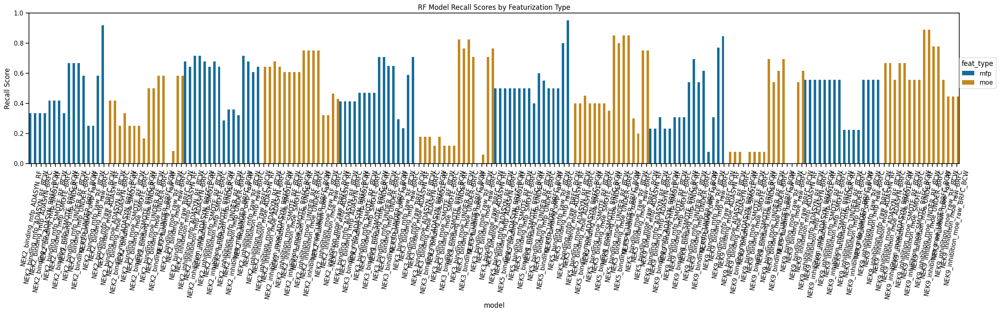

In [728]:
plot_df = df_all
dflong = plot_df.melt(id_vars=['NEK', 'dataset_category', 'model', 'feat_type', 'strategy'],
                      value_vars=['recall'], var_name='Metric', value_name='Metric_value')
dflong = dflong.sort_values(by=['NEK', 'strategy'], ascending=[True, True])
sns.set_context('notebook')

sns.set_palette('colorblind')
plt.figure(figsize=(25, 8))
dflong.sort_values(['NEK', 'feat_type'],inplace=True)
grid = sns.barplot(data=dflong, x='model', y='Metric_value', hue='feat_type', dodge=True, width=1)
plt.ylabel('Recall Score')
plt.xticks(rotation=80)
plt.ylim(0,1.0)
sns.move_legend(grid, (1., 0.5))
plt.tight_layout(pad=2.0)
plt.title('RF Model Recall Scores by Featurization Type')

# Display the plot
plt.show()
# plt.figure(figsize=(25, 7)) 
# plt.ylim(0,1.0)
# plt.bar(plot_df['model'],plot_df['recall'])
# plt.xticks(rotation=80)
# plt.tight_layout(pad=2.5)
# plt.show();

In [729]:
print('RF average recall scores')
for nek in neks: 
    nek_df = df_all[df_all['NEK']==nek]
    average_recall = nek_df['recall'].mean()
    print(f'{nek} average recall score: {average_recall}')

RF average recall scores
NEK2_binding average recall score: 0.4140625
NEK2_inhibition average recall score: 0.5915178571428572
NEK3_binding average recall score: 0.4338235294117647
NEK5_binding average recall score: 0.5421875
NEK9_binding average recall score: 0.3365384615384615
NEK9_inhibition average recall score: 0.5520833333333334


In [733]:
!pip install openpyxl
datapath = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_results/'
df2 = pd.read_csv(datapath+'all_NEK_RF_metrics_no_gs.csv')
df2['strategy'] = df2['strategy'].str.replace('scaled', 'raw')
df2.set_index(['NEK',  'strategy', 'feat_type', 'RF_type'], inplace=True)
df2.sort_values(['NEK','strategy'])
df2.to_csv(datapath+'RF_results_by_strategy.csv', index=True)
df2.to_excel(datapath+'RF_results_by_strategy.xlsx', index=True)
display(df2)

accuracy  precision    recall  \
NEK             strategy feat_type RF_type                                   
NEK2_binding    raw      moe       RF        0.918728   0.133333  0.166667   
                                   RF_BCW    0.939929   0.142857  0.083333   
                                   BRFC      0.731449   0.078947  0.500000   
                                   BRFC_BCW  0.706714   0.091954  0.666667   
                UNDER    moe       RF        0.561837   0.069231  0.750000   
...                                               ...        ...       ...   
NEK9_inhibition SMOTE    mfp       BRFC_BCW  0.900000   0.555556  0.555556   
                ADASYN   mfp       RF        0.875000   0.454545  0.555556   
                                   RF_BCW    0.875000   0.454545  0.555556   
                                   BRFC      0.875000   0.454545  0.555556   
                                   BRFC_BCW  0.875000   0.454545  0.555556   

                                             specificity   TN  FN   FP  TP  \
NEK             strategy feat_type RF_type                                   
NEK2_binding    raw      moe       RF           0.952030  258  10   13   2   
                                   RF_BCW       0.977860  265  11    6   1   
                                   BRFC         0.741697  201   6   70   6   
                                   BRFC_BCW     0.708487  192   4   79   8   
                UNDER    moe       RF           0.553506  150   3  121   9   
...                                                  ...  ...  ..  ...  ..   
NEK9_inhibition SMOTE    mfp       BRFC_BCW     0.943662   67   4    4   5   
                ADASYN   mfp       RF           0.915493   65   4    6   5   
                                   RF_BCW       0.915493   65   4    6   5   
                                   BRFC         0.915493   65   4    6   5   
                                   BRFC_BCW     0.915493   65   4    6   5   

                                                                           model  \
NEK             strategy feat_type RF_type                                         
NEK2_binding    raw      moe       RF                 NEK2_binding_moe_scaled_RF   
                                   RF_BCW         NEK2_binding_moe_scaled_RF_BCW   
                                   BRFC             NEK2_binding_moe_scaled_BRFC   
                                   BRFC_BCW     NEK2_binding_moe_scaled_BRFC_BCW   
                UNDER    moe       RF                  NEK2_binding_moe_UNDER_RF   
...                                                                          ...   
NEK9_inhibition SMOTE    mfp       BRFC_BCW   NEK9_inhibition_mfp_SMOTE_BRFC_BCW   
                ADASYN   mfp       RF              NEK9_inhibition_mfp_ADASYN_RF   
                                   RF_BCW      NEK9_inhibition_mfp_ADASYN_RF_BCW   
                                   BRFC          NEK9_inhibition_mfp_ADASYN_BRFC   
                                   BRFC_BCW  NEK9_inhibition_mfp_ADASYN_BRFC_BCW   

                                                           cm   ROC-AUC  \
NEK             strategy feat_type RF_type                                
NEK2_binding    raw      moe       RF        [258, 13, 10, 2]  0.559348   
                                   RF_BCW     [265, 6, 11, 1]  0.530597   
                                   BRFC       [201, 70, 6, 6]  0.620849   
                                   BRFC_BCW   [192, 79, 4, 8]  0.687577   
                UNDER    moe       RF        [150, 121, 3, 9]  0.651753   
...                                                       ...       ...   
NEK9_inhibition SMOTE    mfp       BRFC_BCW     [67, 4, 4, 5]  0.749609   
                ADASYN   mfp       RF           [65, 6, 4, 5]  0.735524   
                                   RF_BCW       [65, 6, 4, 5]  0.735524   
                                   BRFC         [65, 6, 4, 5]  0.735524   
                      

In [753]:
df3 = pd.read_csv(datapath+'all_NEK_RF_metrics_no_gs.csv')
df3['strategy'] = df3['strategy'].str.replace('scaled', 'raw')

df3.set_index(['NEK', 'RF_type', 'strategy' ,'feat_type'],inplace=True)


df3 = df3.sort_values(['NEK','RF_type', 'strategy'])

df3.to_csv(datapath+'RF_results_by_RF_type.csv', index=True)
df3.to_excel(datapath+'RF_results_by_RF_type.xlsx', index=True)
# display(df3)


In [755]:
df4 = pd.read_csv(datapath+'all_NEK_RF_metrics_no_gs.csv')
df4['strategy'] = df4['strategy'].str.replace('scaled', 'raw')
df4.set_index(['NEK', 'feat_type', 'strategy','RF_type'],inplace=True)
df4 = df4.sort_values(['NEK','feat_type', 'strategy'])
df4.to_csv(datapath+'RF_results_by_feat_type.csv', index=True)
df4.to_excel(datapath+'RF_results_by_feat_type.xlsx', index=True)
df4.head(32)

accuracy  precision    recall  \
NEK          feat_type strategy RF_type                                   
NEK2_binding mfp       ADASYN   RF        0.936396   0.312500  0.416667   
                                RF_BCW    0.939929   0.333333  0.416667   
                                BRFC      0.936396   0.312500  0.416667   
                                BRFC_BCW  0.939929   0.333333  0.416667   
                       SMOTE    RF        0.925795   0.235294  0.333333   
                                RF_BCW    0.925795   0.235294  0.333333   
                                BRFC      0.925795   0.235294  0.333333   
                                BRFC_BCW  0.925795   0.235294  0.333333   
                       UNDER    RF        0.611307   0.054545  0.500000   
                                RF_BCW    0.593640   0.052174  0.500000   
                                BRFC      0.593640   0.052174  0.500000   
                                BRFC_BCW  0.614841   0.055046  0.500000   
                       raw      RF        0.946996   0.333333  0.250000   
                                RF_BCW    0.936396   0.333333  0.500000   
                                BRFC      0.823322   0.148148  0.666667   
                                BRFC_BCW  0.487633   0.076433  1.000000   
             moe       ADASYN   RF        0.915194   0.125000  0.166667   
                                RF_BCW    0.911661   0.157895  0.250000   
                                BRFC      0.918728   0.133333  0.166667   
                                BRFC_BCW  0.915194   0.166667  0.250000   
                       SMOTE    RF        0.943463   0.300000  0.250000   
                                RF_BCW    0.946996   0.333333  0.250000   
                                BRFC      0.943463   0.300000  0.250000   
                                BRFC_BCW  0.939929   0.272727  0.250000   
                       UNDER    RF        0.561837   0.069231  0.750000   
                                RF_BCW    0.671378   0.054945  0.416667   
                                BRFC      0.554770   0.068182  0.750000   
                                BRFC_BCW  0.639576   0.058824  0.500000   
                       raw      RF        0.918728   0.133333  0.166667   
                                RF_BCW    0.939929   0.142857  0.083333   
                                BRFC      0.731449   0.078947  0.500000   
                                BRFC_BCW  0.706714   0.091954  0.666667   

                                          specificity   TN  FN   FP  TP  \
NEK          feat_type strategy RF_type                                   
NEK2_binding mfp       ADASYN   RF           0.959410  260   7   11   5   
                                RF_BCW       0.963100  261   7   10   5   
                                BRFC         0.959410  260   7   11   5   
                                BRFC_BCW     0.963100  261   7   10   5   
                       SMOTE    RF           0.952030  258   8   13   4   
                                RF_BCW       0.952030  258   8   13   4   
                                BRFC         0.952030  258   8   13   4   
                                BRFC_BCW     0.952030  258   8   13   4   
                       UNDER    RF           0.616236  167   6  104   6   
                                RF_BCW       0.597786  162   6  109   6   
                                BRFC         0.597786  162   6  109   6   
                                BRFC_BCW     0.619926  168   6  103   6   
                       raw      RF           0.977860  265   9    6   3   
                                RF_BCW       0.955720  259   6   12   6   
                                BRFC         0.830258  225   4   46   8   
                                BRFC_BCW     0.464945  126   0  145  12   
             moe       ADASYN   RF           0.948339  257  10   14   2   
                                RF_BCW       0.940959  255   9   1